## Importación de dependencias

In [1]:
import pandas as pd # Librería para la manipulación y el análisis de datos
import numpy as np # Librería para la manipulación de datos y para la ejecución de operaciones matemáticas
import matplotlib.pyplot as plt # Librería para la visualización de datos
import seaborn as sns # Librería para la visualización de datos

from sklearn import set_config

# transformers
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, OneHotEncoder, LabelEncoder, MinMaxScaler

# pipelines
from sklearn.pipeline import Pipeline, FunctionTransformer
from sklearn.compose import ColumnTransformer

# model selection
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, StratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

# model evaluation
from sklearn.inspection import permutation_importance
from sklearn.metrics import accuracy_score

import sys
import os
import importlib

# Obtiene la ruta absoluta del directorio actual del script
# current_dir = os.path.dirname(os.path.abspath(__file__))  # python
current_dir = os.getcwd()                                   # jupyter notebook

# Obtiene la ruta al directorio 'src' (subiendo un nivel y entrando a src)
src_path = os.path.join(current_dir, '..', 'src')

# Lo añade al path de Python
sys.path.append(src_path)

# Ahora ya puedes importar
import utils
importlib.reload(utils);  # Forzar recarga si ya se había importado antes

1. Análisis univariable de los datos

- Tamaño del Dataset (tamaño en memoria, número de registros y atributos...)

- Visualización directa de los datos (head)

- Tipo de atributos disponibles (numéricos, categóricos)

- Estadísticos descriptivos (valores medios, dispersión, percentiles, etc.)

- Número de valores nulos

- Distribución / rango de valores del target (sólo en clasificación supervisada)

- Identificación de outliers

- Identificación de datos erróneos

- Correlación de variables con el target

- Correlación de las variables con la clase (unidimensional)

- Visualización gráfica de las distribuciones

  - Numéricas: histogramas, box plots , violin plots , vista por deciles

  - Categóricas: bar charts, conteo directo, etc.



2. Análisis multivariable:

- Distribución de variables 2 a 2 ( scatter plots ...)

- Correlación de las variables 2 a 2 (correlación lineal)

- Cross tabs

- Correlación de combinaciones de variables con la clase



3. Limpieza de atributos:

- Ajuste de tipos

- Imputación de valores nulos (cero, media, moda, valor fijo, etc.) o eliminación de registros que los contengan

- Corrección de valores atípicos o eliminación de registros que los contengan

- Eliminación de atributos de baja varianza o con elevada correlación con otros



4. Transformación de atributos:

- Variable categóricas (OneHot, Label, Tipado, Agrupación)

- Variables numéricas (Escalado, categorización, redondeo)

- Variables fecha (conversión a tiempo numérico, Agregación, diferencias)

- Variables textuales (Numerización, extracción de patrones, palabras clave)



5. Generación de atributos:

- Generación de atributos por combinación de variables

- Añade una variable aleatoria al modelo



6. Selección de datos:

- Muestreo de registros (guiado, aleatorio o estratificado)

- Selección de atributos / Reducción de dimensionalidad



7. Partición y muestreo del dataset:

- Definición de estrategia de validación ( Random Holdout , k fold , Bootstrap , etc.)

- Definición de la política de partición (aleatorio o guiado)

- Definición de estrategias de remuestreo (mantener siempre la validación)

- Definición de la métrica de evaluación (sólo una métrica)



8. Evaluación de algoritmos:

- Definición del modelo de base ( Keep It Simple)

- Short list de algoritmos de distintos tipos



9. Optimización de modelos:

- Optimización de hiperparámetros

- Algoritmos de ensamble



10. Model Selection & Evaluation:

- Selección del modelo con mejor métrica en test

- Comprobación de rendimiento en validación (capacidad de generalización)



11. Recalibrado:

- En caso de que sea necesario, recalibrar los scorings para obtener la probabilidad real



12. Análisis y presentación de resultados:

- Presentación de la visión global del problema y contextualización

- Representación de variables más significativas

- Análisis de métricas o curvas de rendimiento

- Análisis de tipos de errores más habituales

- Representación directa de reglas del modelo o meta modelos tipo rule fit o Shapley Values

- Análisis unidimensional de variables y/o reglas



13. Operacionalización del modelo:

- Documentación de código

- Adaptación del código para entorno productivo

- Preparación de los sistemas para la operacionalización (paquetería, ...)

- Preparación del sistema de monitorización y alertas de caída de rendimiento



In [2]:
# Carga del dataset
df_inicial = pd.read_csv("Datasets/sample_mmp.csv");

C:\Users\j\AppData\Local\Temp\ipykernel_25740\1592731474.py:2: DtypeWarning: Columns (29,42) have mixed types. Specify dtype option on import or set low_memory=False.
  df_inicial = pd.read_csv("Datasets/sample_mmp.csv");


---

#### 1.1 Tamaño del Dataset (tamaño en memoria, número de registros y atributos...)

In [46]:
# Visualización de la forma y las primeras filas del DataFrame
display(df_inicial.info())
print("Shape:", df_inicial.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 84 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   Unnamed: 0                                         500000 non-null  int64  
 1   MachineIdentifier                                  500000 non-null  object 
 2   ProductName                                        500000 non-null  object 
 3   EngineVersion                                      500000 non-null  object 
 4   AppVersion                                         500000 non-null  object 
 5   AvSigVersion                                       500000 non-null  object 
 6   IsBeta                                             500000 non-null  int64  
 7   RtpStateBitfield                                   498168 non-null  float64
 8   IsSxsPassiveMode                                   500000 non-null  int64 

None

Shape: (500000, 84)


---
#### Visualización directa de los datos (head)

In [47]:
df_inicial.head(20)

,Unnamed: 0,MachineIdentifier,ProductName,EngineVersion,AppVersion,AvSigVersion,IsBeta,RtpStateBitfield,IsSxsPassiveMode,DefaultBrowsersIdentifier,...,Census_FirmwareVersionIdentifier,Census_IsSecureBootEnabled,Census_IsWIMBootEnabled,Census_IsVirtualDevice,Census_IsTouchEnabled,Census_IsPenCapable,Census_IsAlwaysOnAlwaysConnectedCapable,Wdft_IsGamer,Wdft_RegionIdentifier,HasDetections
0,8427007,f1cd864e97bae82bdf96523e1a539121,win8defender,1.1.15100.1,4.18.1807.18075,1.273.1234.0,0,7.0,0,NaN,...,19951.0,0,NaN,0.0,0,0,0.0,0.0,11.0,1
1,8829090,fd5ba6f5b75325ec0423a6c67cc75942,win8defender,1.1.15100.1,4.18.1807.18075,1.273.1282.0,0,7.0,0,NaN,...,48753.0,0,0.0,0.0,0,0,0.0,1.0,3.0,0
2,2731904,4e628391e7cc7c482fb3286f486dbd25,win8defender,1.1.15100.1,4.9.10586.1106,1.273.781.0,0,7.0,0,NaN,...,33111.0,1,0.0,0.0,1,1,0.0,0.0,15.0,0
3,1359513,270a2e9d028144a4df12a9e3da79fba5,win8defender,1.1.15200.1,4.18.1807.18075,1.275.1639.0,0,7.0,0,NaN,...,48473.0,1,NaN,0.0,0,0,0.0,0.0,15.0,1
4,236059,06ca8fa8d32c2abdc5b3577d676b3269,win8defender,1.1.15200.1,4.18.1807.18075,1.275.511.0,0,7.0,0,NaN,...,4343.0,1,NaN,0.0,1,0,0.0,1.0,13.0,1
5,3771983,6c3ff3036d3ecc96729a615653742608,win8defender,1.1.15200.1,4.18.1807.18075,1.275.981.0,0,7.0,0,NaN,...,19973.0,1,0.0,0.0,0,0,0.0,0.0,11.0,1
6,4833329,8ab73b7f8dbb0d0d57f54a8b4799e960,win8defender,1.1.15200.1,4.18.1807.18075,1.275.497.0,0,7.0,0,NaN,...,8712.0,0,0.0,0.0,0,0,0.0,0.0,15.0,0
7,985557,1c4ec21828b563afb6b0aa72ef88926d,win8defender,1.1.15100.1,4.18.1806.18062,1.273.293.0,0,7.0,0,NaN,...,NaN,0,NaN,0.0,0,0,0.0,0.0,7.0,1
8,387390,0b247aa88737776d0f88ce4dee447216,win8defender,1.1.15100.1,4.18.1807.18075,1.273.418.0,0,7.0,0,NaN,...,20106.0,1,NaN,0.0,0,0,0.0,0.0,3.0,0
9,7131823,cc9e1141a127a305cddc17baaa36bcb3,win8defender,1.1.15200.1,4.18.1807.18075,1.275.511.0,0,7.0,0,NaN,...,63370.0,0,NaN,0.0,0,0,0.0,0.0,10.0,1


---
#### Tipo de atributos disponibles

In [7]:
numeric, bools, datetimes, objects, categories, timedeltas, complex_cols, ints, floats, others = utils.columnas_por_tipo(df_inicial)
grouped = utils.columnas_por_tipo(df_inicial, as_dict=True)
grouped

{'all': ['Unnamed: 0',
  'MachineIdentifier',
  'ProductName',
  'EngineVersion',
  'AppVersion',
  'AvSigVersion',
  'IsBeta',
  'RtpStateBitfield',
  'IsSxsPassiveMode',
  'DefaultBrowsersIdentifier',
  'AVProductStatesIdentifier',
  'AVProductsInstalled',
  'AVProductsEnabled',
  'HasTpm',
  'CountryIdentifier',
  'CityIdentifier',
  'OrganizationIdentifier',
  'GeoNameIdentifier',
  'LocaleEnglishNameIdentifier',
  'Platform',
  'Processor',
  'OsVer',
  'OsBuild',
  'OsSuite',
  'OsPlatformSubRelease',
  'OsBuildLab',
  'SkuEdition',
  'IsProtected',
  'AutoSampleOptIn',
  'PuaMode',
  'SMode',
  'IeVerIdentifier',
  'SmartScreen',
  'Firewall',
  'UacLuaenable',
  'Census_MDC2FormFactor',
  'Census_DeviceFamily',
  'Census_OEMNameIdentifier',
  'Census_OEMModelIdentifier',
  'Census_ProcessorCoreCount',
  'Census_ProcessorManufacturerIdentifier',
  'Census_ProcessorModelIdentifier',
  'Census_ProcessorClass',
  'Census_PrimaryDiskTotalCapacity',
  'Census_PrimaryDiskTypeName',
  

In [9]:
def reportar_distribucion_tipos(grouped_dict):
    """
    Imprime un reporte tabular de la distribución de columnas por tipo.
    """
    total = len(grouped_dict.get('all', []))
    
    # Excluir 'all' para el conteo de tipos
    keys = [k for k in grouped_dict.keys() if k != 'all']
    
    print(f"{'TIPO':<15} | {'CANTIDAD':<10} | {'PORCENTAJE':<10}")
    print("-" * 40)
    
    for k in keys:
        n = len(grouped_dict[k])
        perc = (n / total * 100) if total > 0 else 0
        print(f"{k.capitalize():<15} | {n:<10} | {perc:>8.2f}%")
    
    print("-" * 40)
    print(f"{'TOTAL':<15} | {total:<10} | 100.00%")

# Ejecución
reportar_distribucion_tipos(grouped)

TIPO            | CANTIDAD   | PORCENTAJE
----------------------------------------
Numeric         | 54         |    64.29%
Int             | 18         |    21.43%
Float           | 36         |    42.86%
Bool            | 0          |     0.00%
Datetime        | 0          |     0.00%
Object          | 30         |    35.71%
Category        | 0          |     0.00%
Timedelta       | 0          |     0.00%
Complex         | 0          |     0.00%
Others          | 0          |     0.00%
----------------------------------------
TOTAL           | 84         | 100.00%


---
#### Estadísticos descriptivos (valores medios, dispersión, percentiles, etc.)

In [49]:
print(len(numeric))
for col in numeric:
    if col not in ['Unnamed: 0']:
        print(df_inicial[col].describe())

54
count    500000.000000
mean          0.000002
std           0.001414
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: IsBeta, dtype: float64
count    498168.000000
mean          6.846207
std           1.023049
min           0.000000
25%           7.000000
50%           7.000000
75%           7.000000
max          35.000000
Name: RtpStateBitfield, dtype: float64
count    500000.000000
mean          0.017242
std           0.130172
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: IsSxsPassiveMode, dtype: float64
count    24061.000000
mean      1652.824529
std       1004.754276
min          1.000000
25%        788.000000
50%       1632.000000
75%       2381.000000
max       3209.000000
Name: DefaultBrowsersIdentifier, dtype: float64
count    498062.000000
mean      47850.908413
std       14023.085346
min           3.000000
25%       49480.000000

In [55]:
print(len(categories)+len(objects))
for col in categories + objects:
    if col not in ['MachineIdentifier']:
        print(df_inicial[col].value_counts())

30
ProductName
win8defender     494604
mse                5395
mseprerelease         1
Name: count, dtype: int64
EngineVersion
1.1.15200.1    216491
1.1.15100.1    205494
1.1.15000.2     14752
1.1.14901.4     11984
1.1.14600.4      9005
1.1.14800.3      7548
1.1.15300.6      6769
1.1.14104.0      5240
1.1.15300.5      3883
1.1.13504.0      3876
1.1.14700.5      2593
1.1.14500.5      2591
1.1.14405.2      1972
1.1.14306.0      1329
1.1.14202.0       840
1.1.14003.0       804
1.1.13303.0       516
1.1.13903.0       515
1.1.13804.0       513
1.1.13407.0       479
1.1.13601.0       420
1.1.12902.0       321
1.1.14305.0       270
1.1.13701.0       255
1.1.13704.0       255
1.1.13202.0       245
1.1.13103.0       235
1.1.13000.0       220
1.1.15000.1       138
1.1.12805.0       115
1.1.14901.3        71
1.1.14700.4        65
1.1.14700.3        61
1.1.14800.1        51
1.1.14500.2        19
1.1.14201.0        11
1.1.14303.0        10
1.1.12101.0         7
1.1.14103.0         5
1.1.13902.0    

In [98]:
datos[datos['Census_IsAlwaysOnAlwaysConnectedCapable'] == 1]['Platform'].value_counts()

Platform
windows10    18786
windows8       374
Name: count, dtype: int64

In [99]:
datos[datos['Census_IsAlwaysOnAlwaysConnectedCapable'] == 1]['OsPlatformSubRelease'].value_counts()

OsPlatformSubRelease
rs1           4825
rs3           4678
rs4           4133
th2           3023
rs2           1194
th1            899
windows8.1     374
prers5          34
Name: count, dtype: int64

---
#### Número de valores nulos

In [52]:
for i in df_inicial.columns:
    prctj = df_inicial[i].isnull().mean() * 100
    quantity = df_inicial[i].isnull().sum()
    print(f'{prctj:3.3f}% \t {quantity} \tde nulos en {i}')

0.000% 	 0 	de nulos en Unnamed: 0
0.000% 	 0 	de nulos en MachineIdentifier
0.000% 	 0 	de nulos en ProductName
0.000% 	 0 	de nulos en EngineVersion
0.000% 	 0 	de nulos en AppVersion
0.000% 	 0 	de nulos en AvSigVersion
0.000% 	 0 	de nulos en IsBeta
0.366% 	 1832 	de nulos en RtpStateBitfield
0.000% 	 0 	de nulos en IsSxsPassiveMode
95.188% 	 475939 	de nulos en DefaultBrowsersIdentifier
0.388% 	 1938 	de nulos en AVProductStatesIdentifier
0.388% 	 1938 	de nulos en AVProductsInstalled
0.388% 	 1938 	de nulos en AVProductsEnabled
0.000% 	 0 	de nulos en HasTpm
0.000% 	 0 	de nulos en CountryIdentifier
3.648% 	 18240 	de nulos en CityIdentifier
30.913% 	 154563 	de nulos en OrganizationIdentifier
0.003% 	 16 	de nulos en GeoNameIdentifier
0.000% 	 0 	de nulos en LocaleEnglishNameIdentifier
0.000% 	 0 	de nulos en Platform
0.000% 	 0 	de nulos en Processor
0.000% 	 0 	de nulos en OsVer
0.000% 	 0 	de nulos en OsBuild
0.000% 	 0 	de nulos en OsSuite
0.000% 	 0 	de nulos en OsPlatformS

In [ ]:
utils.auditoria_nulos(df_inicial)

Auditoría de nulos en el DataFrame:
Columnas afectadas:
PuaMode                                              499874
Census_ProcessorClass                                497918
DefaultBrowsersIdentifier                            475939
Census_IsFlightingInternal                           415225
Census_InternalBatteryType                           355603
Census_ThresholdOptIn                                318104
Census_IsWIMBootEnabled                              317666
SmartScreen                                          178596
OrganizationIdentifier                               154563
SMode                                                 29848
CityIdentifier                                        18240
Wdft_IsGamer                                          16950
Wdft_RegionIdentifier                                 16950
Census_InternalBatteryNumberOfCharges                 15038
Census_FirmwareManufacturerIdentifier                 10349
Census_FirmwareVersionIdentifier            

n_nulos
1         12
2       1206
3      41377
4      75682
5      44877
6      13511
7      86611
8     144885
9      61292
10     15718
11      6977
12      2669
13      1266
14       646
15       394
16       415
17       372
18       474
19       637
20       462
21       305
22       132
23        53
24        18
25         8
26         1
Name: count, dtype: int64


Ejemplo de filas con múltiples nulos (Top 5):


,Unnamed: 0,MachineIdentifier,ProductName,EngineVersion,AppVersion,AvSigVersion,IsBeta,RtpStateBitfield,IsSxsPassiveMode,DefaultBrowsersIdentifier,...,Census_IsSecureBootEnabled,Census_IsWIMBootEnabled,Census_IsVirtualDevice,Census_IsTouchEnabled,Census_IsPenCapable,Census_IsAlwaysOnAlwaysConnectedCapable,Wdft_IsGamer,Wdft_RegionIdentifier,HasDetections,n_nulos
372619,1989884,391c303c3690a85dcdf86f382e217d60,win8defender,1.1.15100.1,4.12.16299.15,1.273.1167.0,0,7.0,0,NaN,...,0,NaN,0.0,0,0,NaN,0.0,11.0,1,26
313370,838948,181b01363fe0da1f7d41d49a2ea5b01b,win8defender,1.1.15200.1,4.12.16299.15,1.275.223.0,0,7.0,0,NaN,...,1,NaN,0.0,0,0,NaN,NaN,NaN,0,25
383203,5163140,942befe91950bc3a52862d3230ab4c54,win8defender,1.1.15200.1,4.18.1807.18075,1.275.1231.0,0,7.0,0,NaN,...,0,NaN,0.0,0,0,NaN,NaN,NaN,0,25
219778,8850296,fdf6cfe2eb462da0ffb54283533d24c6,win8defender,1.1.14500.5,4.12.17007.18011,1.261.1541.0,0,7.0,0,NaN,...,0,NaN,0.0,0,0,NaN,NaN,NaN,0,25
118873,8708106,f9de5bef7b06b4b7d9a2bd25aa3a56d0,win8defender,1.1.15100.1,4.11.15063.1155,1.273.1167.0,0,NaN,0,NaN,...,0,NaN,0.0,0,0,NaN,NaN,NaN,0,25


,Unnamed: 0,MachineIdentifier,ProductName,EngineVersion,AppVersion,AvSigVersion,IsBeta,RtpStateBitfield,IsSxsPassiveMode,DefaultBrowsersIdentifier,...,Census_IsSecureBootEnabled,Census_IsWIMBootEnabled,Census_IsVirtualDevice,Census_IsTouchEnabled,Census_IsPenCapable,Census_IsAlwaysOnAlwaysConnectedCapable,Wdft_IsGamer,Wdft_RegionIdentifier,HasDetections,n_nulos
0,8427007,f1cd864e97bae82bdf96523e1a539121,win8defender,1.1.15100.1,4.18.1807.18075,1.273.1234.0,0,7.0,0,NaN,...,0,NaN,0.0,0,0,0.0,0.0,11.0,1,8
1,8829090,fd5ba6f5b75325ec0423a6c67cc75942,win8defender,1.1.15100.1,4.18.1807.18075,1.273.1282.0,0,7.0,0,NaN,...,0,0.0,0.0,0,0,0.0,1.0,3.0,0,5
2,2731904,4e628391e7cc7c482fb3286f486dbd25,win8defender,1.1.15100.1,4.9.10586.1106,1.273.781.0,0,7.0,0,NaN,...,1,0.0,0.0,1,1,0.0,0.0,15.0,0,4
3,1359513,270a2e9d028144a4df12a9e3da79fba5,win8defender,1.1.15200.1,4.18.1807.18075,1.275.1639.0,0,7.0,0,NaN,...,1,NaN,0.0,0,0,0.0,0.0,15.0,1,8
4,236059,06ca8fa8d32c2abdc5b3577d676b3269,win8defender,1.1.15200.1,4.18.1807.18075,1.275.511.0,0,7.0,0,NaN,...,1,NaN,0.0,1,0,0.0,1.0,13.0,1,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499995,5826339,a739cacc292f3f1e745827c1ca6c6ada,win8defender,1.1.15200.1,4.18.1807.18075,1.275.1090.0,0,7.0,0,NaN,...,1,0.0,0.0,1,0,0.0,1.0,10.0,0,4
499996,5740034,a4c232d528d98343e8f1b73650da7b82,win8defender,1.1.15100.1,4.18.1807.18075,1.273.1620.0,0,7.0,0,NaN,...,0,NaN,0.0,0,0,0.0,0.0,15.0,0,9
499997,8819786,fd16cd542d660848d272e4552bcccb1e,win8defender,1.1.15300.5,4.13.17134.112,1.275.1343.0,0,7.0,0,NaN,...,0,NaN,0.0,0,0,0.0,0.0,8.0,0,9
499998,8713685,fa0841f8f6147de7c3d287e05270ed42,win8defender,1.1.15100.1,4.14.17639.18041,1.273.483.0,0,7.0,0,NaN,...,0,NaN,0.0,0,0,0.0,0.0,1.0,0,8


---
#### Distribución / rango de valores del target (sólo en clasificación supervisada)

Resumen Ejecutivo del Target: HasDetections
   count  nunique     mean
500000.0      2.0 0.499906

Distribución de Clases:
               Conteo  Frecuencia (%)
HasDetections                        
0              250047         50.0094
1              249953         49.9906


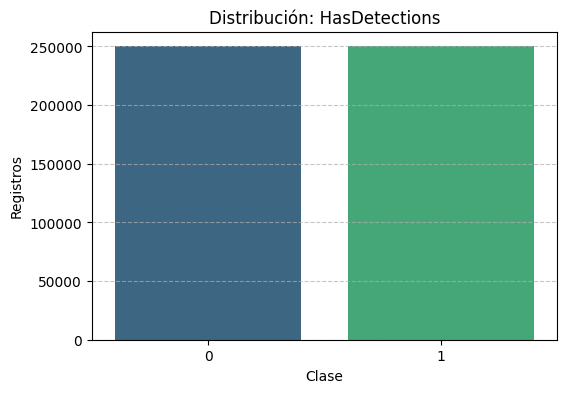

In [10]:
target = 'HasDetections'
# 1. Estadísticos descriptivos básicos
stats = df_inicial[target].agg(['count', 'nunique', 'mean']).to_frame().T
counts = df_inicial[target].value_counts(dropna=False)
dist = df_inicial[target].value_counts(normalize=True, dropna=False).mul(100)

# 2. Consolidación de reporte
report = pd.DataFrame({
    'Conteo': counts,
    'Frecuencia (%)': dist.round(4)
})

print(f"Resumen Ejecutivo del Target: {target}")
print(stats.to_string(index=False))
print("\nDistribución de Clases:")
print(report)

# 3. Visualización mínima
plt.figure(figsize=(6, 4))
sns.barplot(x=counts.index, y=counts.values, hue=counts.index, palette='viridis', legend=False)
plt.title(f"Distribución: {target}")
plt.ylabel("Registros")
plt.xlabel("Clase")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

---
#### Identificación de outliers

In [11]:
utils.detectar_outliers_iqr(df_inicial, numeric+ints+floats);

IsBeta: 1 outliers detectados (0.00%)
RtpStateBitfield: 13327 outliers detectados (2.67%)
IsSxsPassiveMode: 8621 outliers detectados (1.72%)
AVProductStatesIdentifier: 105616 outliers detectados (21.12%)
AVProductsInstalled: 543 outliers detectados (0.11%)
AVProductsEnabled: 12883 outliers detectados (2.58%)
HasTpm: 6092 outliers detectados (1.22%)
OrganizationIdentifier: 8148 outliers detectados (1.63%)
OsBuild: 54108 outliers detectados (10.82%)
IsProtected: 27001 outliers detectados (5.40%)
AutoSampleOptIn: 14 outliers detectados (0.00%)
SMode: 206 outliers detectados (0.04%)
IeVerIdentifier: 34029 outliers detectados (6.81%)
Firewall: 10767 outliers detectados (2.15%)
UacLuaenable: 3101 outliers detectados (0.62%)
Census_OEMNameIdentifier: 52495 outliers detectados (10.50%)
Census_OEMModelIdentifier: 3353 outliers detectados (0.67%)
Census_ProcessorCoreCount: 55605 outliers detectados (11.12%)
Census_ProcessorManufacturerIdentifier: 58625 outliers detectados (11.72%)
Census_Process

---
#### Identificación de datos erróneos

In [145]:
df_inicial['SmartScreen'].value_counts() # Error de mayúsculas y minúsculas, códigos corruptos

SmartScreen
RequireAdmin    241594
ExistsNotSet     58497
Off              10388
Warn              7530
Prompt            1950
Block             1274
off                 75
On                  53
&#x02;              20
&#x01;              14
on                   8
requireadmin         1
Name: count, dtype: int64

count    4.993770e+05
mean     1.372503e+01
std      8.995848e+03
min      0.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      1.000000e+00
max      6.357062e+06
Name: UacLuaenable, dtype: float64
count    1.500000e+01
mean     4.238459e+05
std      1.641375e+06
min      2.000000e+00
25%      4.800000e+01
50%      4.800000e+01
75%      4.800000e+01
max      6.357062e+06
Name: UacLuaenable, dtype: float64


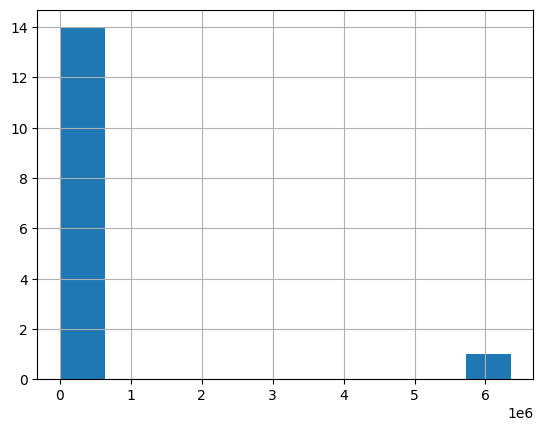

In [80]:
print(df_inicial['UacLuaenable'].describe()) #Valores fuera del binario  y tipo erróneo
print(df_inicial[df_inicial['UacLuaenable'] > 1]['UacLuaenable'].describe())
df_inicial[df_inicial['UacLuaenable'] > 1]['UacLuaenable'].hist();

count    497350.000000
mean       1548.304317
std         368.565945
min          -1.000000
25%        1366.000000
50%        1366.000000
75%        1920.000000
max       11520.000000
Name: Census_InternalPrimaryDisplayResolutionHorizontal, dtype: float64
count    4.0
mean    -1.0
std      0.0
min     -1.0
25%     -1.0
50%     -1.0
75%     -1.0
max     -1.0
Name: Census_InternalPrimaryDisplayResolutionHorizontal, dtype: float64


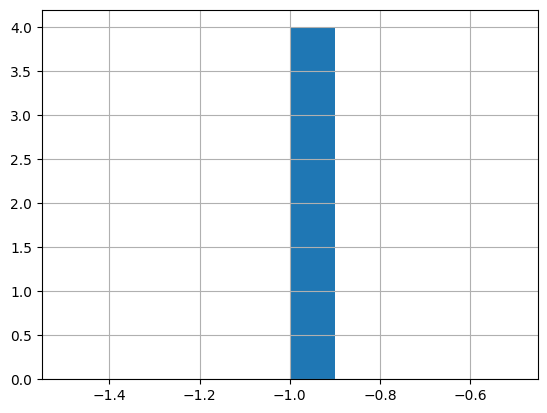

In [ ]:
print(df_inicial['Census_InternalPrimaryDisplayResolutionHorizontal'].describe()) #Valores fuera del rango realista
print(df_inicial[df_inicial['Census_InternalPrimaryDisplayResolutionHorizontal'] < 300]['Census_InternalPrimaryDisplayResolutionHorizontal'].describe())
df_inicial[df_inicial['Census_InternalPrimaryDisplayResolutionHorizontal'] < 300]['Census_InternalPrimaryDisplayResolutionHorizontal'].hist();

count    4.849620e+05
mean     1.125600e+09
std      1.888768e+09
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      4.294967e+09
max      4.294967e+09
Name: Census_InternalBatteryNumberOfCharges, dtype: float64
count    1.457360e+05
mean     3.745631e+09
std      1.434441e+09
min      3.010000e+02
25%      4.294967e+09
50%      4.294967e+09
75%      4.294967e+09
max      4.294967e+09
Name: Census_InternalBatteryNumberOfCharges, dtype: float64


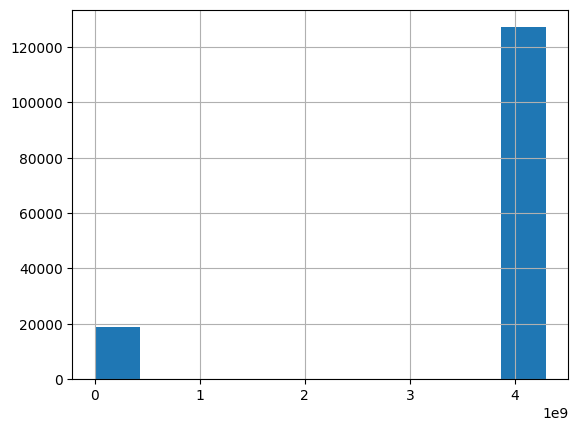

In [ ]:
print(df_inicial['Census_InternalBatteryNumberOfCharges'].describe()) #Valores fuera del rango habitual
print(df_inicial[df_inicial['Census_InternalBatteryNumberOfCharges'] > 300]['Census_InternalBatteryNumberOfCharges'].describe())
df_inicial[df_inicial['Census_InternalBatteryNumberOfCharges'] > 300]['Census_InternalBatteryNumberOfCharges'].hist();

In [ ]:
print(df_inicial['Census_ChassisTypeName'].value_counts()) #Valores imputados incorrectamente UNKNOWN y Unknown
# df_inicial['Census_ChassisTypeName'].hist();

Census_ChassisTypeName
Notebook               294232
Desktop                104979
Laptop                  38261
Portable                20181
AllinOne                11407
MiniTower                4849
Convertible              4685
Other                    4215
UNKNOWN                  3695
Detachable               2930
LowProfileDesktop        2878
HandHeld                 2652
SpaceSaving              1689
Tablet                    730
Tower                     692
Unknown                   575
MainServerChassis         512
MiniPC                    261
LunchBox                  224
RackMountChassis          189
SubNotebook                47
BusExpansionChassis        38
30                         11
StickPC                     7
0                           5
MultisystemChassis          3
PizzaBox                    3
35                          3
Blade                       3
31                          2
SubChassis                  2
32                          1
ExpansionChassis 

In [ ]:
print(df_inicial['Census_InternalBatteryType'].value_counts()) #Valores imputados incorrectamente pero se borrará la columna por nulos
# df_inicial['Census_InternalBatteryType'].hist();

Census_InternalBatteryType
lion    113500
li-i     13855
#        10176
lip       3326
liio      1814
li p       466
li         356
nimh       272
real       162
bq20       143
pbac       130
vbox        89
lgi0        29
unkn        19
lipo        13
lhp0        12
ithi         7
4cel         6
ram          5
batt         3
bad          3
lipp         3
virt         2
a132         2
li-l         1
lgl0         1
icp3         1
3ion         1
Name: count, dtype: int64


In [90]:
print(df_inicial['SkuEdition'].value_counts()) #Valores imputados incorrectamente
# df_inicial['SkuEdition'].hist();

SkuEdition
Home               308567
Pro                181042
Invalid              4423
Education            2321
Enterprise           1999
Enterprise LTSB      1141
Cloud                 309
Server                198
Name: count, dtype: int64


In [ ]:
print(df_inicial['Census_PrimaryDiskTypeName'].value_counts()) #Valores imputados incorrectamente, UNKNOWN y Unspecified
# df_inicial['Census_PrimaryDiskTypeName'].hist();

Census_PrimaryDiskTypeName
HDD            325429
SSD            138155
UNKNOWN         20083
Unspecified     15624
Name: count, dtype: int64


In [12]:
def detectar_ruido_y_errores(df, cat_cols, num_cols):
    """
    Identifica anomalías semánticas y estructurales de forma vectorizada.
    """
    reporte = []

    # 1. Análisis de Categóricas: Inconsistencias de Case y Nulos Ocultos
    for col in cat_cols:
        s = df[col].astype(str).str.lower().str.strip()
        
        # Detectar nulos camuflados (unknown, nan, unspecified, etc.)
        nulos_ocultos = s.isin(['unknown', 'nan', 'unspecified', '', 'none', 'null']).sum()
        
        # Detectar colapso de cardinalidad (ej: 'Unknown' vs 'unknown')
        unicos_raw = df[col].nunique()
        unicos_lower = s.nunique()
        
        if nulos_ocultos > 0 or unicos_raw != unicos_lower:
            reporte.append({
                'Columna': col,
                'Nulos Ocultos': nulos_ocultos,
                'Diferencia Case': unicos_raw - unicos_lower,
                'Tipo Error': 'Inconsistencia Semántica/Case'
            })

    # 2. Análisis de Numéricas: Valores fuera de dominio lógico
    # Definimos umbrales físicos/lógicos
    logic_checks = {
        'Census_InternalPrimaryDisplayResolutionHorizontal': lambda x: x < 300,
        'UacLuaenable': lambda x: ~x.isin([0, 1]),
        'Census_InternalBatteryNumberOfCharges': lambda x: x > 1e5 # Ejemplo de ruido extremo
    }

    for col, check in logic_checks.items():
        if col in df.columns:
            invalidos = check(df[col]).sum()
            if invalidos > 0:
                reporte.append({
                    'Columna': col,
                    'Valores Fuera Rango': invalidos,
                    'Tipo Error': 'Ruido/Error de Dominio'
                })

    return pd.DataFrame(reporte)

# Ejecución profesional
errores_df = detectar_ruido_y_errores(df_inicial, objects, numeric+ints+floats)
print(errores_df.to_string(index=False))

                                          Columna  Nulos Ocultos  Diferencia Case                    Tipo Error  Valores Fuera Rango
                                       OsBuildLab            1.0             -1.0 Inconsistencia Semántica/Case                  NaN
                                          PuaMode       499874.0             -1.0 Inconsistencia Semántica/Case                  NaN
                                      SmartScreen       178596.0              2.0 Inconsistencia Semántica/Case                  NaN
                            Census_ProcessorClass       497918.0             -1.0 Inconsistencia Semántica/Case                  NaN
                       Census_PrimaryDiskTypeName        36416.0             -1.0 Inconsistencia Semántica/Case                  NaN
                           Census_ChassisTypeName         4307.0              0.0 Inconsistencia Semántica/Case                  NaN
                     Census_PowerPlatformRoleName         1174.0     

In [15]:
# Check de inconsistencia: ¿Cuántos valores únicos se pierden al normalizar a minúsculas?
inconsistencias = {col: df_inicial[col].nunique() - df_inicial[col].astype(str).str.lower().nunique() 
                  for col in objects}
{k: v for k, v in inconsistencias.items() if v > 0}

# --- Caso: UacLuaenable (Valores fuera de binario 0,1) ---
err_uac = df_inicial[~df_inicial['UacLuaenable'].isin([0, 1])]['UacLuaenable']
print(f"UacLuaenable - Errores: {len(err_uac)} | Valores: {err_uac.unique()}")

# --- Caso: Resoluciones Irreales (< 300px) ---
res_col = 'Census_InternalPrimaryDisplayResolutionHorizontal'
err_res = df_inicial[df_inicial[res_col] < 300][res_col]
print(f"Resolución - Errores: {len(err_res)} | Rango: [{err_res.min()}, {err_res.max()}]")

# --- Caso: Batería (Cargas imposibles > 100,000) ---
bat_col = 'Census_InternalBatteryNumberOfCharges'
err_bat = df_inicial[df_inicial[bat_col] > 1e5][bat_col]
print(f"Batería - Errores: {len(err_bat)} | Max detectado: {err_bat.max()}")

# Verificación rápida de términos sospechosos en columnas críticas
terminos_ruido = ['unknown', 'unspecified', 'not set', 'nan', 'null']
for col in ['SmartScreen', 'Census_ChassisTypeName', 'Census_PrimaryDiskTypeName']:
    mask = df_inicial[col].astype(str).str.lower().isin(terminos_ruido)
    print(f"{col}: {mask.sum()} valores de ruido ({mask.mean()*100:.2f}%)")

UacLuaenable - Errores: 638 | Valores: [         nan 4.800000e+01 2.000000e+00 6.357062e+06]
Resolución - Errores: 4 | Rango: [-1.0, -1.0]
Batería - Errores: 127096 | Max detectado: 4294967295.0
SmartScreen: 178596 valores de ruido (35.72%)
Census_ChassisTypeName: 4307 valores de ruido (0.86%)
Census_PrimaryDiskTypeName: 36416 valores de ruido (7.28%)


---
#### Correlación de variables con el target

--- Top Variables con correlación > 0.05 (Ranking) ---


SmartScreen                               -0.164143
AVProductsInstalled                       -0.148761
AVProductStatesIdentifier                  0.116163
Processor                                 -0.071402
Census_OSArchitecture                     -0.070735
Census_IsAlwaysOnAlwaysConnectedCapable   -0.063120
Census_TotalPhysicalRAM                    0.060432
Wdft_IsGamer                               0.056858
IsProtected                                0.056203
Census_ProcessorCoreCount                  0.056069
AvSigVersion                               0.053617
EngineVersion                              0.050490
Census_IsVirtualDevice                    -0.050279
Name: HasDetections, dtype: float64

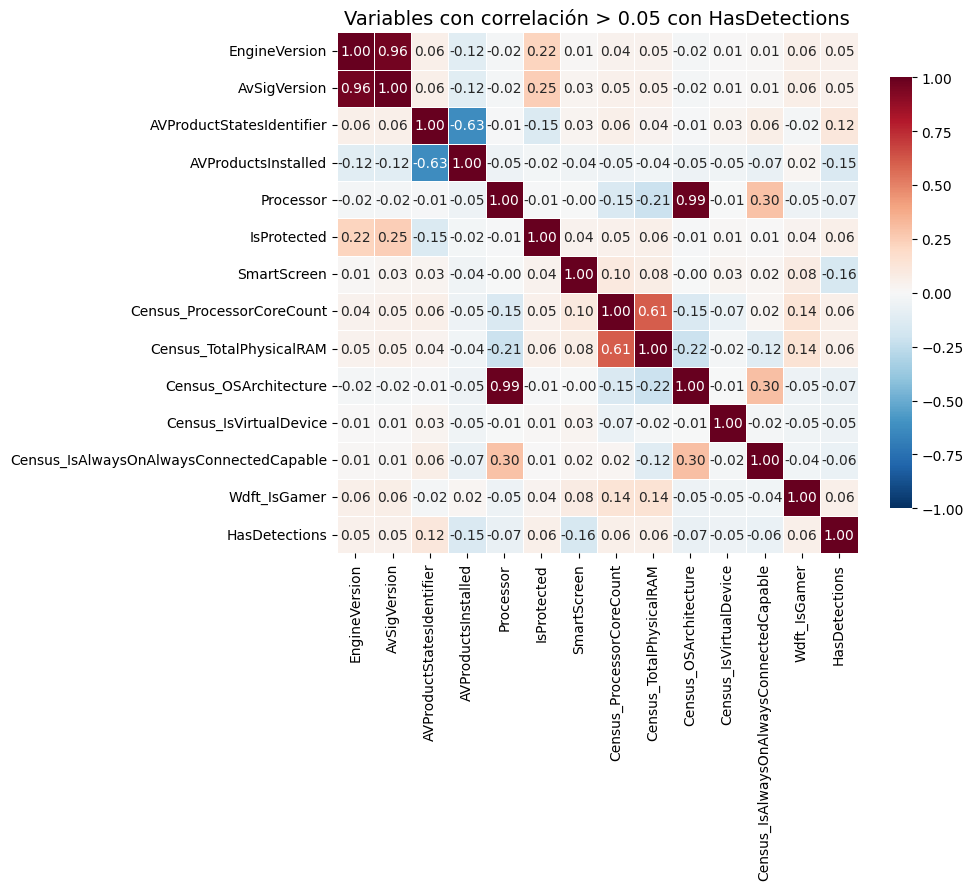

In [ ]:
target = 'HasDetections'
umbral = 0.05  # Ajustado a 0.05 porque en este dataset las correlaciones suelen ser bajas (< 0.15)

df_analisis = df_inicial.copy()
numerics = df_analisis.select_dtypes(include=['number']).columns.tolist()
cats_objs = df_analisis.select_dtypes(include=['object', 'category']).columns.tolist()
le = LabelEncoder()
for col in cats_objs:
    df_analisis[col] = df_analisis[col].astype(str)
    df_analisis[col] = le.fit_transform(df_analisis[col])

corrs_con_target = df_analisis.corr()[target]
features_importantes = corrs_con_target[abs(corrs_con_target) > umbral].drop(target)

print(f"--- Top Variables con correlación > {umbral} (Ranking) ---")
display(features_importantes.sort_values(key=abs, ascending=False))

cols_plot = features_importantes.index.tolist() + [target]
corr_matrix_plot = df_analisis[cols_plot].corr()

n_vars = len(cols_plot)
figsize_w = max(8, n_vars * 0.6) # Ajuste dinámico de tamaño
figsize_h = max(6, n_vars * 0.5)

plt.figure(figsize=(figsize_w, figsize_h))
sns.heatmap(corr_matrix_plot, 
            annot=True, 
            fmt=".2f", 
            cmap='RdBu_r', 
            center=0, 
            vmin=-1, vmax=1, 
            square=True, 
            linewidths=.5,
            cbar_kws={"shrink": .8})

plt.title(f'Variables con correlación > {umbral} con {target}', fontsize=14)
plt.show()

In [22]:
numerics_to_categorize = ['Census_FirmwareManufacturerIdentifier', 'Census_FirmwareVersionIdentifier', 
'CityIdentifier', 'Census_ProcessorModelIdentifier', 'Wdft_RegionIdentifier', 
'Census_OEMModelIdentifier', 'Census_OSInstallTypeName', 
'LocaleEnglishNameIdentifier', 'AVProductStatesIdentifier', 'CountryIdentifier']
numerics_to_boolerize = ['Wdft_IsGamer', 'UacLuaenable']
objects_to_categorize = ['SmartScreen', 'OsBuildLab', 'Census_OSEdition']

for col in numerics_to_categorize + objects_to_categorize:
    df_inicial[col] = df_inicial[col].astype('category')

for col in numerics_to_boolerize:
    df_inicial[col] = df_inicial[col].astype('bool')

numeric, bools, datetimes, objects, categories, timedeltas, complex_cols, ints, floats, others = utils.columnas_por_tipo(df_inicial)

from scipy.stats import chi2_contingency, pointbiserialr

def association_report(df, target, cat_cols, num_cols):
    results = []
    
    # 1. Categóricas: V de Cramér (Asociación)
    for col in cat_cols:
        confusion_matrix = pd.crosstab(df[col], df[target])
        chi2 = chi2_contingency(confusion_matrix)[0]
        n = confusion_matrix.sum().sum()
        phi2 = chi2 / n
        r, k = confusion_matrix.shape
        # Corrección de sesgo
        phi2_corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
        r_corr = r - ((r-1)**2)/(n-1)
        k_corr = k - ((k-1)**2)/(n-1)
        
        v_cramer = np.sqrt(phi2_corr / min((k_corr-1), (r_corr-1)))
        results.append({'feature': col, 'score': v_cramer, 'type': 'Cramér V'})

    # 2. Numéricas: Punto Biserial (Correlación específica para target binario)
    for col in num_cols:
        valid_idx = df[col].notna()
        # Solo calculamos si hay varianza
        if df.loc[valid_idx, col].nunique() > 1:
            pb_corr, _ = pointbiserialr(df.loc[valid_idx, target], df.loc[valid_idx, col])
            results.append({'feature': col, 'score': abs(pb_corr), 'type': 'Point Biserial'})

    return pd.DataFrame(results).sort_values('score', ascending=False)

# Ejecución (tras categorizar/boolerizar según tu lógica)
# Asumiendo que 'objects' y 'numeric' son las listas de tu agrupador por tipos
reporte_corr = association_report(df_inicial, 'HasDetections', categories, numeric+ints+floats)
print(reporte_corr.head(10))
# plt.figure(figsize=(10, 6))
# sns.barplot(data=reporte_corr, x='score', y='feature', hue='type')
# plt.axvline(0.05, color='red', linestyle='--', label='Umbral relevancia')
# plt.title('Capacidad Predictiva de Variables respecto al Target')
# plt.show()

                             feature     score            type
54                     HasDetections  1.000000  Point Biserial
70                     HasDetections  1.000000  Point Biserial
5                        SmartScreen  0.281927        Cramér V
0          AVProductStatesIdentifier  0.194366        Cramér V
18               AVProductsInstalled  0.148761  Point Biserial
73               AVProductsInstalled  0.148761  Point Biserial
6          Census_OEMModelIdentifier  0.145293        Cramér V
7    Census_ProcessorModelIdentifier  0.126349        Cramér V
11  Census_FirmwareVersionIdentifier  0.113236        Cramér V
2                     CityIdentifier  0.093251        Cramér V


                         feature    score           type
                     SmartScreen 0.281927       Cramér V
       AVProductStatesIdentifier 0.194366       Cramér V
             AVProductsInstalled 0.147791 Point Biserial
       Census_OEMModelIdentifier 0.145293       Cramér V
                    AvSigVersion 0.143957       Cramér V
                   EngineVersion 0.126415       Cramér V
 Census_ProcessorModelIdentifier 0.126349       Cramér V
Census_FirmwareVersionIdentifier 0.113236       Cramér V
                      AppVersion 0.106114       Cramér V
                  CityIdentifier 0.093251       Cramér V
                      OsBuildLab 0.091339       Cramér V
               CountryIdentifier 0.083037       Cramér V
                Census_OSVersion 0.075840       Cramér V
                       Processor 0.071690       Cramér V
           Census_OSArchitecture 0.070867       Cramér V


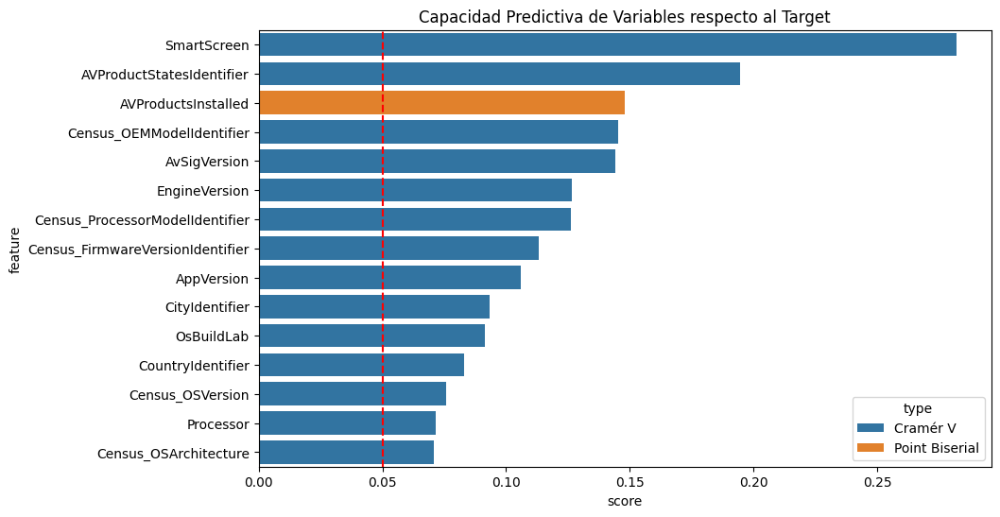

In [25]:
from scipy.stats import chi2_contingency, pointbiserialr

def analizar_asociacion_avanzada(df, target='HasDetections'):
    """
    Calcula la asociación de variables con el target sin dependencias de funciones externas.
    Incluye recategorización de identificadores numéricos.
    """
    # 1. Definición de dominios (Tipado manual)
    num_a_cat = [
        'Census_FirmwareManufacturerIdentifier', 'Census_FirmwareVersionIdentifier', 
        'CityIdentifier', 'Census_ProcessorModelIdentifier', 'Wdft_RegionIdentifier', 
        'Census_OEMModelIdentifier', 'AVProductStatesIdentifier', 'CountryIdentifier',
        'LocaleEnglishNameIdentifier'
    ]
    num_a_bool = ['Wdft_IsGamer', 'UacLuaenable']
    
    # 2. Separación dinámica de tipos
    # Obtenemos objetos/categorías originales + los que forzamos
    cats = df.select_dtypes(include=['object', 'category']).columns.tolist()
    cats = list(set(cats + num_a_cat))
    
    # Obtenemos numéricas excluyendo las que movimos a cat/bool y el target
    nums = df.select_dtypes(include=['number']).columns.tolist()
    nums = [c for c in nums if c not in cats and c not in num_a_bool and c != target]
    
    results = []

    # 3. Cálculo de V de Cramér (Categóricas)
    for col in cats:
        if col not in df.columns: continue
        # Crosstab es más eficiente que loop manual para chi2
        obs = pd.crosstab(df[col], df[target])
        chi2 = chi2_contingency(obs)[0]
        n = obs.sum().sum()
        r, k = obs.shape
        
        # Cramér V con corrección de sesgo
        phi2 = chi2 / n
        phi2_c = max(0, phi2 - ((k-1)*(r-1))/(n-1))
        r_c = r - ((r-1)**2)/(n-1)
        k_c = k - ((k-1)**2)/(n-1)
        
        v = np.sqrt(phi2_c / min((k_c-1), (r_c-1))) if min((k_c-1), (r_c-1)) > 0 else 0
        results.append({'feature': col, 'score': v, 'type': 'Cramér V'})

    # 4. Cálculo de Punto Biserial (Numéricas)
    for col in nums:
        if col not in df.columns: continue
        series = df[col].fillna(df[col].median()) # Imputación rápida para el test
        if series.nunique() > 1:
            r_pb, _ = pointbiserialr(df[target], series)
            results.append({'feature': col, 'score': abs(r_pb), 'type': 'Point Biserial'})

    # 5. Consolidación
    reporte = pd.DataFrame(results).sort_values('score', ascending=False)
    return reporte

# Ejecución directa
reporte_final = analizar_asociacion_avanzada(df_inicial)
print(reporte_final.head(15).to_string(index=False))

plt.figure(figsize=(10, 6))
sns.barplot(data=reporte_final.head(15), x='score', y='feature', hue='type')
plt.axvline(0.05, color='red', linestyle='--', label='Umbral relevancia')
plt.title('Capacidad Predictiva de Variables respecto al Target')
plt.show()

---
#### Correlación de las variables con la clase (unidimensional)

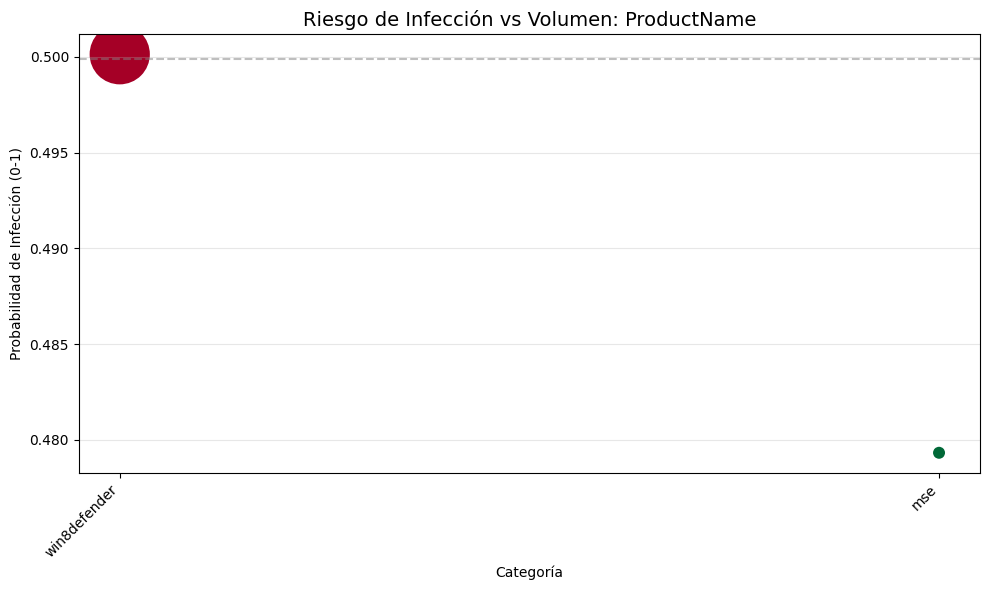

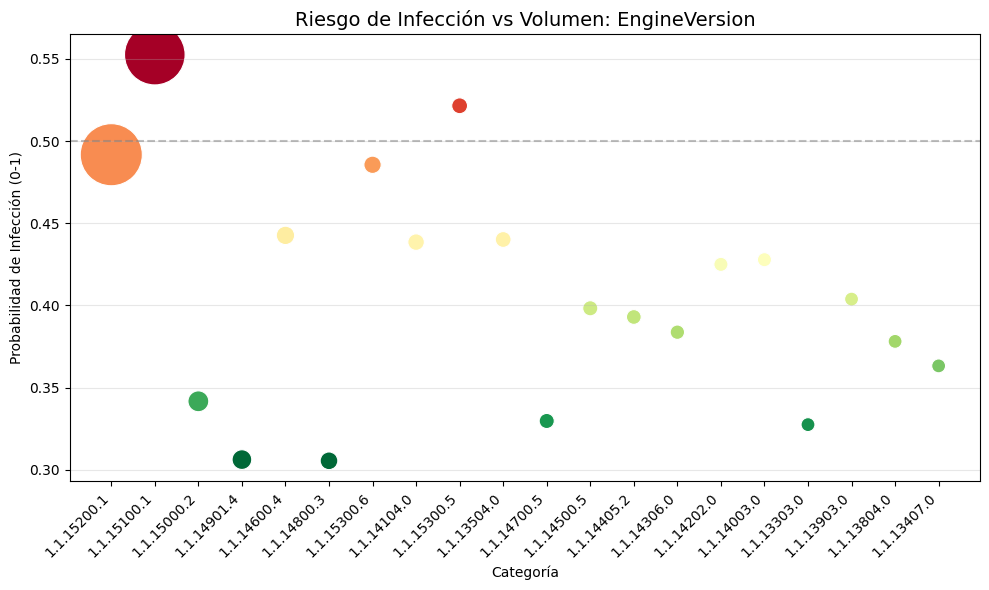

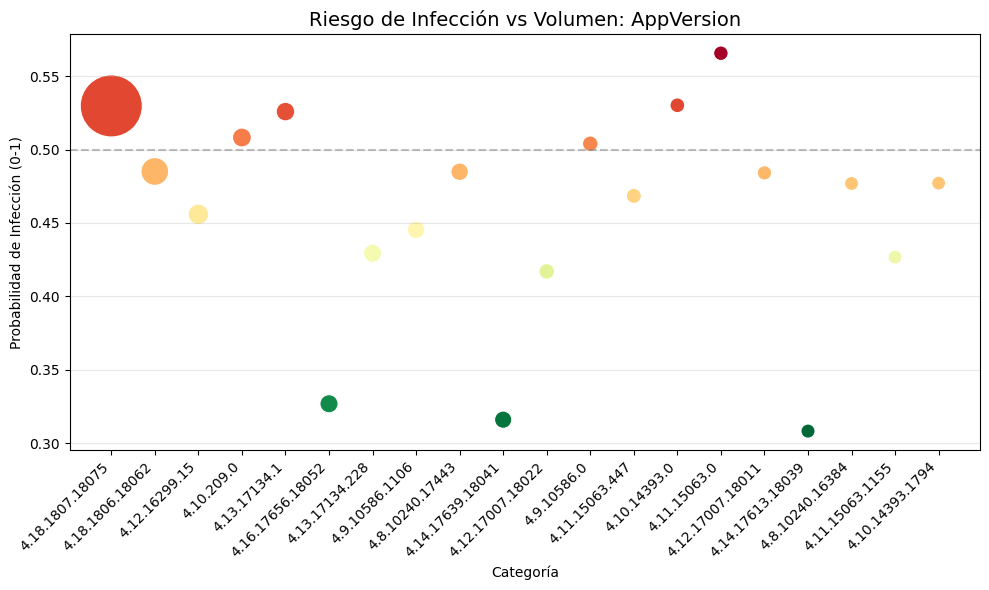

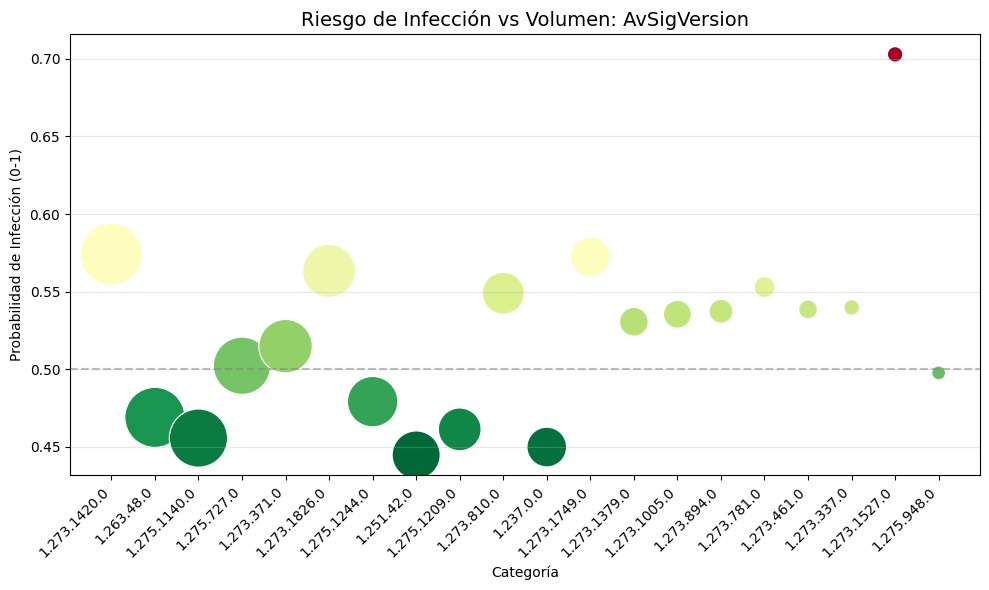

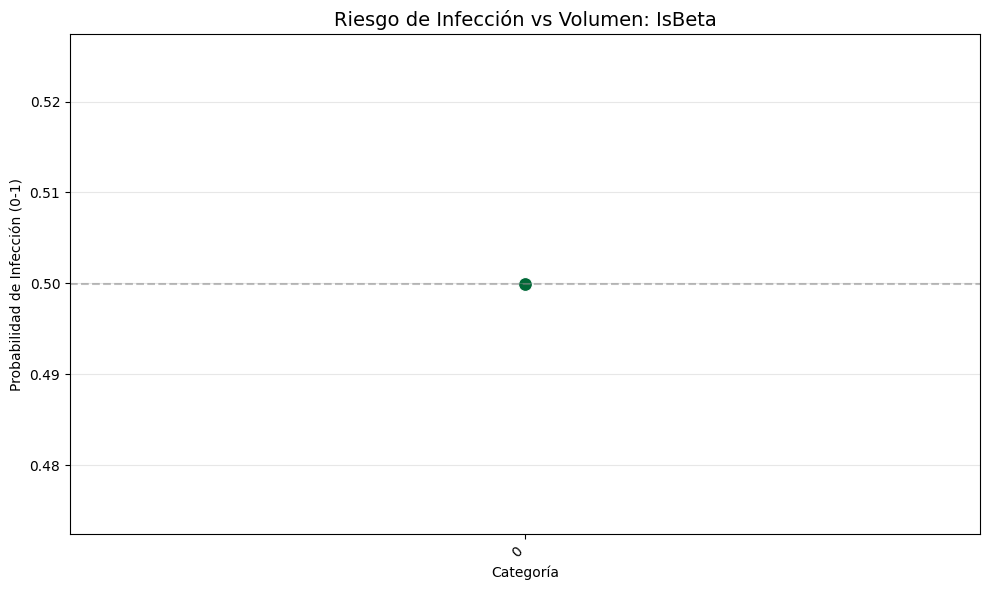

...

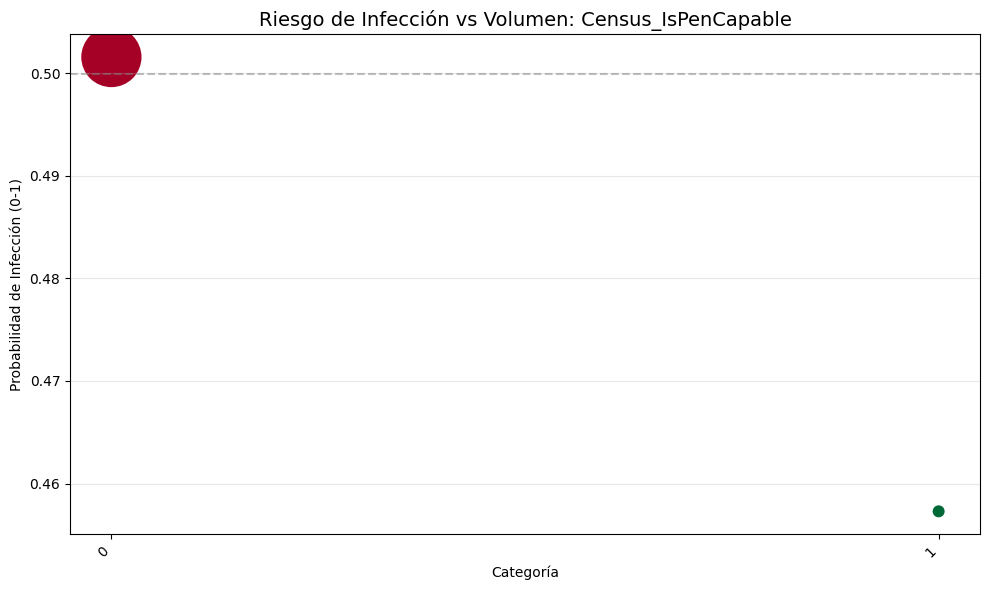

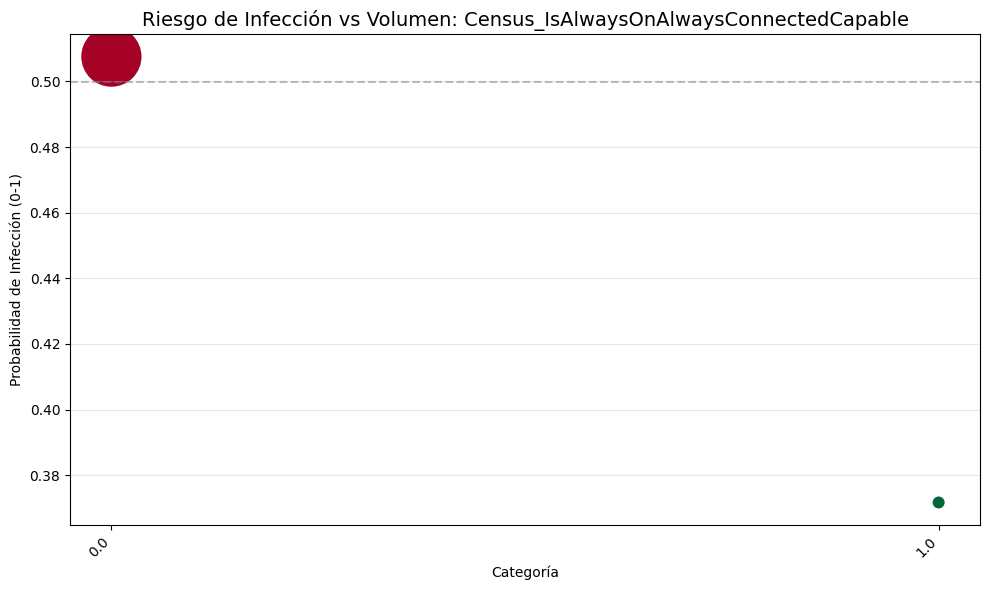

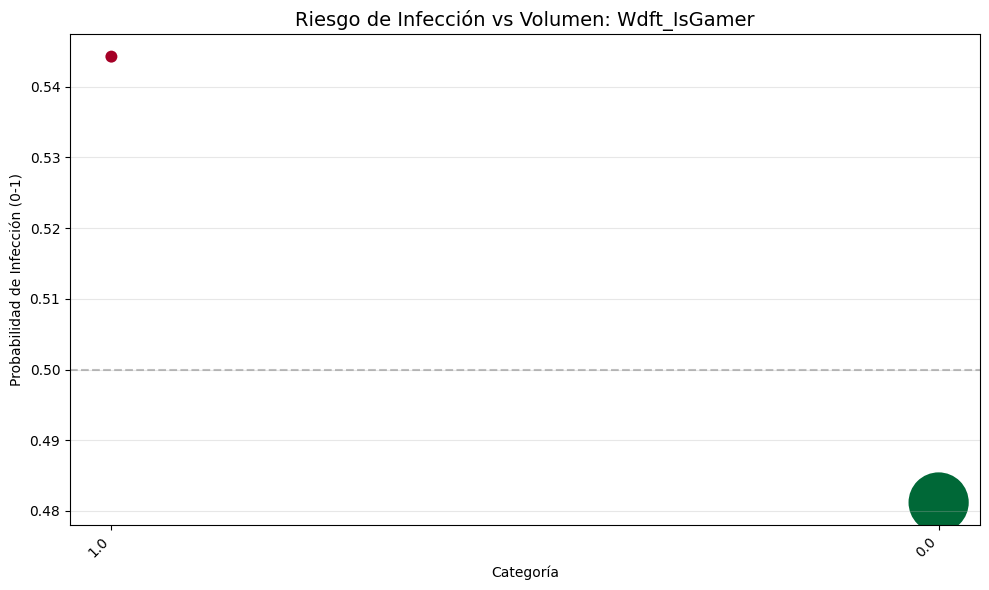

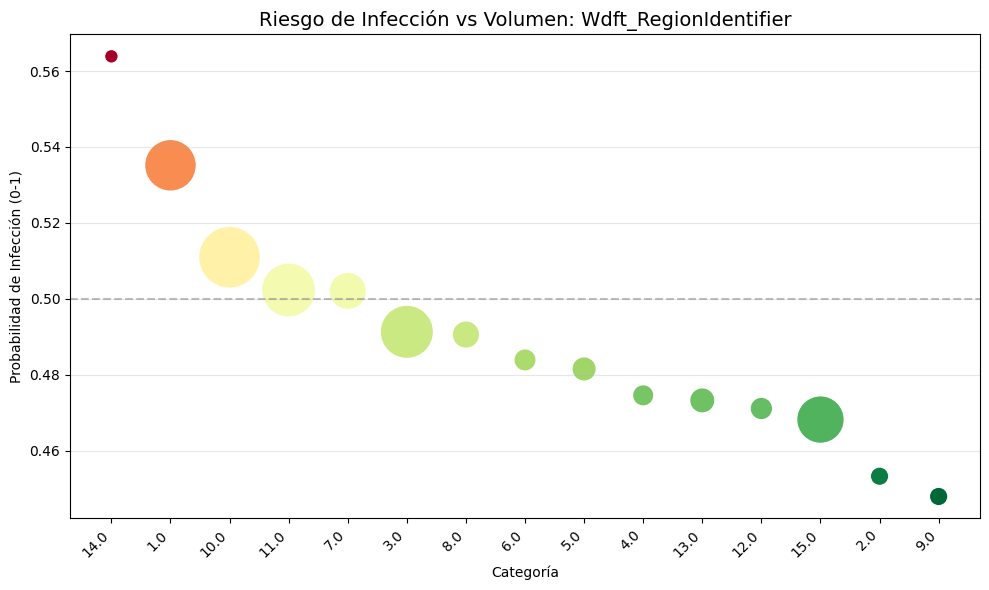

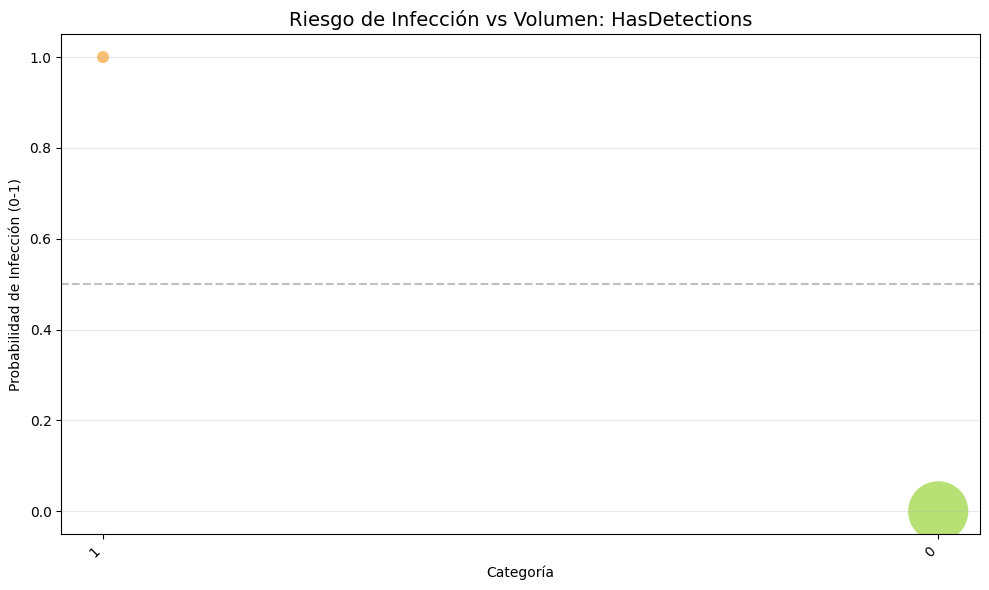

In [ ]:
for col in df_inicial.columns:
    # Verificamos si la columna existe en el df (por si cambiaste nombres)
    if col not in ['Unnamed: 0', 'MachineIdentifier']:
        # 1. Agregación (lo que ya tenías)
        relacion = df_inicial.groupby(col)['HasDetections'].agg(['mean', 'count'])
        
        # Filtro de ruido: Mínimo 100 muestras para que el punto sea significativo
        relacion_filtrada = relacion[relacion['count'] > 100].sort_values('mean', ascending=False)
        
        # Si hay demasiadas categorías (ej. versiones), cogemos solo las Top 20 más frecuentes
        if len(relacion_filtrada) > 20:
            relacion_filtrada = relacion_filtrada.sort_values('count', ascending=False).head(20)
        
        # 2. Visualización: BUBBLE PLOT (Tu idea de Relplot mejorada)
        plt.figure(figsize=(10, 6))
        
        # Scatterplot es la base de relplot para estos casos
        sns.scatterplot(
            data=relacion_filtrada,
            x=relacion_filtrada.index.astype(str), # Aseguramos que X sea categórico
            y='mean',
            size='count',        # El tamaño de la bola es la cantidad de datos (Style/Size)
            sizes=(100, 2000),   # Rango de tamaños para que se vea bien
            hue='mean',          # El color indica la gravedad (Target)
            palette='RdYlGn_r',  # Rojo = Alto riesgo, Verde = Bajo riesgo
            legend=False         # Ocultamos leyenda para limpiar si quieres
        )
        
        # Línea de referencia del promedio global (50% aprox)
        avg_global = df_inicial['HasDetections'].mean()
        plt.axhline(avg_global, color='grey', linestyle='--', alpha=0.5, label='Promedio Global')
        
        plt.title(f"Riesgo de Infección vs Volumen: {col}", fontsize=14)
        plt.ylabel("Probabilidad de Infección (0-1)")
        plt.xlabel("Categoría")
        plt.xticks(rotation=45, ha='right')
        plt.grid(axis='y', alpha=0.3)
        
        plt.tight_layout()
        plt.show()

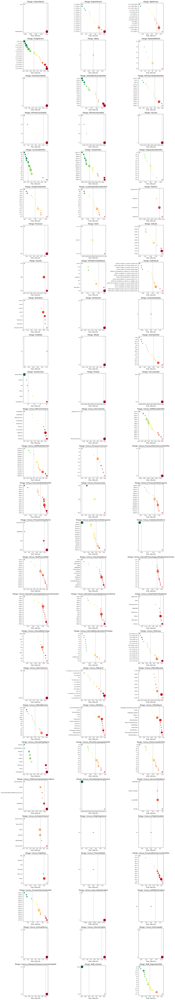

In [28]:
def visualizacion_unidimensional_riesgo(df, target='HasDetections', min_samples=100, top_n=15):
    # Filtro inicial de columnas irrelevantes
    cols = [c for c in df.columns if c not in [target, 'Unnamed: 0', 'MachineIdentifier']]
    avg_global = df[target].mean()
    
    n_cols = 3
    n_rows = (len(cols) + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 4 * n_rows))
    axes = axes.flatten()

    for i, col in enumerate(cols):
        # observed=True evita el FutureWarning en columnas categóricas
        stats = df.groupby(col, observed=True)[target].agg(['mean', 'count'])
        stats = stats[stats['count'] >= min_samples].nlargest(top_n, 'count').sort_values('mean')
        
        if not stats.empty:
            sns.scatterplot(
                ax=axes[i], x=stats['mean'], y=stats.index.astype(str),
                size=stats['count'], sizes=(40, 400), hue=stats['mean'],
                palette='RdYlGn_r', legend=False
            )
            axes[i].axvline(avg_global, color='black', linestyle='--', lw=1, alpha=0.5)
            axes[i].set(title=f"Riesgo: {col}", xlabel="Prob. Infección", ylabel="")
            axes[i].tick_params(labelsize=8)
        else:
            axes[i].axis('off')

    plt.tight_layout()
    plt.show()

visualizacion_unidimensional_riesgo(df_inicial)

---
#### Visualización gráfica de las distribuciones

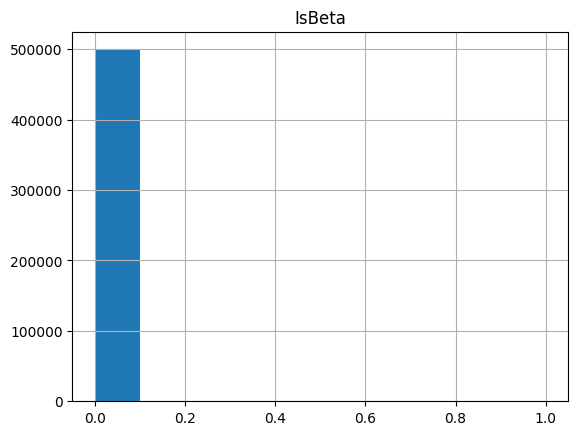

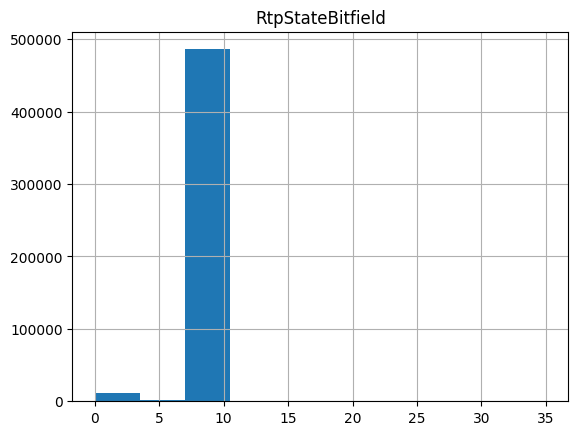

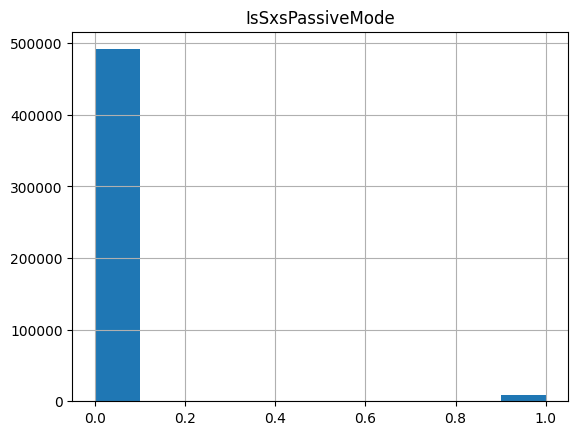

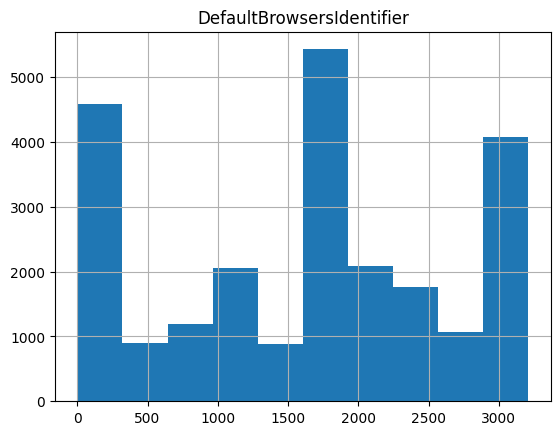

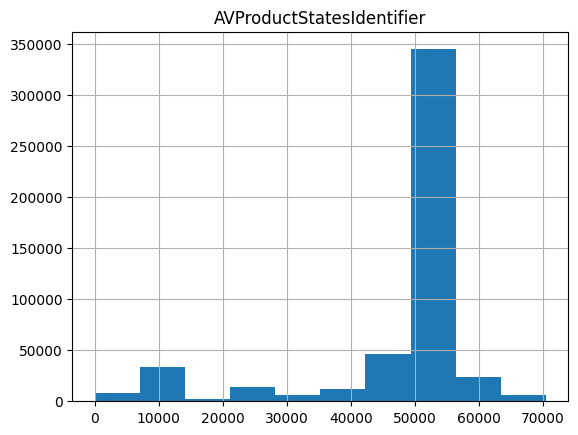

...

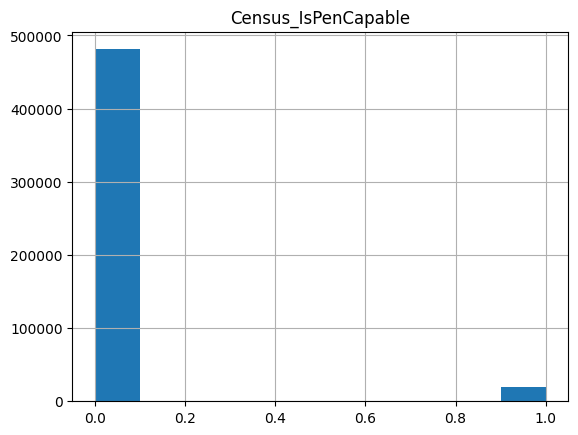

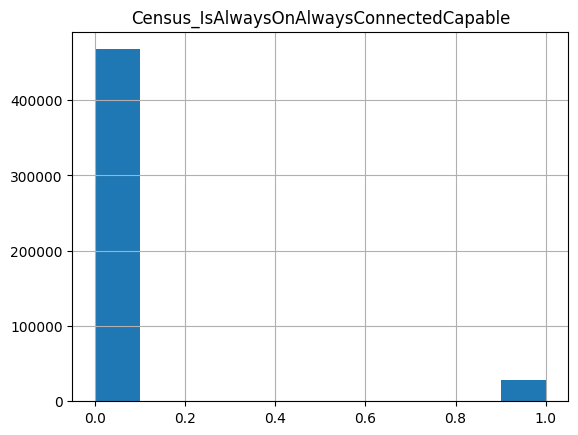

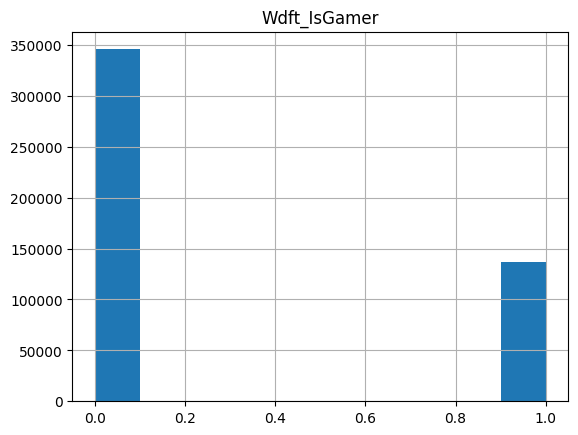

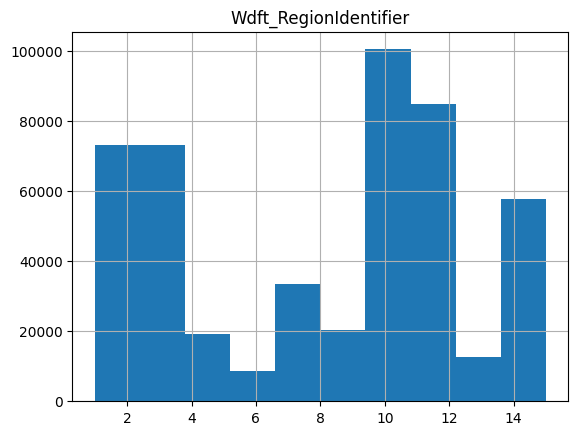

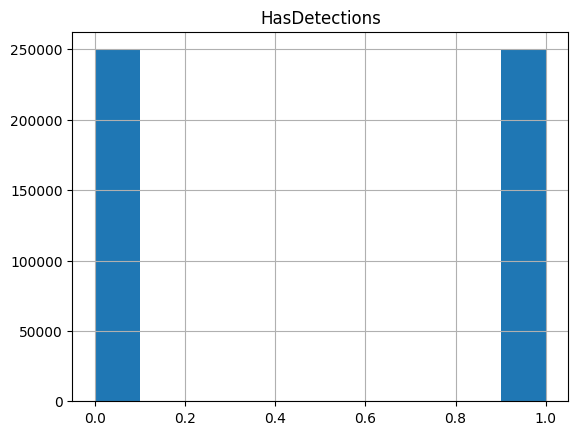

In [133]:
# Numéricas
for col in numeric:
    if col not in ['Unnamed: 0']:
        df_inicial[col].hist()
        plt.title(col)
        plt.show()

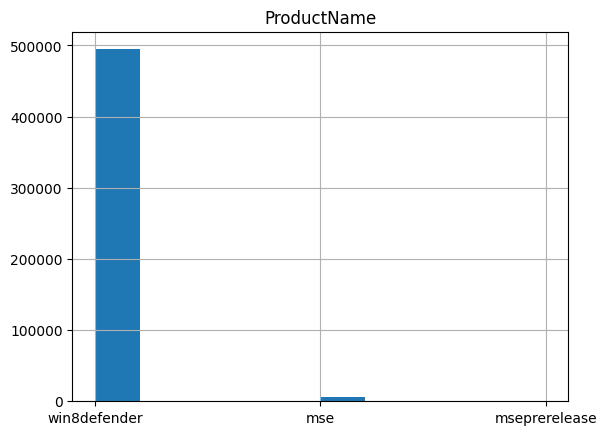

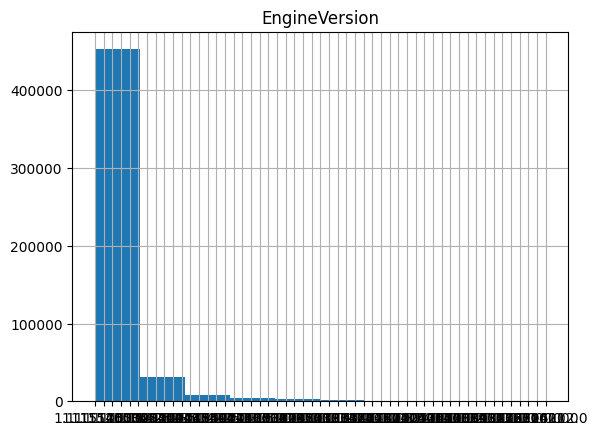

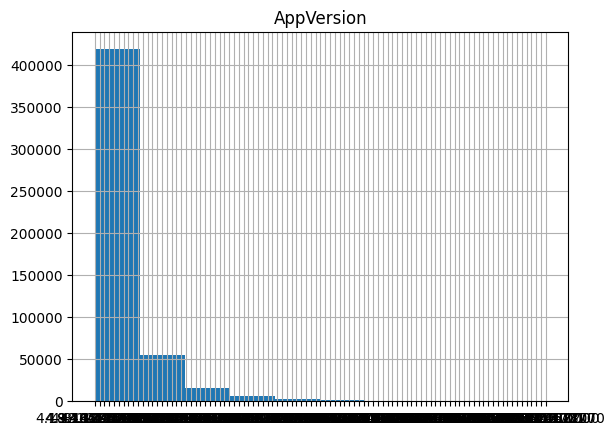

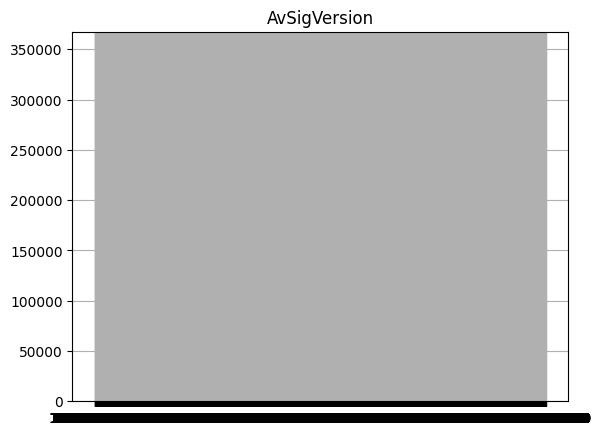

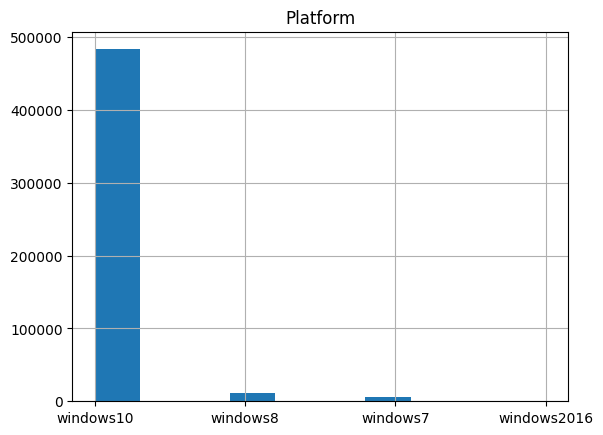

...

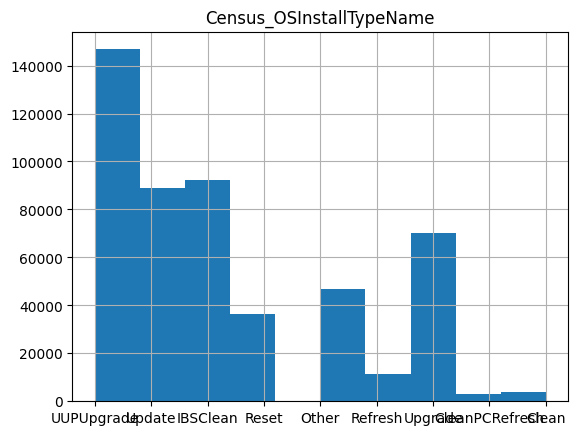

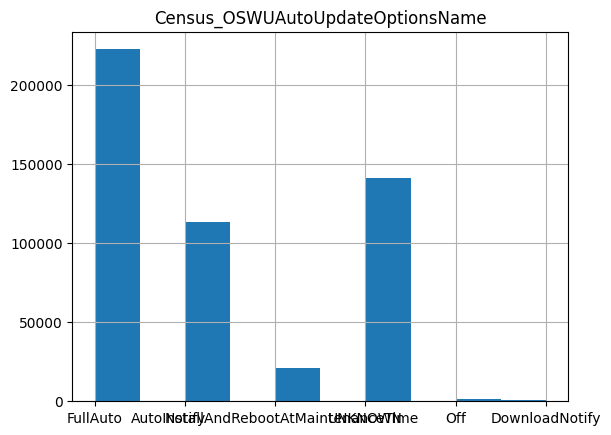

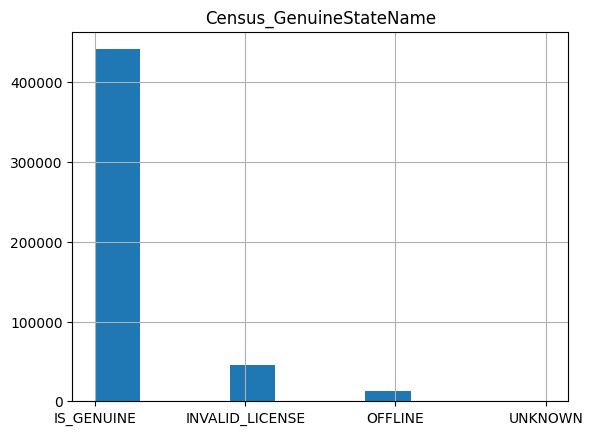

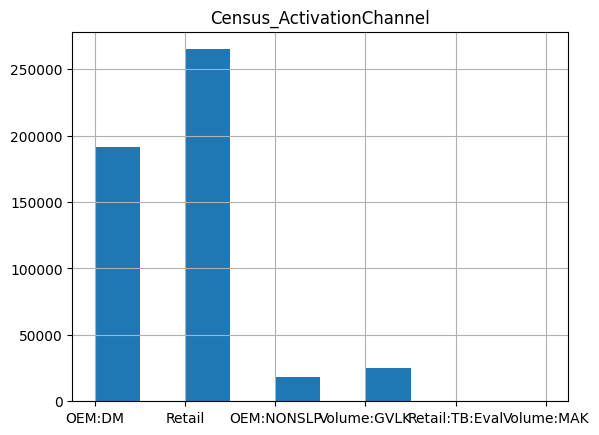

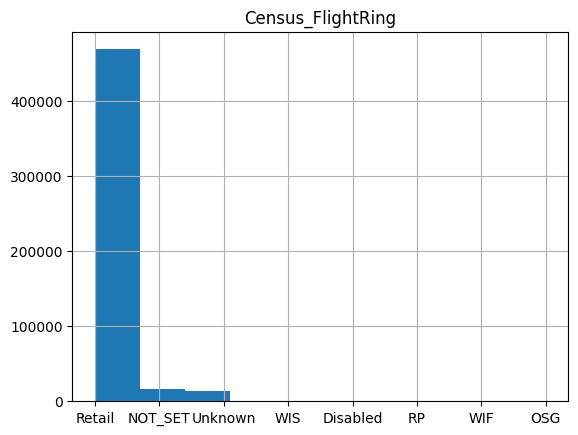

In [105]:
for col in categories + objects:
    if col not in ['MachineIdentifier']:
        df_inicial[col].hist()
        plt.title(col)
        plt.show()

---
### Análisis multivariable
---

---
Distribución variables 2 a 2 (scatter plots ...)

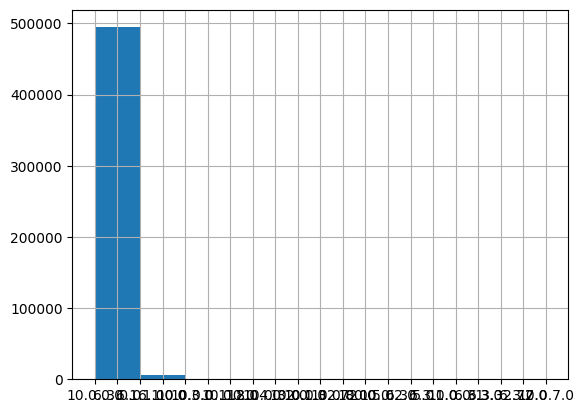

In [149]:
df_inicial.OsVer.hist();

In [154]:
target = 'HasDetections'
umbral = 0.05  # Ajustado a 0.05 porque en este dataset las correlaciones suelen ser bajas (< 0.15)

df_analisis = df_inicial.copy()
numerics = df_analisis.select_dtypes(include=['number']).columns.tolist()
cats_objs = df_analisis.select_dtypes(include=['object', 'category']).columns.tolist()
le = LabelEncoder()
for col in cats_objs:
    df_analisis[col] = df_analisis[col].astype(str)
    df_analisis[col] = le.fit_transform(df_analisis[col])

corrs_con_target = df_analisis.corr()
features_importantes = corrs_con_target[abs(corrs_con_target) > umbral].drop(target)

print(f"--- Top Variables con correlación > {umbral} (Ranking) ---")
display(features_importantes.sort_values(key=abs, ascending=False))

cols_plot = features_importantes.index.tolist()
corr_matrix_plot = df_analisis[cols_plot].corr()

n_vars = len(cols_plot)
figsize_w = max(8, n_vars * 0.6) # Ajuste dinámico de tamaño
figsize_h = max(6, n_vars * 0.5)

plt.figure(figsize=(figsize_w, figsize_h))
sns.heatmap(corr_matrix_plot, 
            annot=True, 
            fmt=".2f", 
            cmap='RdBu_r', 
            center=0, 
            vmin=-1, vmax=1, 
            square=True, 
            linewidths=.5,
            cbar_kws={"shrink": .8})

plt.title(f'Variables con correlación > {umbral} con {target}', fontsize=14)
plt.show()

--- Top Variables con correlación > 0.05 (Ranking) ---


TypeError: DataFrame.sort_values() missing 1 required positional argument: 'by'

In [ ]:
datos = df_inicial.copy()
datos['SmartScreen'] = datos['SmartScreen'].str.lower()
conteo = datos['SmartScreen'].value_counts()
valores_frecuentes = conteo[conteo >= 30].index
datos = datos[datos['SmartScreen'].isin(valores_frecuentes)]
datos.SmartScreen.str.lower().value_counts()

SmartScreen
requireadmin    241595
existsnotset     58497
off              10463
warn              7530
prompt            1950
block             1274
on                  61
Name: count, dtype: int64

In [164]:
df_numerics = df_inicial[numeric]
cols_to_drop = []
for col in df_numerics.columns:
    if col.endswith('Identifier'):
        cols_to_drop.append(col)
df_numerics = df_numerics.drop(columns=cols_to_drop, inplace=False, axis=1);
df_numerics.isnull().sum()

Unnamed: 0                                                0
IsBeta                                                    0
RtpStateBitfield                                       1832
IsSxsPassiveMode                                          0
AVProductsInstalled                                    1938
AVProductsEnabled                                      1938
HasTpm                                                    0
OsBuild                                                   0
OsSuite                                                   0
IsProtected                                            1926
AutoSampleOptIn                                           0
SMode                                                 29848
Firewall                                               5162
UacLuaenable                                            623
Census_ProcessorCoreCount                              2347
Census_PrimaryDiskTotalCapacity                        2976
Census_SystemVolumeTotalCapacity        

In [167]:
X = df_numerics.drop(columns=['HasDetections', 'Unnamed: 0'], axis=1)
y = df_numerics['HasDetections']

In [168]:
X.head()

,IsBeta,RtpStateBitfield,IsSxsPassiveMode,AVProductsInstalled,AVProductsEnabled,HasTpm,OsBuild,OsSuite,IsProtected,AutoSampleOptIn,...,Census_IsFlightingInternal,Census_IsFlightsDisabled,Census_ThresholdOptIn,Census_IsSecureBootEnabled,Census_IsWIMBootEnabled,Census_IsVirtualDevice,Census_IsTouchEnabled,Census_IsPenCapable,Census_IsAlwaysOnAlwaysConnectedCapable,Wdft_IsGamer
0,0,7.0,0,1.0,1.0,1,17134,256,1.0,0,...,NaN,0.0,NaN,0,NaN,0.0,0,0,0.0,0.0
1,0,7.0,0,1.0,1.0,1,17134,256,1.0,0,...,NaN,0.0,0.0,0,0.0,0.0,0,0,0.0,1.0
2,0,7.0,0,2.0,1.0,1,10586,768,1.0,0,...,NaN,0.0,0.0,1,0.0,0.0,1,1,0.0,0.0
3,0,7.0,0,1.0,1.0,1,17134,768,1.0,0,...,NaN,0.0,NaN,1,NaN,0.0,0,0,0.0,0.0
4,0,7.0,0,2.0,1.0,1,17134,256,1.0,0,...,NaN,0.0,NaN,1,NaN,0.0,1,0,0.0,1.0


In [169]:
y.head()

0    1
1    0
2    0
3    1
4    1
Name: HasDetections, dtype: int64

In [185]:
set_config(transform_output="pandas")

knn_wrapper = utils.ScaledKNNImputer(
    scaler=StandardScaler(), # MinMaxScaler()/RobustScaler() si quieres otro tipo de escalado
    imputer=KNNImputer(n_neighbors=5) # Lo dejamos aquí para poder poner los neighbors que queramos
)

ct_inpute = ColumnTransformer(
    transformers=[
        ("knn_nums", knn_wrapper, ["Census_TotalPhysicalRAM", "Census_InternalPrimaryDiagonalDisplaySizeInInches", "Census_SystemVolumeTotalCapacity"])
    ],
    remainder="passthrough",
    verbose_feature_names_out=False # Mantiene los nombres limpios si es posible
)    

pipe = Pipeline(
    steps=[
        ("imputer", ct_inpute),
    ]
)

# Ejecución
Xt = pipe.fit_transform(X, y)

In [187]:
print(X.Census_TotalPhysicalRAM.describe())
print(Xt.Census_TotalPhysicalRAM.describe())

count    495444.000000
mean       6129.232176
std        4964.521253
min         512.000000
25%        4096.000000
50%        4096.000000
75%        8192.000000
max      393216.000000
Name: Census_TotalPhysicalRAM, dtype: float64
count    500000.000000
mean       6130.687869
std        4950.639640
min         512.000000
25%        4096.000000
50%        4096.000000
75%        8192.000000
max      393216.000000
Name: Census_TotalPhysicalRAM, dtype: float64


In [191]:
Xtt.index

RangeIndex(start=0, stop=500000, step=1)

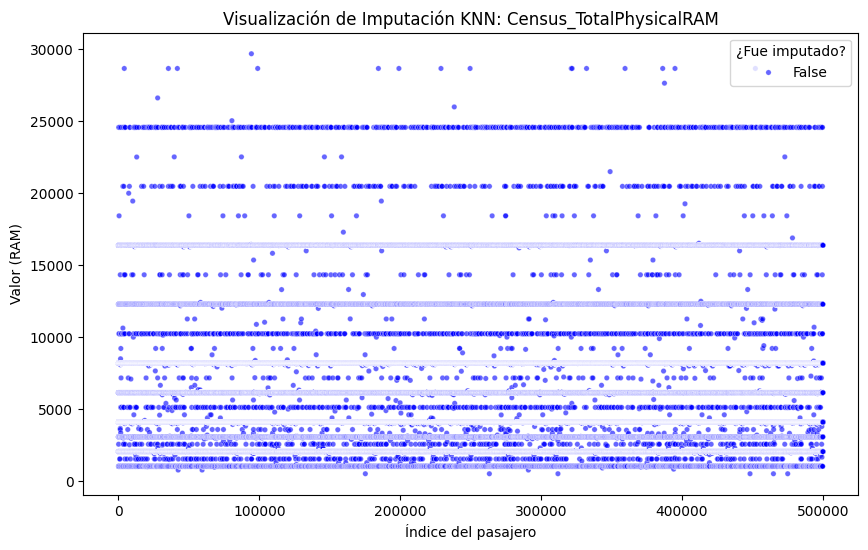

In [200]:
import matplotlib.pyplot as plt
import seaborn as sns

col = 'Census_TotalPhysicalRAM'

# 1. Creamos un DF auxiliar para visualizar
df_viz = pd.DataFrame()
df_viz['Valor_Final'] = Xt[Xt[col].between(0, 30000)][col]  # El valor ya imputado
df_viz['Era_Nulo'] = X[X[col].between(0, 30000)][col].isna() # True si era NaN originalmente

plt.figure(figsize=(10, 6))

# 2. Usamos Seaborn para pintar diferenciando por color (hue)
sns.scatterplot(
    data=df_viz.reset_index(), # Reseteamos index para usarlo como eje X
    x='index', 
    y='Valor_Final', 
    hue='Era_Nulo', 
    palette={False: 'blue', True: 'red'}, # Azul: Originales, Rojo: Imputados
    alpha=0.6,
    s=15
)

plt.title(f'Visualización de Imputación KNN: {col}')
plt.xlabel('Índice del pasajero')
plt.ylabel('Valor (RAM)')
plt.legend(title='¿Fue imputado?')
plt.show()

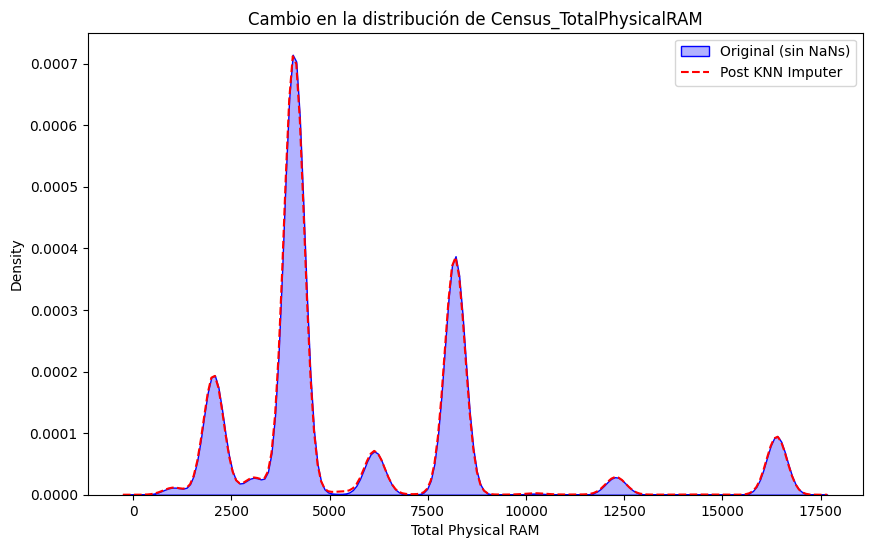

In [196]:
plt.figure(figsize=(10, 6))

# 1. Distribución Original (Pandas ignora los NaNs automáticamente)
sns.kdeplot(X[X[col] < 17000][col], color='blue', label='Original (sin NaNs)', fill=True, alpha=0.3)

# 2. Distribución Post-Imputación
sns.kdeplot(Xt[Xt[col] < 17000][col], color='red', label='Post KNN Imputer', linestyle='--')

plt.title(f'Cambio en la distribución de {col}')
plt.xlabel('Total Physical RAM')
plt.legend()
plt.show()

In [ ]:
Xt.isnull().sum().sort_values(ascending=False)

Census_TotalPhysicalRAM                                   0
IsBeta                                                    0
IsSxsPassiveMode                                          0
OsBuild                                                   0
HasTpm                                                    0
OsSuite                                                   0
AutoSampleOptIn                                           0
Census_HasOpticalDiskDrive                                0
Census_IsPortableOperatingSystem                          0
Census_OSBuildNumber                                      0
Census_IsTouchEnabled                                     0
Census_IsSecureBootEnabled                                0
Census_OSBuildRevision                                    0
Census_IsPenCapable                                       0
UacLuaenable                                            623
Census_IsVirtualDevice                                  901
RtpStateBitfield                        

In [69]:
datos.SmartScreen.value_counts()

SmartScreen
requireadmin    241595
existsnotset     58497
off              10463
warn              7530
prompt            1950
block             1274
on                  61
Name: count, dtype: int64

In [63]:
datos.SmartScreen.str.lower().value_counts()

SmartScreen
requireadmin    241595
existsnotset     58497
off              10463
warn              7530
prompt            1950
block             1274
on                  61
&#x02;              20
&#x01;              14
Name: count, dtype: int64

In [204]:
X

,IsBeta,RtpStateBitfield,IsSxsPassiveMode,AVProductsInstalled,AVProductsEnabled,HasTpm,OsBuild,OsSuite,IsProtected,AutoSampleOptIn,...,Census_IsFlightingInternal,Census_IsFlightsDisabled,Census_ThresholdOptIn,Census_IsSecureBootEnabled,Census_IsWIMBootEnabled,Census_IsVirtualDevice,Census_IsTouchEnabled,Census_IsPenCapable,Census_IsAlwaysOnAlwaysConnectedCapable,Wdft_IsGamer
0,0,7.0,0,1.0,1.0,1,17134,256,1.0,0,...,NaN,0.0,NaN,0,NaN,0.0,0,0,0.0,0.0
1,0,7.0,0,1.0,1.0,1,17134,256,1.0,0,...,NaN,0.0,0.0,0,0.0,0.0,0,0,0.0,1.0
2,0,7.0,0,2.0,1.0,1,10586,768,1.0,0,...,NaN,0.0,0.0,1,0.0,0.0,1,1,0.0,0.0
3,0,7.0,0,1.0,1.0,1,17134,768,1.0,0,...,NaN,0.0,NaN,1,NaN,0.0,0,0,0.0,0.0
4,0,7.0,0,2.0,1.0,1,17134,256,1.0,0,...,NaN,0.0,NaN,1,NaN,0.0,1,0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499995,0,7.0,0,1.0,1.0,1,16299,768,1.0,0,...,NaN,0.0,0.0,1,0.0,0.0,1,0,0.0,1.0
499996,0,7.0,0,1.0,1.0,1,16299,768,1.0,0,...,NaN,0.0,NaN,0,NaN,0.0,0,0,0.0,0.0
499997,0,7.0,0,1.0,1.0,1,17134,256,1.0,0,...,NaN,0.0,NaN,0,NaN,0.0,0,0,0.0,0.0
499998,0,7.0,0,2.0,1.0,1,16299,256,1.0,0,...,NaN,0.0,NaN,0,NaN,0.0,0,0,0.0,0.0


In [207]:
df_inicial[cols_of_interest].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 15 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   SmartScreen                                        321404 non-null  object 
 1   AVProductStatesIdentifier                          498062 non-null  float64
 2   AVProductsInstalled                                498062 non-null  float64
 3   AvSigVersion                                       500000 non-null  object 
 4   EngineVersion                                      500000 non-null  object 
 5   Census_TotalPhysicalRAM                            495444 non-null  float64
 6   AppVersion                                         500000 non-null  object 
 7   Census_InternalPrimaryDiagonalDisplaySizeInInches  497346 non-null  float64
 8   Census_OSInstallTypeName                           500000 non-null  object

In [206]:
df_inicial[["SmartScreen", "AVProductStatesIdentifier", "AVProductsInstalled", "AvSigVersion", "EngineVersion", "Census_TotalPhysicalRAM", "AppVersion", "Census_InternalPrimaryDiagonalDisplaySizeInInches", "Census_OSInstallTypeName", "Wdft_IsGamer", "Census_IsAlwaysOnAlwaysConnectedCapable", "Census_PrimaryDiskTotalCapacity", "Processor", "Census_SystemVolumeTotalCapacity", "Census_IsWIMBootEnabled"]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 15 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   SmartScreen                                        321404 non-null  object 
 1   AVProductStatesIdentifier                          498062 non-null  float64
 2   AVProductsInstalled                                498062 non-null  float64
 3   AvSigVersion                                       500000 non-null  object 
 4   EngineVersion                                      500000 non-null  object 
 5   Census_TotalPhysicalRAM                            495444 non-null  float64
 6   AppVersion                                         500000 non-null  object 
 7   Census_InternalPrimaryDiagonalDisplaySizeInInches  497346 non-null  float64
 8   Census_OSInstallTypeName                           500000 non-null  object

In [210]:
cols_of_interest = ["SmartScreen", "AVProductStatesIdentifier", "AVProductsInstalled", "AvSigVersion", "EngineVersion", "Census_TotalPhysicalRAM", "AppVersion", "Census_InternalPrimaryDiagonalDisplaySizeInInches", "Census_OSInstallTypeName", "Wdft_IsGamer", "Census_IsAlwaysOnAlwaysConnectedCapable", "Census_PrimaryDiskTotalCapacity", "Processor", "Census_SystemVolumeTotalCapacity", "Census_IsWIMBootEnabled"]
cat_of_interest = ["SmartScreen", "AvSigVersion", "EngineVersion", "AppVersion", "Census_OSInstallTypeName", "Processor"]
numm_of_interest = ["AVProductStatesIdentifier", "AVProductsInstalled", "Census_TotalPhysicalRAM", "Census_InternalPrimaryDiagonalDisplaySizeInInches", "Wdft_IsGamer", "Census_IsAlwaysOnAlwaysConnectedCapable", "Census_PrimaryDiskTotalCapacity", "Census_SystemVolumeTotalCapacity", "Census_IsWIMBootEnabled"]


df_sk = df_inicial[cols_of_interest + ['HasDetections', 'Unnamed: 0']].copy()

X = df_sk.drop(columns=['HasDetections', 'Unnamed: 0'], axis=1)
y = df_sk['HasDetections']

set_config(transform_output="pandas")

knn_wrapper = utils.ScaledKNNImputer(
    scaler=StandardScaler(), # MinMaxScaler()/RobustScaler() si quieres otro tipo de escalado
    imputer=KNNImputer(n_neighbors=5) # Lo dejamos aquí para poder poner los neighbors que queramos
)

ct_encode = ColumnTransformer(
    transformers=[
        ('oe', OrdinalEncoder(
            handle_unknown='use_encoded_value',
            unknown_value=np.nan,
            encoded_missing_value=np.nan
        ), cat_of_interest),
    ],
    remainder="passthrough",
    verbose_feature_names_out=False
)

ct_inpute = ColumnTransformer(
    transformers=[
        ("knn_nums", knn_wrapper, cols_of_interest)
    ],
    remainder="passthrough",
    verbose_feature_names_out=False # Mantiene los nombres limpios si es posible
)    

pipe = Pipeline(
    steps=[
        ("encoder", ct_encode),
        ("imputer", ct_inpute),
    ]
)

# Ejecución
Xt = pipe.fit_transform(X, y)

In [211]:
Xt.isnull().sum().sort_values(ascending=False)

SmartScreen                                          0
AVProductStatesIdentifier                            0
AVProductsInstalled                                  0
AvSigVersion                                         0
EngineVersion                                        0
Census_TotalPhysicalRAM                              0
AppVersion                                           0
Census_InternalPrimaryDiagonalDisplaySizeInInches    0
Census_OSInstallTypeName                             0
Wdft_IsGamer                                         0
Census_IsAlwaysOnAlwaysConnectedCapable              0
Census_PrimaryDiskTotalCapacity                      0
Processor                                            0
Census_SystemVolumeTotalCapacity                     0
Census_IsWIMBootEnabled                              0
dtype: int64

In [216]:
Xt.to_csv("Datasets/sample_mmp_preprocessed.csv", index=False)

In [66]:
# 1. Asegúrate primero de que todo esté en minúsculas (para no tener problemas de coincidencia)
datos['SmartScreen'] = datos['SmartScreen'].str.lower()

# 2. Calculamos el conteo de cada valor
conteo = datos['SmartScreen'].value_counts()

# 3. Sacamos la lista de nombres que tienen 30 o más apariciones
valores_frecuentes = conteo[conteo >= 30].index

# 4. Filtramos el DataFrame original:
# "Quédate solo con las filas donde SmartScreen esté en la lista de valores frecuentes"
datos = datos[datos['SmartScreen'].isin(valores_frecuentes)]

In [67]:
datos.SmartScreen.str.lower().value_counts()

SmartScreen
off    75
Name: count, dtype: int64

--------------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------------

In [ ]:
# Revisión de filas duplicadas en el DataFrame
df_duplicadas = df_inicial.duplicated().sum()
print(f'\nNúmero de filas duplicadas: {df_duplicadas}')
df_inicial[df_inicial.duplicated()]


Número de filas duplicadas: 0


,Unnamed: 0,MachineIdentifier,ProductName,EngineVersion,AppVersion,AvSigVersion,IsBeta,RtpStateBitfield,IsSxsPassiveMode,DefaultBrowsersIdentifier,...,Census_FirmwareVersionIdentifier,Census_IsSecureBootEnabled,Census_IsWIMBootEnabled,Census_IsVirtualDevice,Census_IsTouchEnabled,Census_IsPenCapable,Census_IsAlwaysOnAlwaysConnectedCapable,Wdft_IsGamer,Wdft_RegionIdentifier,HasDetections


In [ ]:
# Dado que HasDetections es target y MachineIdentifier un identificador único,
# eliminamos los nulos en estas dos columnas
df_inicial_2 = df_inicial.dropna(subset=['HasDetections', 'MachineIdentifier'])
df_inicial_2.shape

(500000, 84)

In [ ]:
# Revisión de valores nulos en el DataFrame
for i in df_inicial_2.columns:
    nulls = df_inicial_2[i].isnull().sum()
    if nulls > 0:
        prctj = df_inicial_2[i].isnull().mean() * 100
        print(f'{prctj:2.2f}% ({nulls}) \tde nulos en {i}')

0.37% (1832) 	de nulos en RtpStateBitfield
95.19% (475939) 	de nulos en DefaultBrowsersIdentifier
0.39% (1938) 	de nulos en AVProductStatesIdentifier
0.39% (1938) 	de nulos en AVProductsInstalled
0.39% (1938) 	de nulos en AVProductsEnabled
3.65% (18240) 	de nulos en CityIdentifier
30.91% (154563) 	de nulos en OrganizationIdentifier
0.00% (16) 	de nulos en GeoNameIdentifier
0.00% (1) 	de nulos en OsBuildLab
0.39% (1926) 	de nulos en IsProtected
99.97% (499874) 	de nulos en PuaMode
5.97% (29848) 	de nulos en SMode
0.64% (3209) 	de nulos en IeVerIdentifier
35.72% (178596) 	de nulos en SmartScreen
1.03% (5162) 	de nulos en Firewall
0.12% (623) 	de nulos en UacLuaenable
1.08% (5381) 	de nulos en Census_OEMNameIdentifier
1.15% (5764) 	de nulos en Census_OEMModelIdentifier
0.47% (2347) 	de nulos en Census_ProcessorCoreCount
0.47% (2347) 	de nulos en Census_ProcessorManufacturerIdentifier
0.47% (2349) 	de nulos en Census_ProcessorModelIdentifier
99.58% (497918) 	de nulos en Census_ProcessorCla

In [ ]:
df_inicial_2.columns

Index(['Unnamed: 0', 'MachineIdentifier', 'ProductName', 'EngineVersion',
       'AppVersion', 'AvSigVersion', 'IsBeta', 'RtpStateBitfield',
       'IsSxsPassiveMode', 'DefaultBrowsersIdentifier',
       'AVProductStatesIdentifier', 'AVProductsInstalled', 'AVProductsEnabled',
       'HasTpm', 'CountryIdentifier', 'CityIdentifier',
       'OrganizationIdentifier', 'GeoNameIdentifier',
       'LocaleEnglishNameIdentifier', 'Platform', 'Processor', 'OsVer',
       'OsBuild', 'OsSuite', 'OsPlatformSubRelease', 'OsBuildLab',
       'SkuEdition', 'IsProtected', 'AutoSampleOptIn', 'PuaMode', 'SMode',
       'IeVerIdentifier', 'SmartScreen', 'Firewall', 'UacLuaenable',
       'Census_MDC2FormFactor', 'Census_DeviceFamily',
       'Census_OEMNameIdentifier', 'Census_OEMModelIdentifier',
       'Census_ProcessorCoreCount', 'Census_ProcessorManufacturerIdentifier',
       'Census_ProcessorModelIdentifier', 'Census_ProcessorClass',
       'Census_PrimaryDiskTotalCapacity', 'Census_PrimaryDiskTypeN

In [ ]:
display(utils.auditoria_nulos(df_inicial_2))

Auditoría de nulos en el DataFrame:
Columnas afectadas:
PuaMode                                              499874
Census_ProcessorClass                                497918
DefaultBrowsersIdentifier                            475939
Census_IsFlightingInternal                           415225
Census_InternalBatteryType                           355603
Census_ThresholdOptIn                                318104
Census_IsWIMBootEnabled                              317666
SmartScreen                                          178596
OrganizationIdentifier                               154563
SMode                                                 29848
CityIdentifier                                        18240
Wdft_IsGamer                                          16950
Wdft_RegionIdentifier                                 16950
Census_InternalBatteryNumberOfCharges                 15038
Census_FirmwareManufacturerIdentifier                 10349
Census_FirmwareVersionIdentifier            

n_nulos
1         12
2       1206
3      41377
4      75682
5      44877
6      13511
7      86611
8     144885
9      61292
10     15718
11      6977
12      2669
13      1266
14       646
15       394
16       415
17       372
18       474
19       637
20       462
21       305
22       132
23        53
24        18
25         8
26         1
Name: count, dtype: int64


Ejemplo de filas con múltiples nulos (Top 5):


,Unnamed: 0,MachineIdentifier,ProductName,EngineVersion,AppVersion,AvSigVersion,IsBeta,RtpStateBitfield,IsSxsPassiveMode,DefaultBrowsersIdentifier,...,Census_IsSecureBootEnabled,Census_IsWIMBootEnabled,Census_IsVirtualDevice,Census_IsTouchEnabled,Census_IsPenCapable,Census_IsAlwaysOnAlwaysConnectedCapable,Wdft_IsGamer,Wdft_RegionIdentifier,HasDetections,n_nulos
372619,1989884,391c303c3690a85dcdf86f382e217d60,win8defender,1.1.15100.1,4.12.16299.15,1.273.1167.0,0,7.0,0,NaN,...,0,NaN,0.0,0,0,NaN,0.0,11.0,1,26
313370,838948,181b01363fe0da1f7d41d49a2ea5b01b,win8defender,1.1.15200.1,4.12.16299.15,1.275.223.0,0,7.0,0,NaN,...,1,NaN,0.0,0,0,NaN,NaN,NaN,0,25
383203,5163140,942befe91950bc3a52862d3230ab4c54,win8defender,1.1.15200.1,4.18.1807.18075,1.275.1231.0,0,7.0,0,NaN,...,0,NaN,0.0,0,0,NaN,NaN,NaN,0,25
219778,8850296,fdf6cfe2eb462da0ffb54283533d24c6,win8defender,1.1.14500.5,4.12.17007.18011,1.261.1541.0,0,7.0,0,NaN,...,0,NaN,0.0,0,0,NaN,NaN,NaN,0,25
118873,8708106,f9de5bef7b06b4b7d9a2bd25aa3a56d0,win8defender,1.1.15100.1,4.11.15063.1155,1.273.1167.0,0,NaN,0,NaN,...,0,NaN,0.0,0,0,NaN,NaN,NaN,0,25


,Unnamed: 0,MachineIdentifier,ProductName,EngineVersion,AppVersion,AvSigVersion,IsBeta,RtpStateBitfield,IsSxsPassiveMode,DefaultBrowsersIdentifier,...,Census_IsSecureBootEnabled,Census_IsWIMBootEnabled,Census_IsVirtualDevice,Census_IsTouchEnabled,Census_IsPenCapable,Census_IsAlwaysOnAlwaysConnectedCapable,Wdft_IsGamer,Wdft_RegionIdentifier,HasDetections,n_nulos
0,8427007,f1cd864e97bae82bdf96523e1a539121,win8defender,1.1.15100.1,4.18.1807.18075,1.273.1234.0,0,7.0,0,NaN,...,0,NaN,0.0,0,0,0.0,0.0,11.0,1,8
1,8829090,fd5ba6f5b75325ec0423a6c67cc75942,win8defender,1.1.15100.1,4.18.1807.18075,1.273.1282.0,0,7.0,0,NaN,...,0,0.0,0.0,0,0,0.0,1.0,3.0,0,5
2,2731904,4e628391e7cc7c482fb3286f486dbd25,win8defender,1.1.15100.1,4.9.10586.1106,1.273.781.0,0,7.0,0,NaN,...,1,0.0,0.0,1,1,0.0,0.0,15.0,0,4
3,1359513,270a2e9d028144a4df12a9e3da79fba5,win8defender,1.1.15200.1,4.18.1807.18075,1.275.1639.0,0,7.0,0,NaN,...,1,NaN,0.0,0,0,0.0,0.0,15.0,1,8
4,236059,06ca8fa8d32c2abdc5b3577d676b3269,win8defender,1.1.15200.1,4.18.1807.18075,1.275.511.0,0,7.0,0,NaN,...,1,NaN,0.0,1,0,0.0,1.0,13.0,1,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499995,5826339,a739cacc292f3f1e745827c1ca6c6ada,win8defender,1.1.15200.1,4.18.1807.18075,1.275.1090.0,0,7.0,0,NaN,...,1,0.0,0.0,1,0,0.0,1.0,10.0,0,4
499996,5740034,a4c232d528d98343e8f1b73650da7b82,win8defender,1.1.15100.1,4.18.1807.18075,1.273.1620.0,0,7.0,0,NaN,...,0,NaN,0.0,0,0,0.0,0.0,15.0,0,9
499997,8819786,fd16cd542d660848d272e4552bcccb1e,win8defender,1.1.15300.5,4.13.17134.112,1.275.1343.0,0,7.0,0,NaN,...,0,NaN,0.0,0,0,0.0,0.0,8.0,0,9
499998,8713685,fa0841f8f6147de7c3d287e05270ed42,win8defender,1.1.15100.1,4.14.17639.18041,1.273.483.0,0,7.0,0,NaN,...,0,NaN,0.0,0,0,0.0,0.0,1.0,0,8


<Axes: >

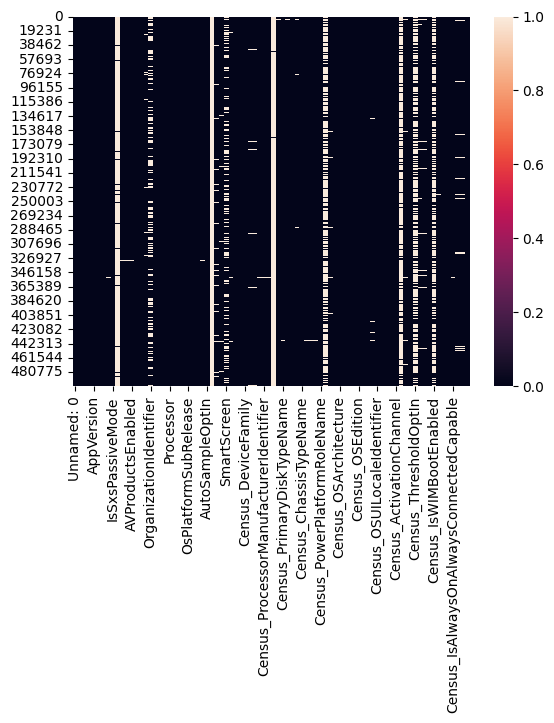

In [ ]:
sns.heatmap(df_inicial_2.isnull())

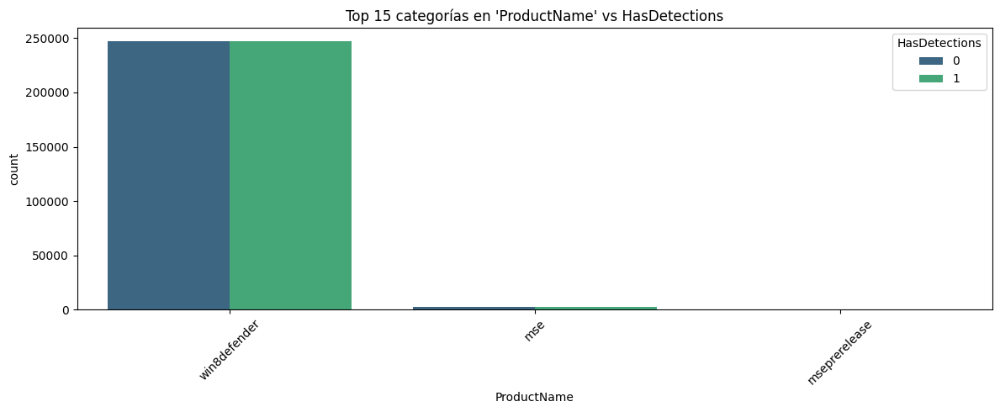

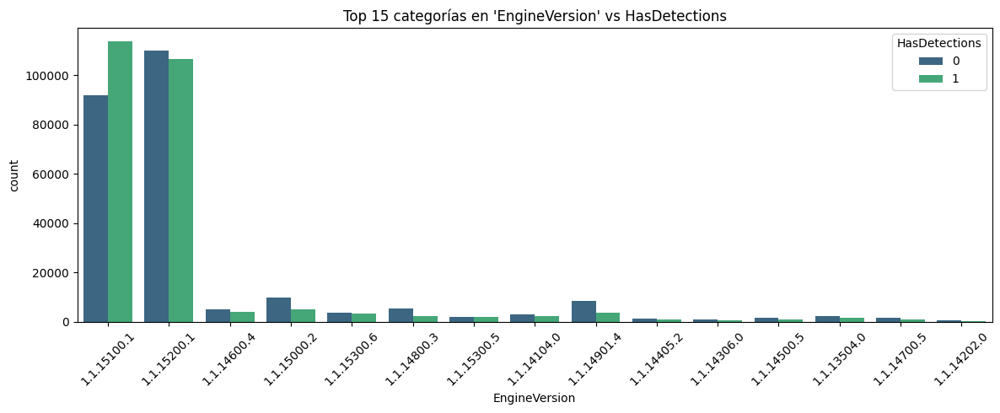

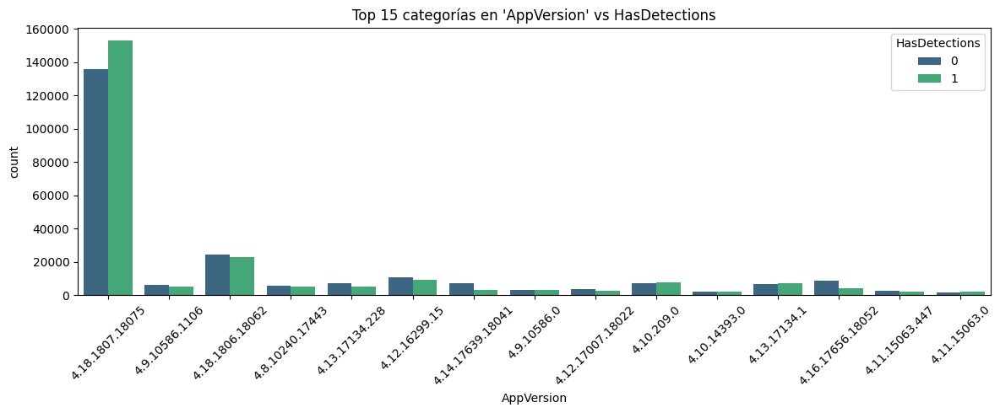

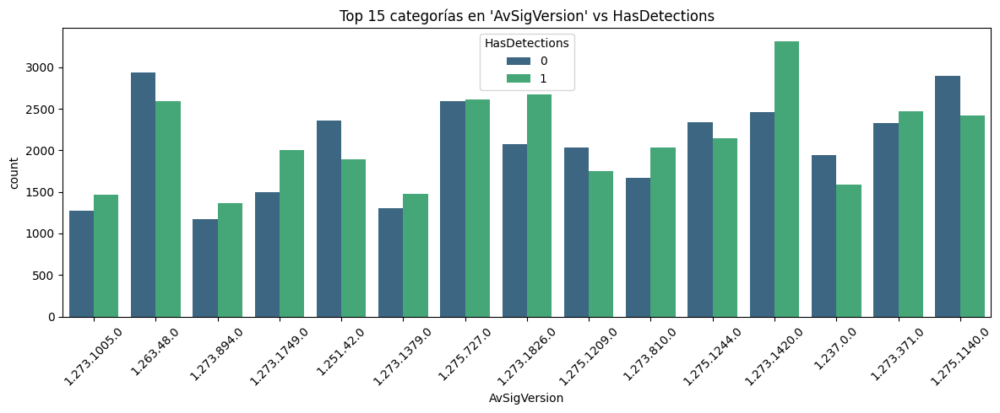

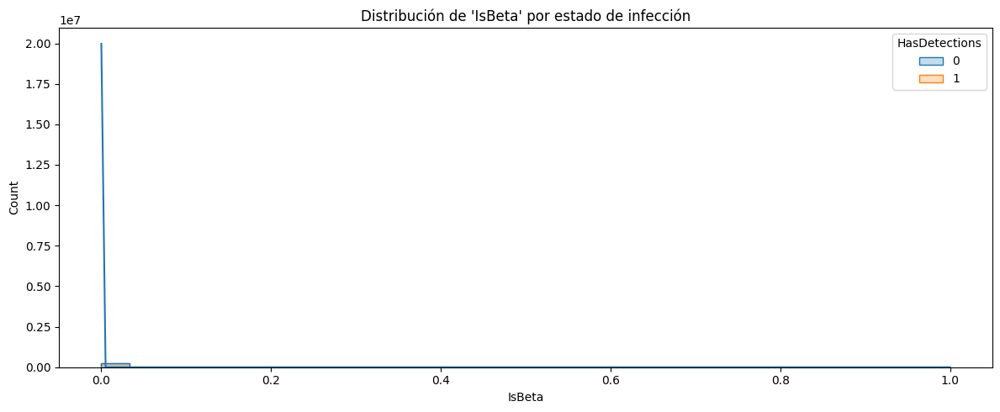

...

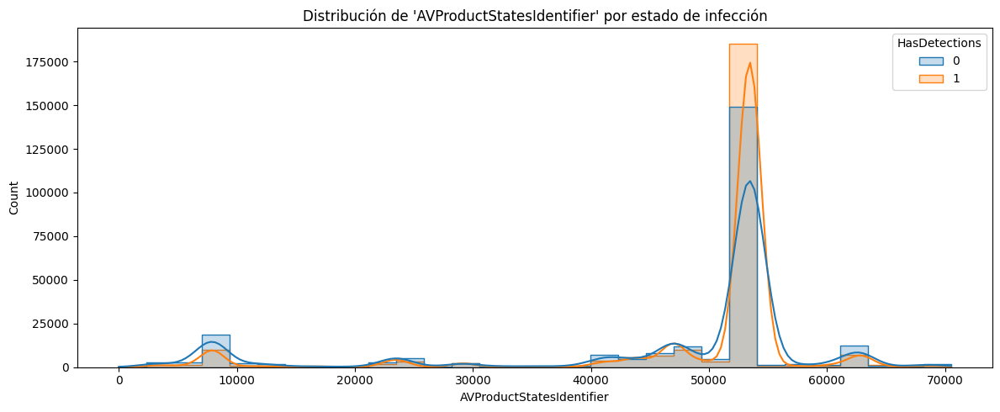

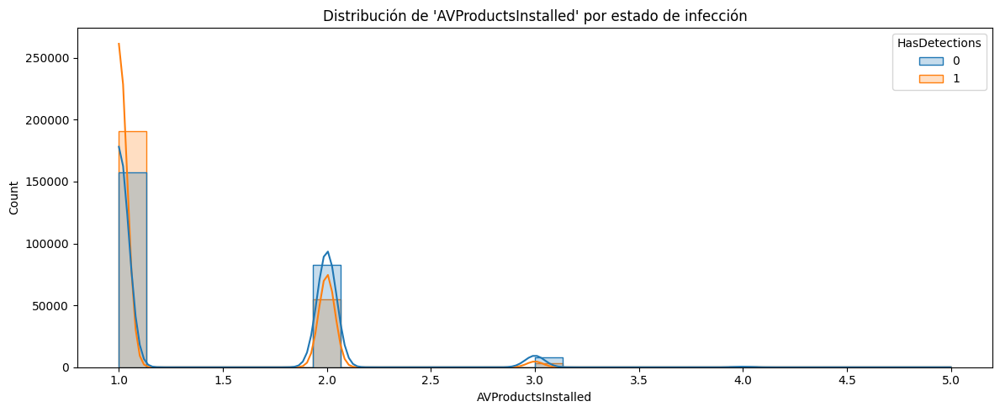

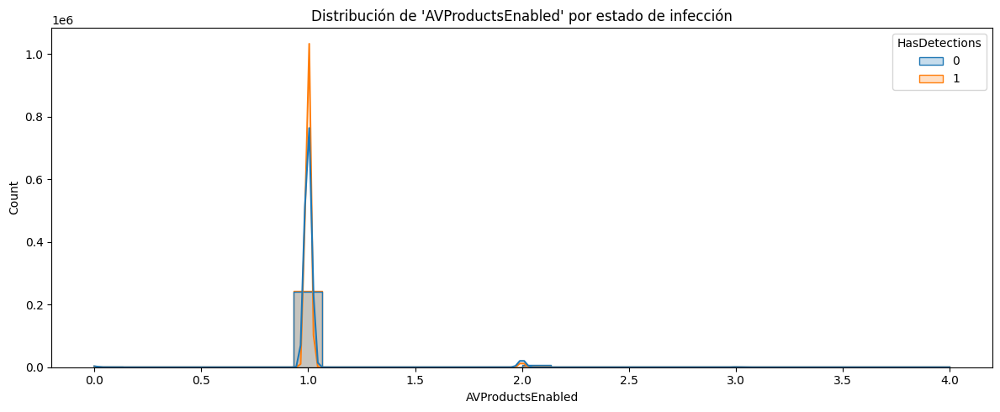

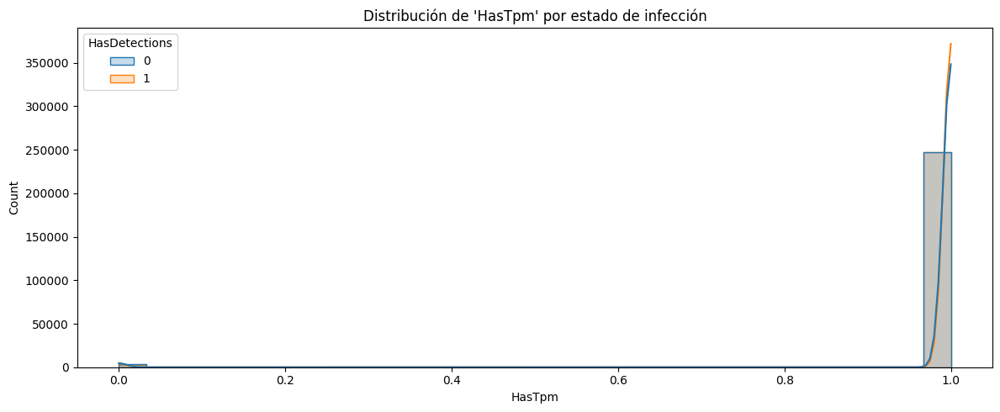

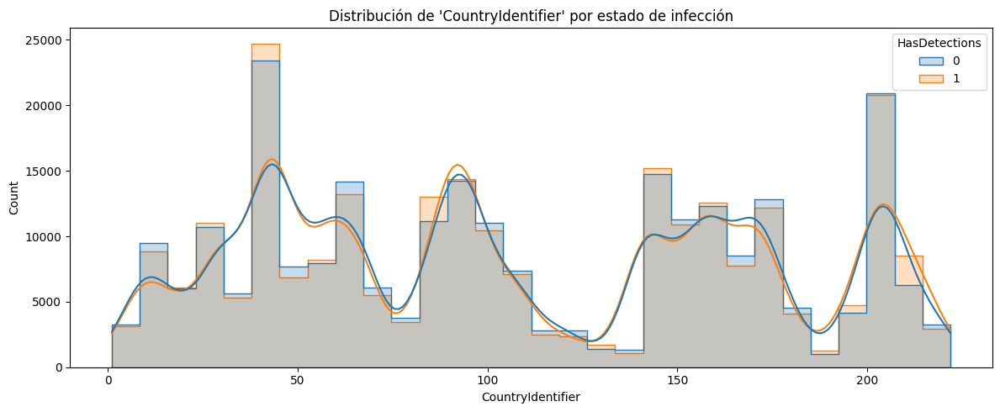

KeyboardInterrupt: 

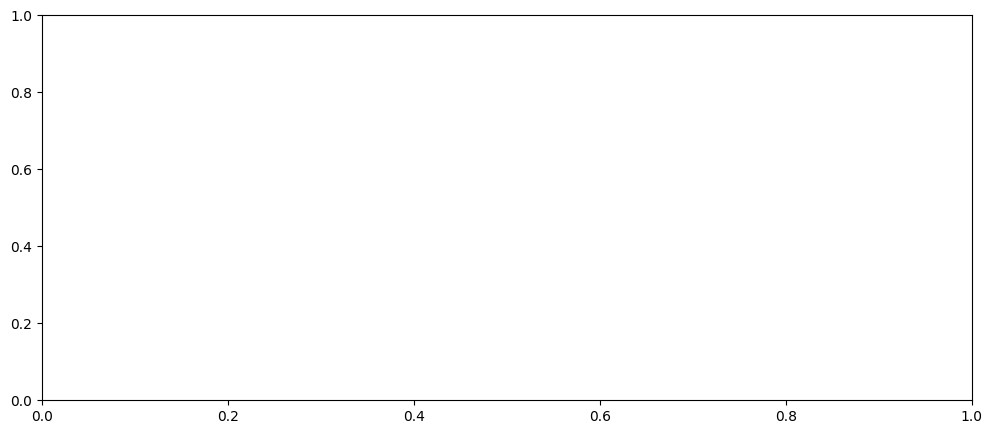

In [ ]:
# 1. Identificamos tipos usando tu función de utils
# (numeric, bools, datetimes, objects, categories, timedeltas, complex_cols, ints, floats, others)
tipos = utils.columnas_por_tipo(df_inicial_2, as_dict=True)

# Unificamos las que queremos tratar como "categóricas" para el plot
cols_categoricas = tipos['object'] + tipos['category'] + tipos['bool']
cols_numericas = tipos['float'] + tipos['int']

# 2. Bucle de visualización
for col in df_inicial_2.columns:
    # Saltamos identificadores y el target
    if col in ['MachineIdentifier', 'HasDetections', 'Unnamed: 0', 'n_nulos']:
        continue
        
    plt.figure(figsize=(12, 5))
    
    if col in cols_categoricas:
        # Para categóricas: Top 15 valores más frecuentes para no saturar el eje X
        top_values = df_inicial_2[col].value_counts().nlargest(15).index
        df_plot = df_inicial_2[df_inicial_2[col].isin(top_values)]
        
        sns.countplot(data=df_plot, x=col, hue='HasDetections', palette='viridis')
        plt.title(f"Top 15 categorías en '{col}' vs HasDetections")
        plt.xticks(rotation=45)
        
    elif col in cols_numericas:
        # Para numéricas: Un histograma con KDE es más útil que un scatter contra un target binario
        sns.histplot(data=df_inicial_2, x=col, hue='HasDetections', kde=True, bins=30, element="step")
        plt.title(f"Distribución de '{col}' por estado de infección")

    plt.tight_layout()
    plt.show()

In [ ]:
for col in df_inicial_2.columns:
    # Saltamos identificadores y el target
    if col in ['MachineIdentifier', 'HasDetections', 'Unnamed: 0', 'n_nulos']:
        continue
    
    if col in cols_categoricas:
        print(f'Distintos valores en {col}')
        display(df_inicial_2[col].value_counts())
        
    elif col in cols_numericas:
        print(f'Rango de valores en {col}')
        display(df_inicial_2[col].describe())   

Distintos valores en ProductName


ProductName
win8defender     494604
mse                5395
mseprerelease         1
Name: count, dtype: int64

Distintos valores en EngineVersion


EngineVersion
1.1.15200.1    216491
1.1.15100.1    205494
1.1.15000.2     14752
1.1.14901.4     11984
1.1.14600.4      9005
1.1.14800.3      7548
1.1.15300.6      6769
1.1.14104.0      5240
1.1.15300.5      3883
1.1.13504.0      3876
1.1.14700.5      2593
1.1.14500.5      2591
1.1.14405.2      1972
1.1.14306.0      1329
1.1.14202.0       840
1.1.14003.0       804
1.1.13303.0       516
1.1.13903.0       515
1.1.13804.0       513
1.1.13407.0       479
1.1.13601.0       420
1.1.12902.0       321
1.1.14305.0       270
1.1.13701.0       255
1.1.13704.0       255
1.1.13202.0       245
1.1.13103.0       235
1.1.13000.0       220
1.1.15000.1       138
1.1.12805.0       115
1.1.14901.3        71
1.1.14700.4        65
1.1.14700.3        61
1.1.14800.1        51
1.1.14500.2        19
1.1.14201.0        11
1.1.14303.0        10
1.1.12101.0         7
1.1.14103.0         5
1.1.13902.0         4
1.1.12804.0         4
1.1.13802.0         4
1.1.11701.0         3
1.1.13803.0         3
1.1.12603.0       

Distintos valores en AppVersion


AppVersion
4.18.1807.18075    288809
4.18.1806.18062     47641
4.12.16299.15       20197
4.10.209.0          15292
4.13.17134.1        14414
                    ...  
4.13.17639.1000         1
4.15.17650.1001         1
4.13.17618.1000         1
4.13.17604.1000         1
4.18.1807.18070         1
Name: count, Length: 95, dtype: int64

Distintos valores en AvSigVersion


AvSigVersion
1.273.1420.0    5771
1.263.48.0      5537
1.275.1140.0    5317
1.275.727.0     5214
1.273.371.0     4799
                ... 
1.243.647.0        1
1.229.387.0        1
1.239.1469.0       1
1.235.1416.0       1
1.259.106.0        1
Name: count, Length: 6455, dtype: int64

Rango de valores en IsBeta


count    500000.000000
mean          0.000002
std           0.001414
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: IsBeta, dtype: float64

Rango de valores en RtpStateBitfield


count    498168.000000
mean          6.846207
std           1.023049
min           0.000000
25%           7.000000
50%           7.000000
75%           7.000000
max          35.000000
Name: RtpStateBitfield, dtype: float64

Rango de valores en IsSxsPassiveMode


count    500000.000000
mean          0.017242
std           0.130172
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: IsSxsPassiveMode, dtype: float64

Rango de valores en DefaultBrowsersIdentifier


count    24061.000000
mean      1652.824529
std       1004.754276
min          1.000000
25%        788.000000
50%       1632.000000
75%       2381.000000
max       3209.000000
Name: DefaultBrowsersIdentifier, dtype: float64

Rango de valores en AVProductStatesIdentifier


count    498062.000000
mean      47850.908413
std       14023.085346
min           3.000000
25%       49480.000000
50%       53447.000000
75%       53447.000000
max       70492.000000
Name: AVProductStatesIdentifier, dtype: float64

Rango de valores en AVProductsInstalled


count    498062.000000
mean          1.326763
std           0.523000
min           1.000000
25%           1.000000
50%           1.000000
75%           2.000000
max           5.000000
Name: AVProductsInstalled, dtype: float64

Rango de valores en AVProductsEnabled


count    498062.000000
mean          1.020714
std           0.166608
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max           4.000000
Name: AVProductsEnabled, dtype: float64

Rango de valores en HasTpm


count    500000.000000
mean          0.987816
std           0.109707
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max           1.000000
Name: HasTpm, dtype: float64

Rango de valores en CountryIdentifier


count    500000.000000
mean        108.037454
std          63.068540
min           1.000000
25%          51.000000
50%          97.000000
75%         162.000000
max         222.000000
Name: CountryIdentifier, dtype: float64

Rango de valores en CityIdentifier


count    481760.000000
mean      81271.646027
std       48985.129677
min           7.000000
25%       36825.000000
50%       82373.000000
75%      123939.500000
max      167958.000000
Name: CityIdentifier, dtype: float64

Rango de valores en OrganizationIdentifier


count    345437.000000
mean         24.869936
std           5.613712
min           1.000000
25%          18.000000
50%          27.000000
75%          27.000000
max          52.000000
Name: OrganizationIdentifier, dtype: float64

Rango de valores en GeoNameIdentifier


count    499984.000000
mean        169.730423
std          89.325172
min           1.000000
25%          89.000000
50%         181.000000
75%         267.000000
max         296.000000
Name: GeoNameIdentifier, dtype: float64

Rango de valores en LocaleEnglishNameIdentifier


count    500000.000000
mean        122.610998
std          69.303165
min           1.000000
25%          74.000000
50%          88.000000
75%         182.000000
max         283.000000
Name: LocaleEnglishNameIdentifier, dtype: float64

Distintos valores en Platform


Platform
windows10      483048
windows8        10825
windows7         5314
windows2016       813
Name: count, dtype: int64

Distintos valores en Processor


Processor
x64      454423
x86       45563
arm64        14
Name: count, dtype: int64

Distintos valores en OsVer


OsVer
10.0.0.0      483830
6.3.0.0        10818
6.1.1.0         5281
6.1.0.0           33
10.0.3.0          12
10.0.1.0           7
10.0.32.72         2
6.3.1.0            2
10.0.0.1           2
6.3.3.0            2
10.0.32.0          1
10.0.0.112         1
10.0.8.0           1
10.0.5.0           1
10.0.80.0          1
10.0.4.0           1
6.3.5.0            1
10.0.2.0           1
6.3.32.72          1
6.3.7.0            1
10.0.7.0           1
Name: count, dtype: int64

Rango de valores en OsBuild


count    500000.000000
mean      15726.933842
std        2188.646069
min        7600.000000
25%       15063.000000
50%       16299.000000
75%       17134.000000
max       18242.000000
Name: OsBuild, dtype: float64

Rango de valores en OsSuite


count    500000.000000
mean        574.718574
std         248.203346
min          16.000000
25%         256.000000
50%         768.000000
75%         768.000000
max         784.000000
Name: OsSuite, dtype: float64

Distintos valores en OsPlatformSubRelease


OsPlatformSubRelease
rs4           220779
rs3           139901
rs2            43352
rs1            40717
th2            22955
th1            15014
windows8.1     10825
windows7        5314
prers5          1143
Name: count, dtype: int64

Distintos valores en OsBuildLab


OsBuildLab
17134.1.amd64fre.rs4_release.180410-1804                 206436
16299.431.amd64fre.rs3_release_svc_escrow.180502-1908     69884
16299.15.amd64fre.rs3_release.170928-1534                 53826
15063.0.amd64fre.rs2_release.170317-1834                  39908
17134.1.x86fre.rs4_release.180410-1804                    14334
                                                          ...  
9600.18146.x86fre.winblue_ltsb.151121-0600                    1
17692.1000.x86fre.rs_prerelease.180609-1317                   1
17754.1.x86fre.rs5_release.180831-1429                        1
17655.1000.x86fre.rs_prerelease.180420-1850                   1
9600.18007.amd64fre.winblue_ltsb.150807-0612                  1
Name: count, Length: 453, dtype: int64

Distintos valores en SkuEdition


SkuEdition
Home               308567
Pro                181042
Invalid              4423
Education            2321
Enterprise           1999
Enterprise LTSB      1141
Cloud                 309
Server                198
Name: count, dtype: int64

Rango de valores en IsProtected


count    498074.000000
mean          0.945789
std           0.226433
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max           1.000000
Name: IsProtected, dtype: float64

Rango de valores en AutoSampleOptIn


count    500000.000000
mean          0.000028
std           0.005291
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: AutoSampleOptIn, dtype: float64

Distintos valores en PuaMode


PuaMode
on    126
Name: count, dtype: int64

Rango de valores en SMode


count    470152.000000
mean          0.000438
std           0.020928
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: SMode, dtype: float64

Rango de valores en IeVerIdentifier


count    496791.000000
mean        126.662566
std          42.634892
min           8.000000
25%         111.000000
50%         135.000000
75%         137.000000
max         429.000000
Name: IeVerIdentifier, dtype: float64

Distintos valores en SmartScreen


SmartScreen
RequireAdmin    241594
ExistsNotSet     58497
Off              10388
Warn              7530
Prompt            1950
Block             1274
off                 75
On                  53
&#x02;              20
&#x01;              14
on                   8
requireadmin         1
Name: count, dtype: int64

Rango de valores en Firewall


count    494838.000000
mean          0.978241
std           0.145895
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max           1.000000
Name: Firewall, dtype: float64

Rango de valores en UacLuaenable


count    4.993770e+05
mean     1.372503e+01
std      8.995848e+03
min      0.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      1.000000e+00
max      6.357062e+06
Name: UacLuaenable, dtype: float64

Distintos valores en Census_MDC2FormFactor


Census_MDC2FormFactor
Notebook        320948
Desktop         109527
Convertible      22369
Detachable       16802
AllInOne         16372
PCOther           7800
LargeTablet       3645
SmallTablet       1797
SmallServer        496
MediumServer       192
LargeServer         50
ServerOther          2
Name: count, dtype: int64

Distintos valores en Census_DeviceFamily


Census_DeviceFamily
Windows.Desktop    499183
Windows.Server        816
Windows                 1
Name: count, dtype: int64

Rango de valores en Census_OEMNameIdentifier


count    494619.000000
mean       2218.646481
std        1315.709604
min          54.000000
25%        1443.000000
50%        2102.000000
75%        2668.000000
max        6143.000000
Name: Census_OEMNameIdentifier, dtype: float64

Rango de valores en Census_OEMModelIdentifier


count    494236.000000
mean     239128.046882
std       72048.883577
min           1.000000
25%      189641.750000
50%      247520.000000
75%      304438.000000
max      345493.000000
Name: Census_OEMModelIdentifier, dtype: float64

Rango de valores en Census_ProcessorCoreCount


count    497653.000000
mean          3.994074
std           2.071281
min           1.000000
25%           2.000000
50%           4.000000
75%           4.000000
max          88.000000
Name: Census_ProcessorCoreCount, dtype: float64

Rango de valores en Census_ProcessorManufacturerIdentifier


count    497653.000000
mean          4.529069
std           1.289635
min           1.000000
25%           5.000000
50%           5.000000
75%           5.000000
max          10.000000
Name: Census_ProcessorManufacturerIdentifier, dtype: float64

Rango de valores en Census_ProcessorModelIdentifier


count    497651.000000
mean       2370.986509
std         842.136675
min           3.000000
25%        1998.000000
50%        2500.000000
75%        2877.000000
max        4472.000000
Name: Census_ProcessorModelIdentifier, dtype: float64

Distintos valores en Census_ProcessorClass


Census_ProcessorClass
mid     1196
low      546
high     340
Name: count, dtype: int64

Rango de valores en Census_PrimaryDiskTotalCapacity


count    4.970240e+05
mean     5.140433e+05
std      3.704468e+05
min      1.024000e+04
25%      2.393720e+05
50%      4.769400e+05
75%      9.538690e+05
max      4.768767e+07
Name: Census_PrimaryDiskTotalCapacity, dtype: float64

Distintos valores en Census_PrimaryDiskTypeName


Census_PrimaryDiskTypeName
HDD            325429
SSD            138155
UNKNOWN         20083
Unspecified     15624
Name: count, dtype: int64

Rango de valores en Census_SystemVolumeTotalCapacity


count    4.970240e+05
mean     3.780546e+05
std      3.384722e+05
min      9.689000e+03
25%      1.207750e+05
50%      2.494500e+05
75%      4.759810e+05
max      4.768710e+07
Name: Census_SystemVolumeTotalCapacity, dtype: float64

Rango de valores en Census_HasOpticalDiskDrive


count    500000.000000
mean          0.077034
std           0.266646
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: Census_HasOpticalDiskDrive, dtype: float64

Rango de valores en Census_TotalPhysicalRAM


count    495444.000000
mean       6129.232176
std        4964.521253
min         512.000000
25%        4096.000000
50%        4096.000000
75%        8192.000000
max      393216.000000
Name: Census_TotalPhysicalRAM, dtype: float64

Distintos valores en Census_ChassisTypeName


Census_ChassisTypeName
Notebook               294232
Desktop                104979
Laptop                  38261
Portable                20181
AllinOne                11407
MiniTower                4849
Convertible              4685
Other                    4215
UNKNOWN                  3695
Detachable               2930
LowProfileDesktop        2878
HandHeld                 2652
SpaceSaving              1689
Tablet                    730
Tower                     692
Unknown                   575
MainServerChassis         512
MiniPC                    261
LunchBox                  224
RackMountChassis          189
SubNotebook                47
BusExpansionChassis        38
30                         11
StickPC                     7
0                           5
MultisystemChassis          3
PizzaBox                    3
35                          3
Blade                       3
31                          2
SubChassis                  2
32                          1
ExpansionChassis 

Rango de valores en Census_InternalPrimaryDiagonalDisplaySizeInInches


count    497346.000000
mean         16.689837
std           5.932014
min           4.900000
25%          13.900000
50%          15.500000
75%          17.200000
max         142.000000
Name: Census_InternalPrimaryDiagonalDisplaySizeInInches, dtype: float64

Rango de valores en Census_InternalPrimaryDisplayResolutionHorizontal


count    497350.000000
mean       1548.304317
std         368.565945
min          -1.000000
25%        1366.000000
50%        1366.000000
75%        1920.000000
max       11520.000000
Name: Census_InternalPrimaryDisplayResolutionHorizontal, dtype: float64

Rango de valores en Census_InternalPrimaryDisplayResolutionVertical


count    497350.000000
mean        898.239345
std         214.862450
min          -1.000000
25%         768.000000
50%         768.000000
75%        1080.000000
max        4320.000000
Name: Census_InternalPrimaryDisplayResolutionVertical, dtype: float64

Distintos valores en Census_PowerPlatformRoleName


Census_PowerPlatformRoleName
Mobile               346378
Desktop              116054
Slate                 27475
Workstation            6235
SOHOServer             2062
UNKNOWN                1172
EnterpriseServer        406
AppliancePC             212
PerformanceServer         4
Name: count, dtype: int64

Distintos valores en Census_InternalBatteryType


Census_InternalBatteryType
lion    113500
li-i     13855
#        10176
lip       3326
liio      1814
li p       466
li         356
nimh       272
real       162
bq20       143
pbac       130
vbox        89
lgi0        29
unkn        19
lipo        13
lhp0        12
ithi         7
4cel         6
ram          5
batt         3
bad          3
lipp         3
virt         2
a132         2
li-l         1
lgl0         1
icp3         1
3ion         1
Name: count, dtype: int64

Rango de valores en Census_InternalBatteryNumberOfCharges


count    4.849620e+05
mean     1.125600e+09
std      1.888768e+09
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      4.294967e+09
max      4.294967e+09
Name: Census_InternalBatteryNumberOfCharges, dtype: float64

Distintos valores en Census_OSVersion


Census_OSVersion
10.0.17134.228     79975
10.0.17134.165     50511
10.0.16299.431     30519
10.0.17134.285     26289
10.0.17134.112     19501
                   ...  
10.0.14328.1000        1
10.0.14926.1000        1
10.0.17618.1000        1
10.0.17004.1000        1
10.0.15048.0           1
Name: count, Length: 305, dtype: int64

Distintos valores en Census_OSArchitecture


Census_OSArchitecture
amd64    454435
x86       45551
arm64        14
Name: count, dtype: int64

Distintos valores en Census_OSBranch


Census_OSBranch
rs4_release                  226001
rs3_release                   69216
rs3_release_svc_escrow        67027
rs2_release                   44264
rs1_release                   43705
th2_release                   18298
th2_release_sec               14895
th1_st1                       10822
th1                            4284
rs5_release                     839
rs3_release_svc_escrow_im       329
rs_prerelease                   184
rs_prerelease_flt               132
rs5_release_sigma                 3
winblue_ltsb_escrow               1
Name: count, dtype: int64

Rango de valores en Census_OSBuildNumber


count    500000.000000
mean      15841.372572
std        1959.440301
min        9600.000000
25%       15063.000000
50%       16299.000000
75%       17134.000000
max       18242.000000
Name: Census_OSBuildNumber, dtype: float64

Rango de valores en Census_OSBuildRevision


count    500000.000000
mean        967.224762
std        2920.627724
min           0.000000
25%         165.000000
50%         285.000000
75%         547.000000
max       19069.000000
Name: Census_OSBuildRevision, dtype: float64

Distintos valores en Census_OSEdition


Census_OSEdition
Core                        194469
Professional                175808
CoreSingleLanguage          108696
CoreCountrySpecific           9275
ProfessionalEducation         3100
Education                     2310
Enterprise                    2055
ProfessionalN                 1624
EnterpriseS                   1108
ServerStandard                 584
Cloud                          336
CoreN                          251
ServerStandardEval             151
EducationN                      61
ServerDatacenterEval            47
EnterpriseSN                    47
ServerSolution                  34
EnterpriseN                     28
ProfessionalEducationN          12
ProfessionalWorkstation          2
CloudN                           1
ProfessionalWorkstationN         1
Name: count, dtype: int64

Distintos valores en Census_OSSkuName


Census_OSSkuName
CORE                            194464
PROFESSIONAL                    178947
CORE_SINGLELANGUAGE             108674
CORE_COUNTRYSPECIFIC              9257
EDUCATION                         2313
ENTERPRISE                        2063
PROFESSIONAL_N                    1634
ENTERPRISE_S                      1107
STANDARD_SERVER                    584
CLOUD                              332
CORE_N                             251
STANDARD_EVALUATION_SERVER         151
EDUCATION_N                         61
ENTERPRISE_S_N                      48
DATACENTER_EVALUATION_SERVER        47
SB_SOLUTION_SERVER                  34
ENTERPRISE_N                        28
PRO_WORKSTATION                      2
CLOUDN                               1
PRO_WORKSTATION_N                    1
UNLICENSED                           1
Name: count, dtype: int64

Distintos valores en Census_OSInstallTypeName


Census_OSInstallTypeName
UUPUpgrade        146780
IBSClean           92403
Update             88892
Upgrade            70013
Other              46960
Reset              36510
Refresh            11540
Clean               3885
CleanPCRefresh      3017
Name: count, dtype: int64

Rango de valores en Census_OSInstallLanguageIdentifier


count    496668.000000
mean         14.605509
std          10.200946
min           1.000000
25%           8.000000
50%           9.000000
75%          20.000000
max          39.000000
Name: Census_OSInstallLanguageIdentifier, dtype: float64

Rango de valores en Census_OSUILocaleIdentifier


count    500000.000000
mean         60.446306
std          45.000423
min           1.000000
25%          31.000000
50%          34.000000
75%          90.000000
max         162.000000
Name: Census_OSUILocaleIdentifier, dtype: float64

Distintos valores en Census_OSWUAutoUpdateOptionsName


Census_OSWUAutoUpdateOptionsName
FullAuto                                 222482
UNKNOWN                                  140961
Notify                                   113507
AutoInstallAndRebootAtMaintenanceTime     20731
Off                                        1506
DownloadNotify                              813
Name: count, dtype: int64

Rango de valores en Census_IsPortableOperatingSystem


count    500000.000000
mean          0.000522
std           0.022841
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: Census_IsPortableOperatingSystem, dtype: float64

Distintos valores en Census_GenuineStateName


Census_GenuineStateName
IS_GENUINE         441402
INVALID_LICENSE     44990
OFFLINE             12834
UNKNOWN               774
Name: count, dtype: int64

Distintos valores en Census_ActivationChannel


Census_ActivationChannel
Retail            264932
OEM:DM            191350
Volume:GVLK        25109
OEM:NONSLP         17943
Volume:MAK           468
Retail:TB:Eval       198
Name: count, dtype: int64

Rango de valores en Census_IsFlightingInternal


count    84775.000000
mean         0.000024
std          0.004857
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: Census_IsFlightingInternal, dtype: float64

Rango de valores en Census_IsFlightsDisabled


count    491067.000000
mean          0.000014
std           0.003776
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: Census_IsFlightsDisabled, dtype: float64

Distintos valores en Census_FlightRing


Census_FlightRing
Retail      468299
NOT_SET      16044
Unknown      13701
WIS            606
RP             583
WIF            549
Disabled       217
OSG              1
Name: count, dtype: int64

Rango de valores en Census_ThresholdOptIn


count    181896.000000
mean          0.000258
std           0.016072
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: Census_ThresholdOptIn, dtype: float64

Rango de valores en Census_FirmwareManufacturerIdentifier


count    489651.000000
mean        402.675943
std         221.527124
min          11.000000
25%         142.000000
50%         500.000000
75%         556.000000
max        1084.000000
Name: Census_FirmwareManufacturerIdentifier, dtype: float64

Rango de valores en Census_FirmwareVersionIdentifier


count    490939.000000
mean      33030.988944
std       21220.161428
min          10.000000
25%       13156.000000
50%       33070.000000
75%       52436.000000
max       72091.000000
Name: Census_FirmwareVersionIdentifier, dtype: float64

Rango de valores en Census_IsSecureBootEnabled


count    500000.000000
mean          0.485438
std           0.499788
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max           1.000000
Name: Census_IsSecureBootEnabled, dtype: float64

Rango de valores en Census_IsWIMBootEnabled


count    182334.0
mean          0.0
std           0.0
min           0.0
25%           0.0
50%           0.0
75%           0.0
max           0.0
Name: Census_IsWIMBootEnabled, dtype: float64

Rango de valores en Census_IsVirtualDevice


count    499099.000000
mean          0.007067
std           0.083766
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: Census_IsVirtualDevice, dtype: float64

Rango de valores en Census_IsTouchEnabled


count    500000.000000
mean          0.125434
std           0.331211
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: Census_IsTouchEnabled, dtype: float64

Rango de valores en Census_IsPenCapable


count    500000.000000
mean          0.037744
std           0.190577
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: Census_IsPenCapable, dtype: float64

Rango de valores en Census_IsAlwaysOnAlwaysConnectedCapable


count    495960.000000
mean          0.057245
std           0.232310
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: Census_IsAlwaysOnAlwaysConnectedCapable, dtype: float64

Rango de valores en Wdft_IsGamer


count    483050.000000
mean          0.284060
std           0.450966
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max           1.000000
Name: Wdft_IsGamer, dtype: float64

Rango de valores en Wdft_RegionIdentifier


count    483050.000000
mean          7.888577
std           4.551764
min           1.000000
25%           3.000000
50%          10.000000
75%          11.000000
max          15.000000
Name: Wdft_RegionIdentifier, dtype: float64

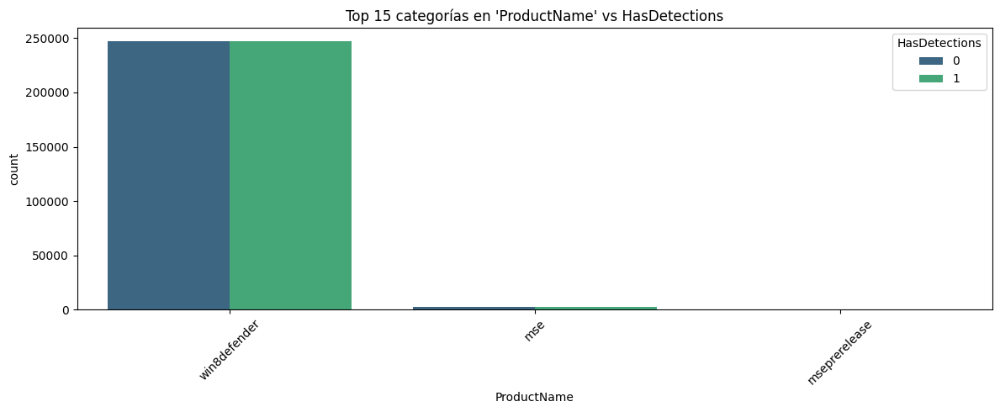

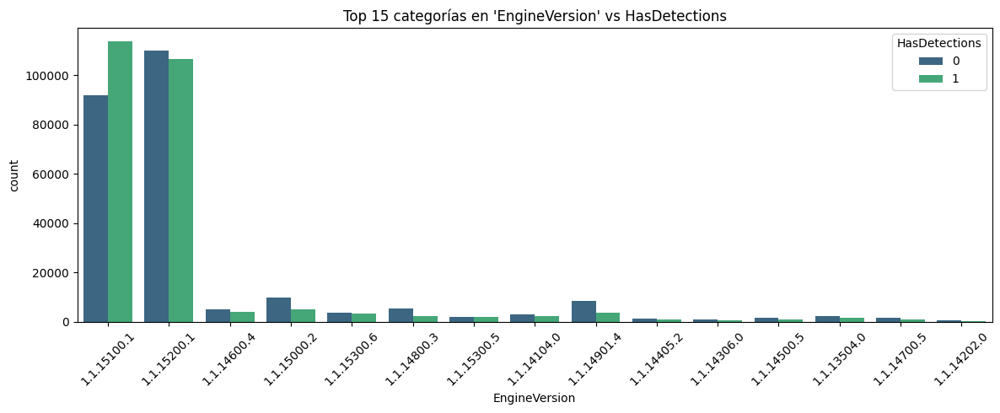

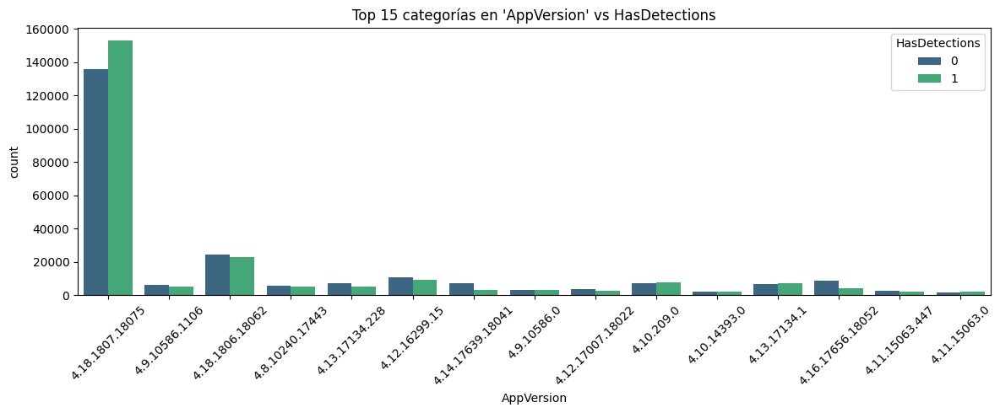

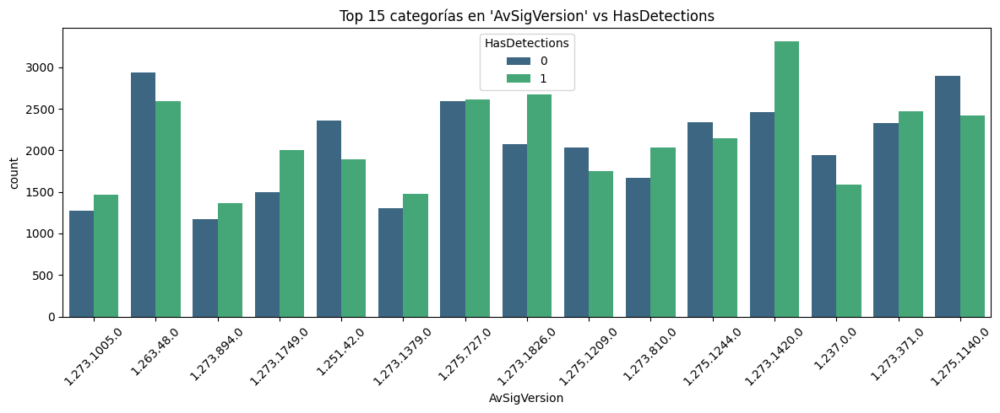

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


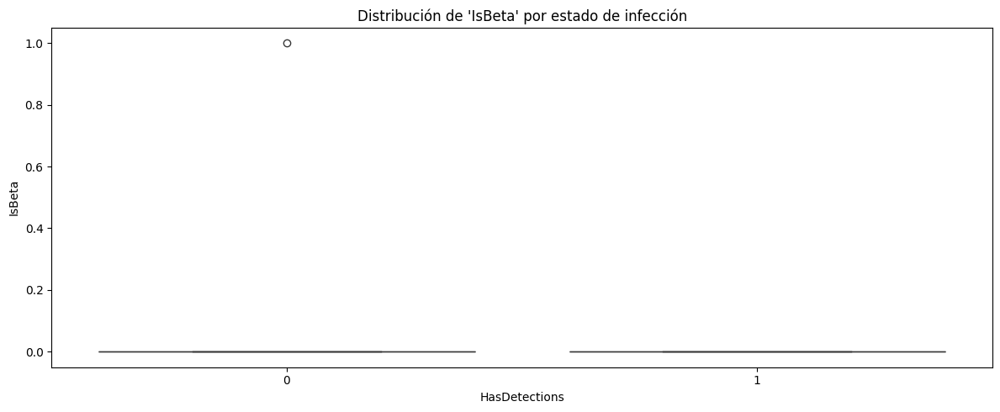

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


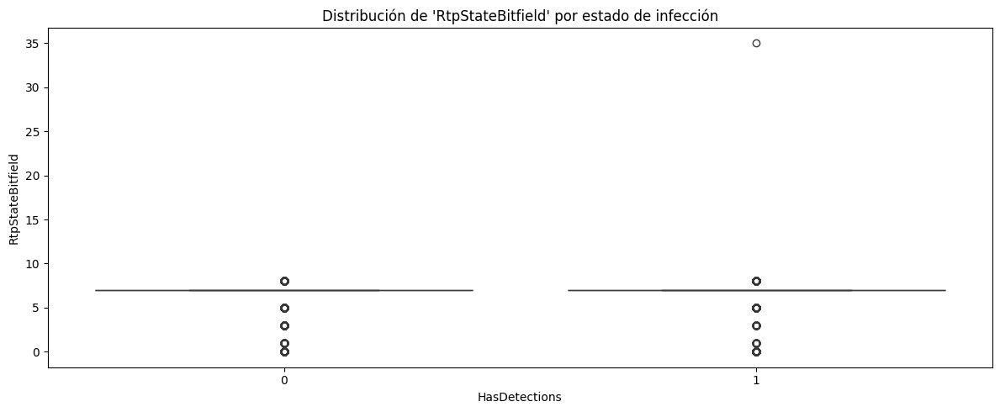

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


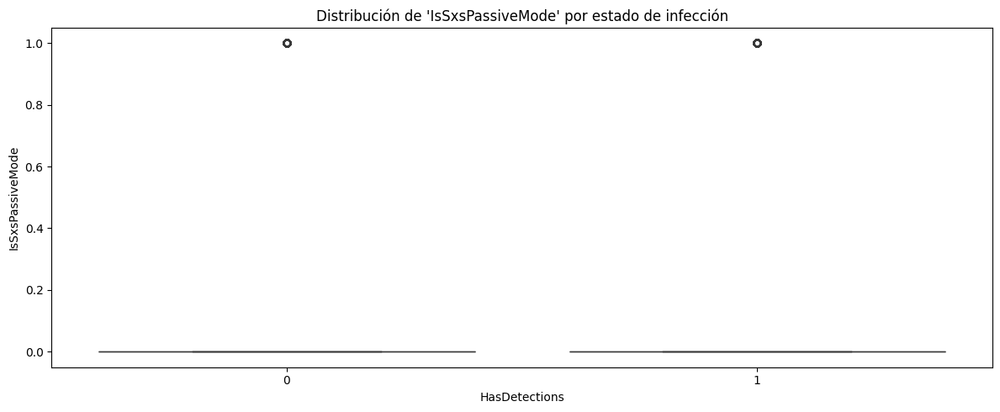

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


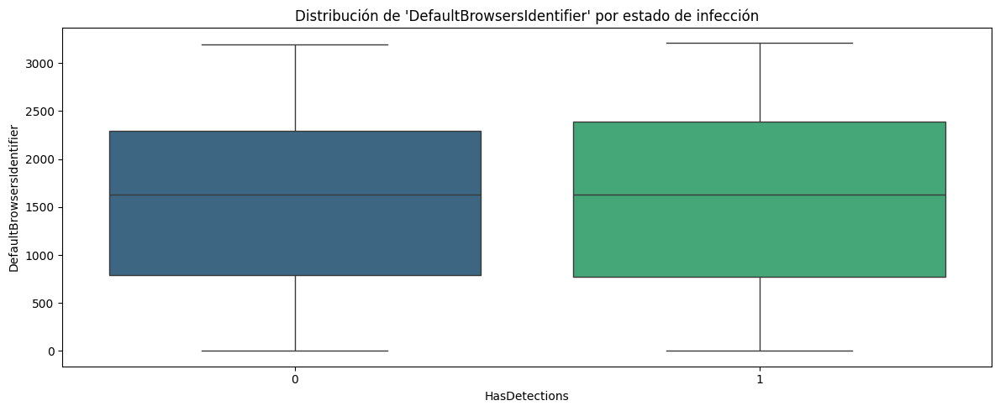

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


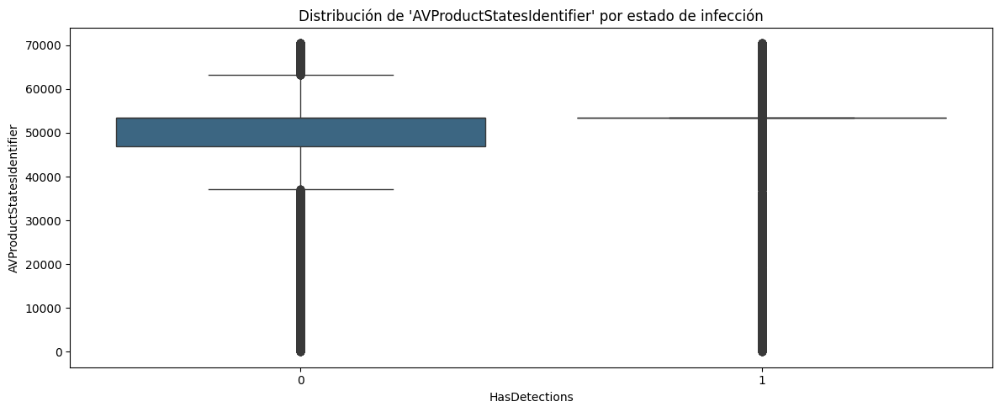

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


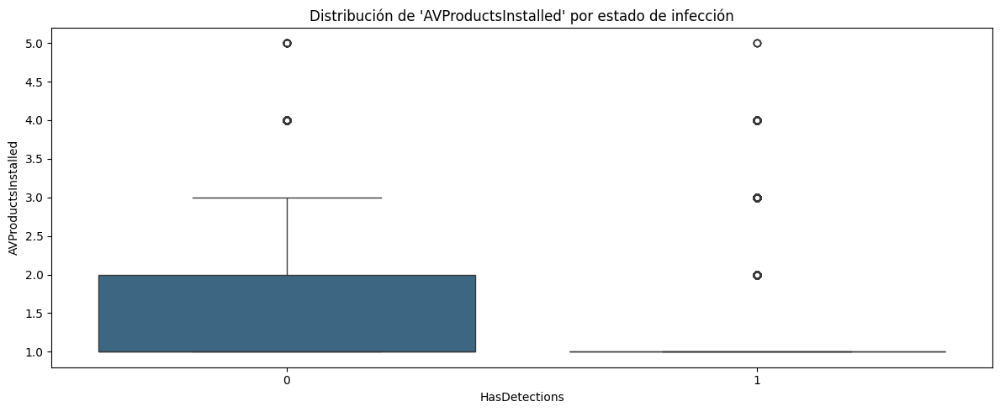

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


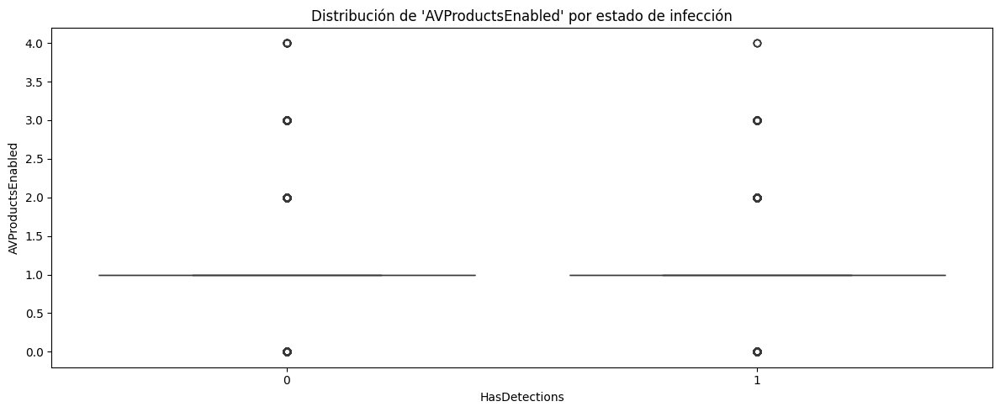

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


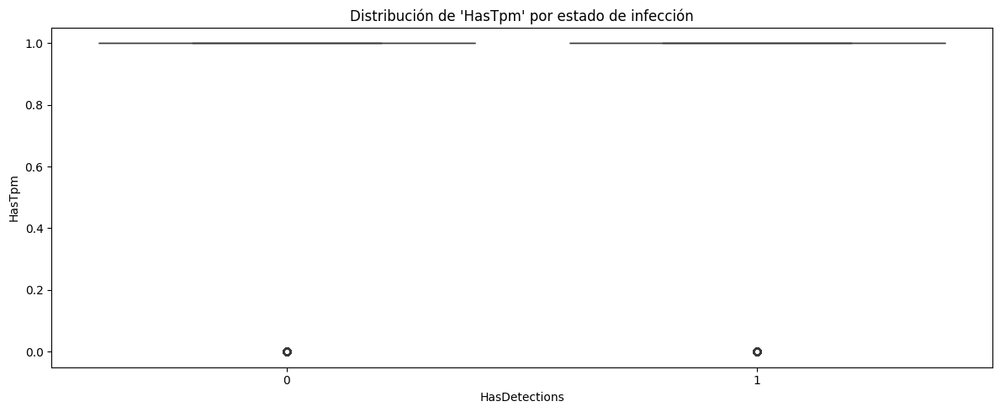

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


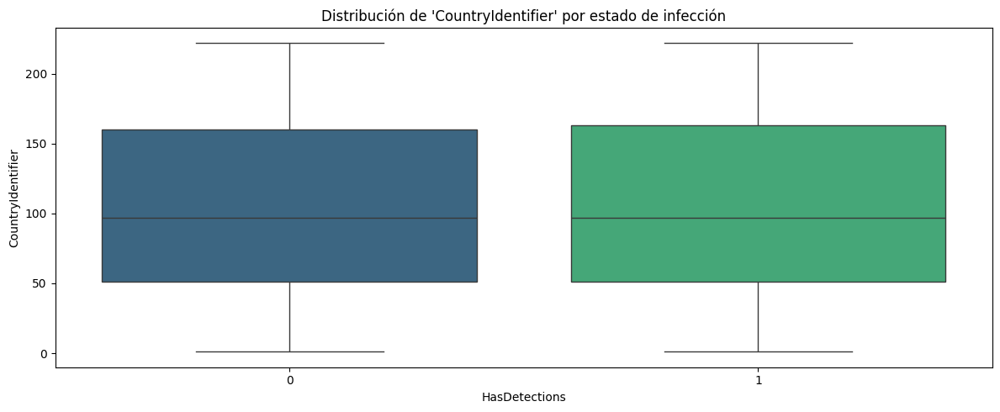

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


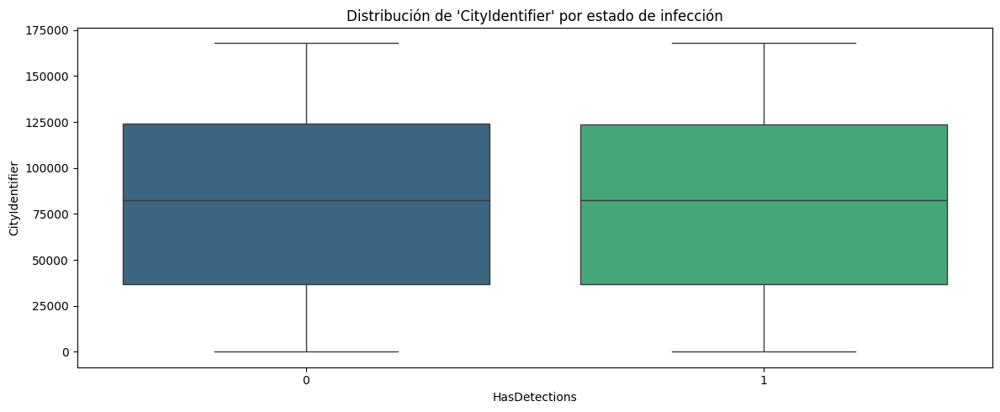

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


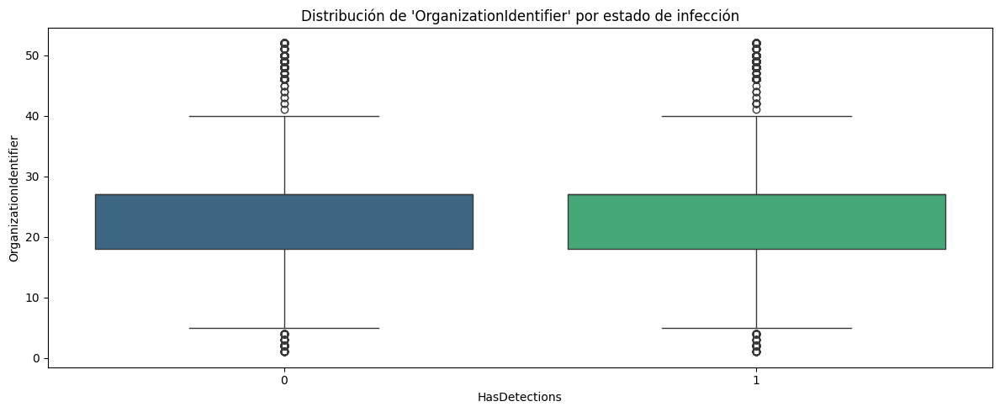

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


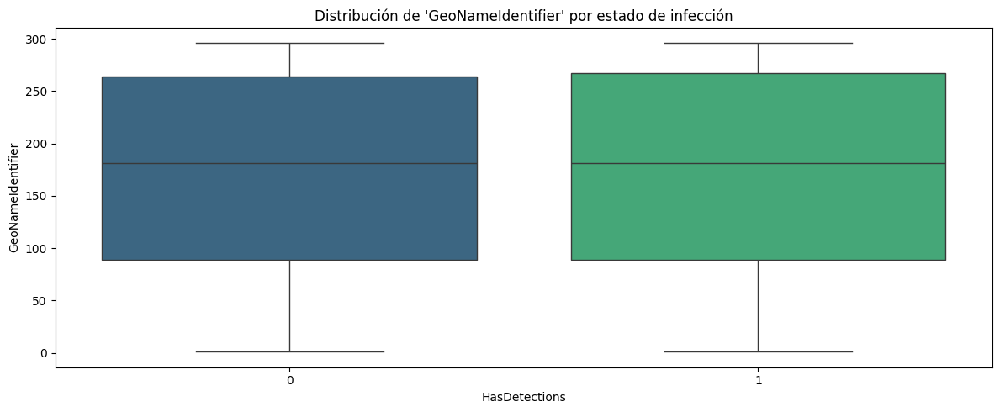

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


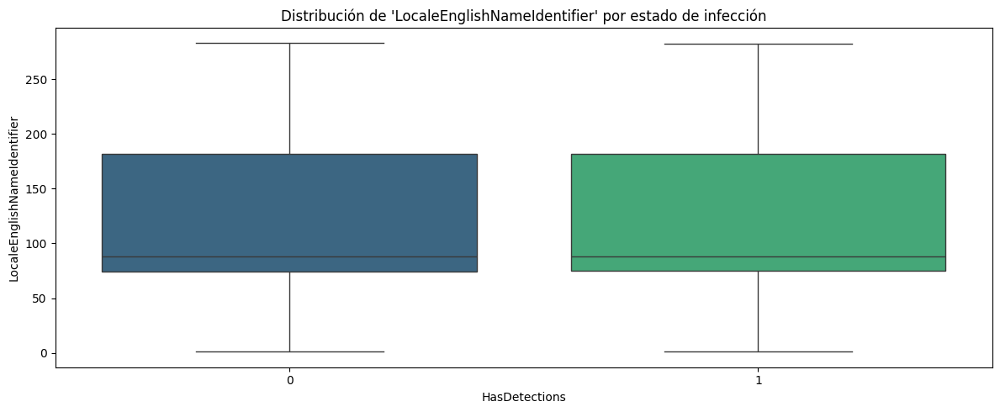

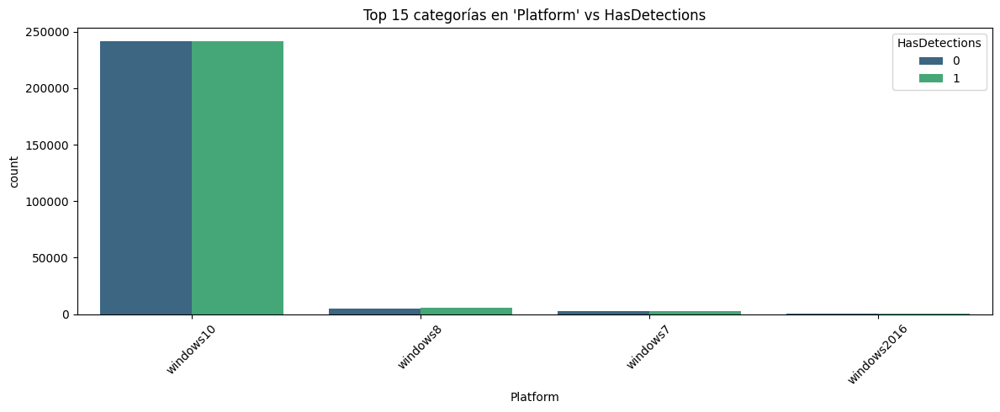

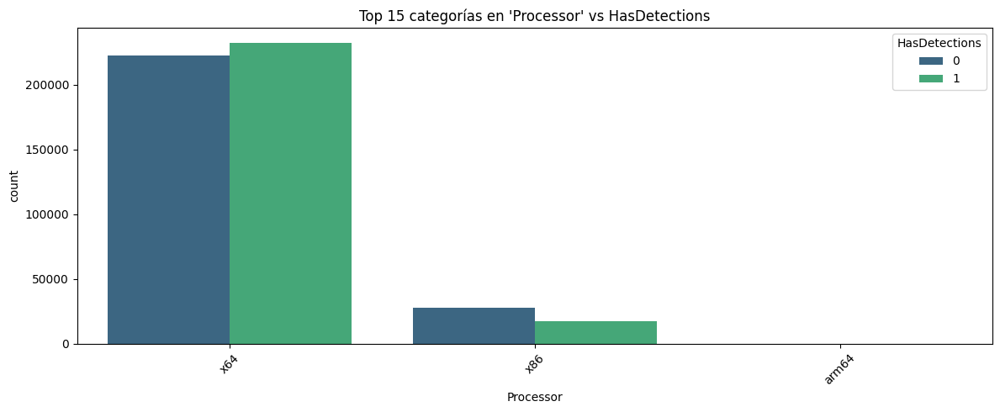

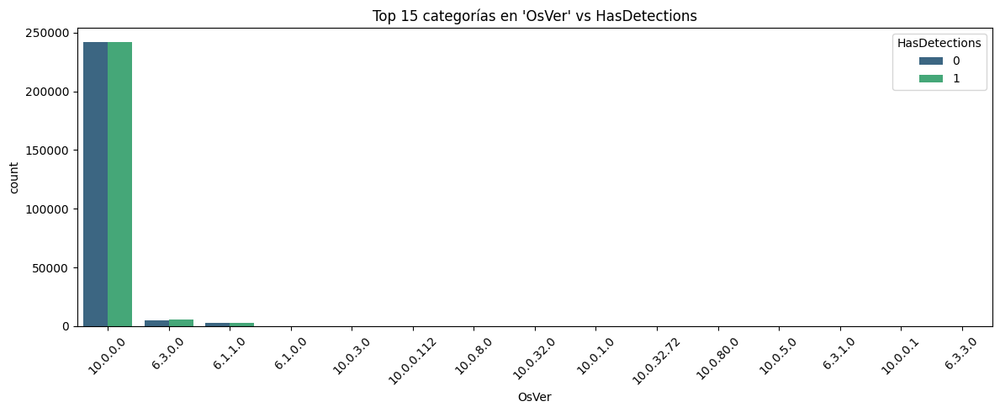

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


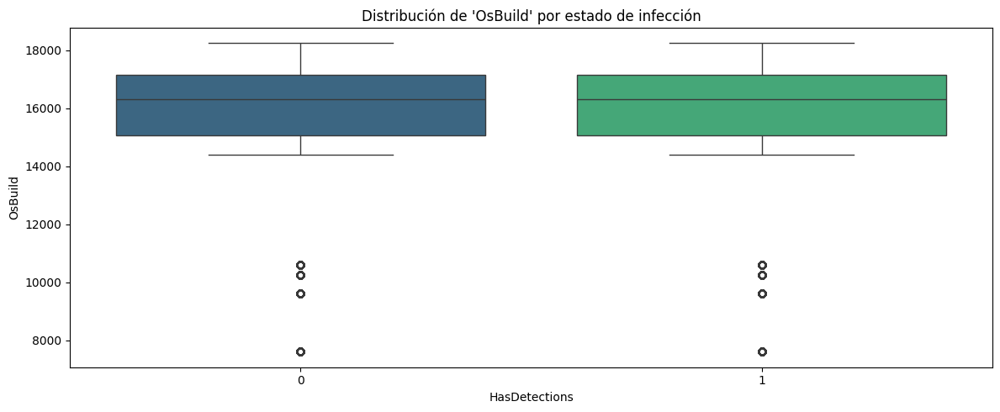

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


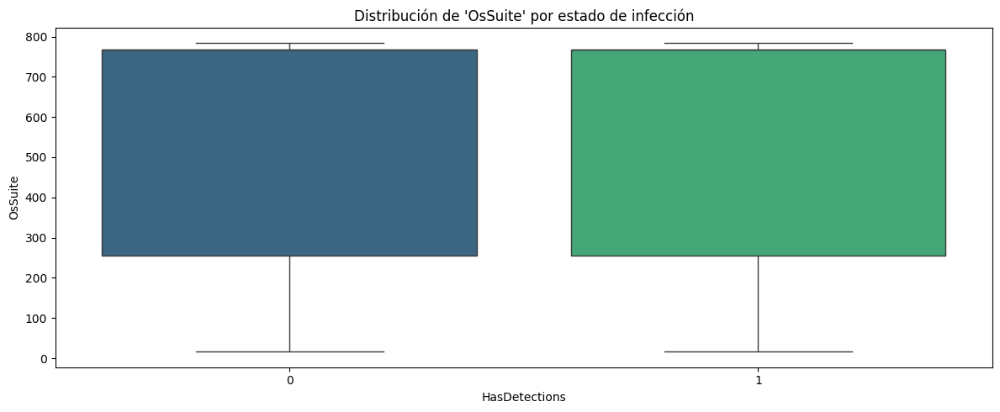

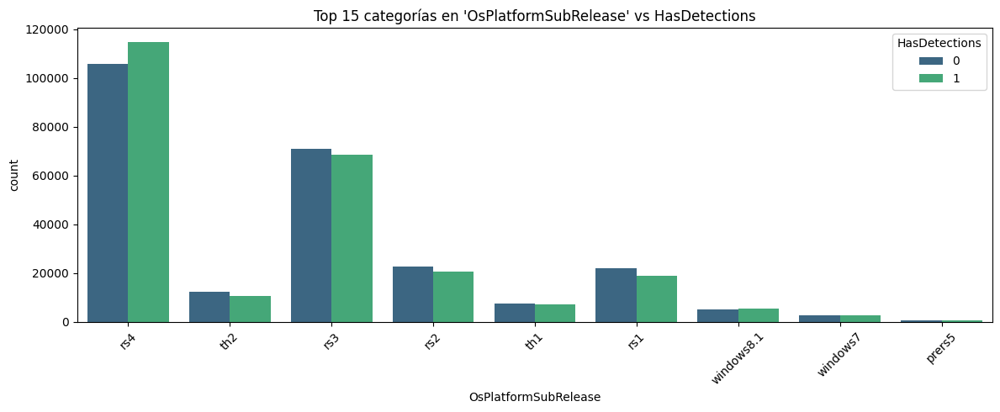

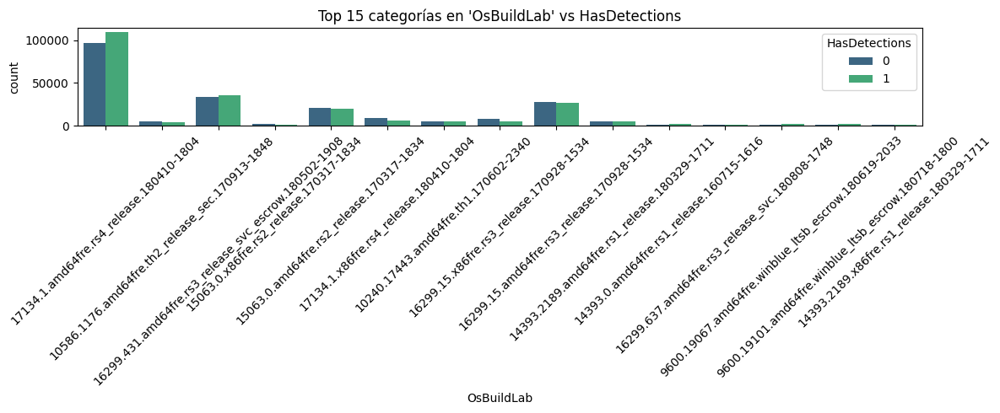

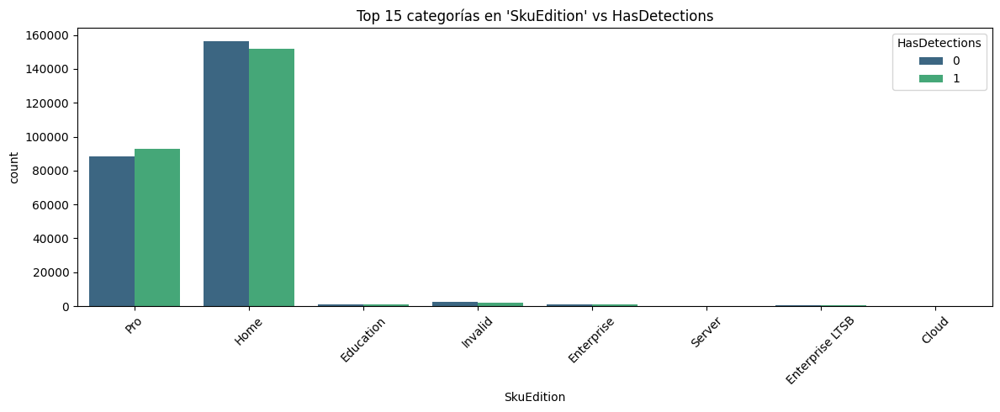

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


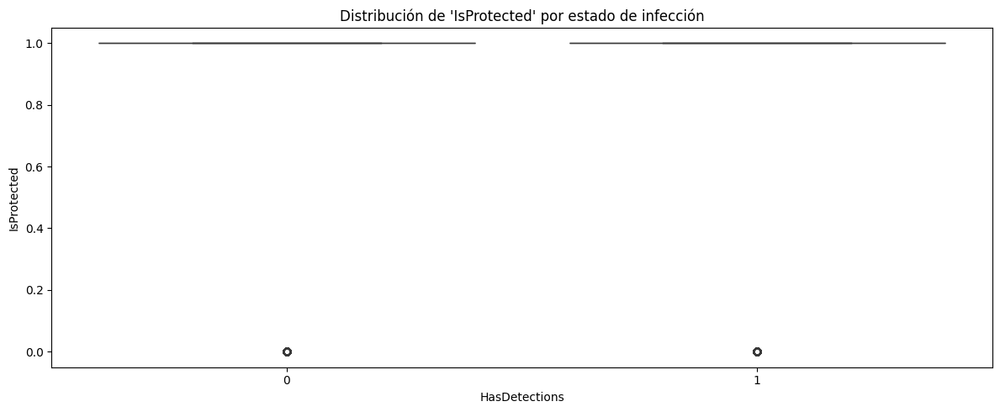

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


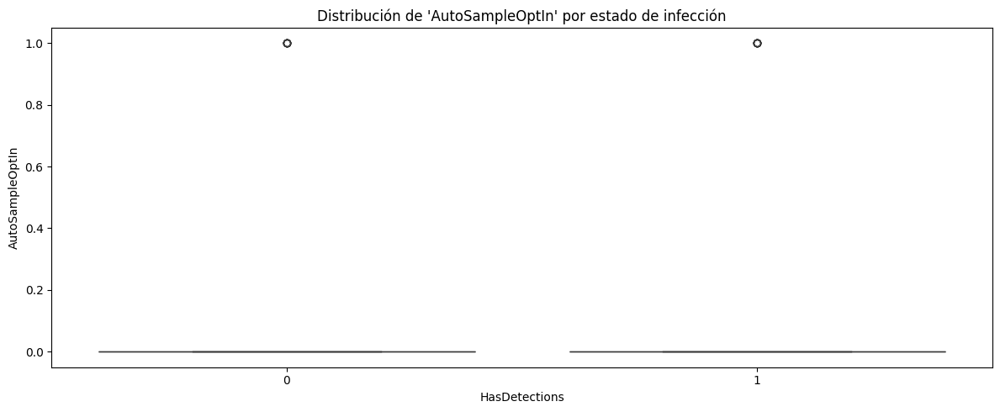

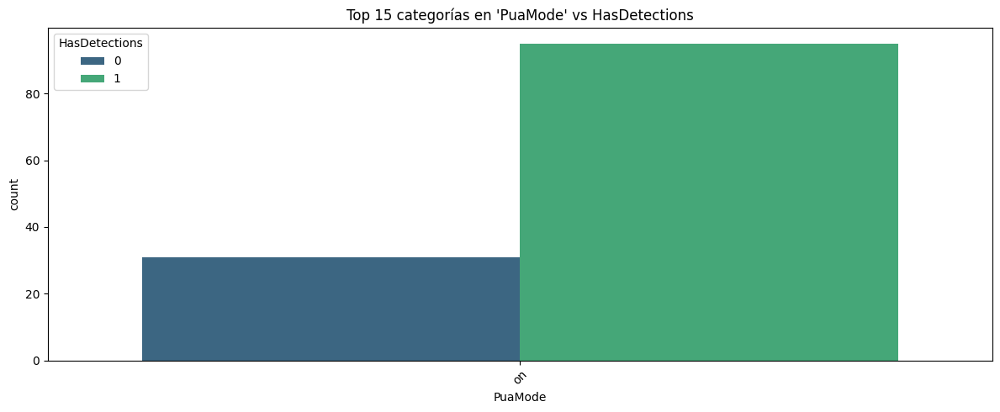

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


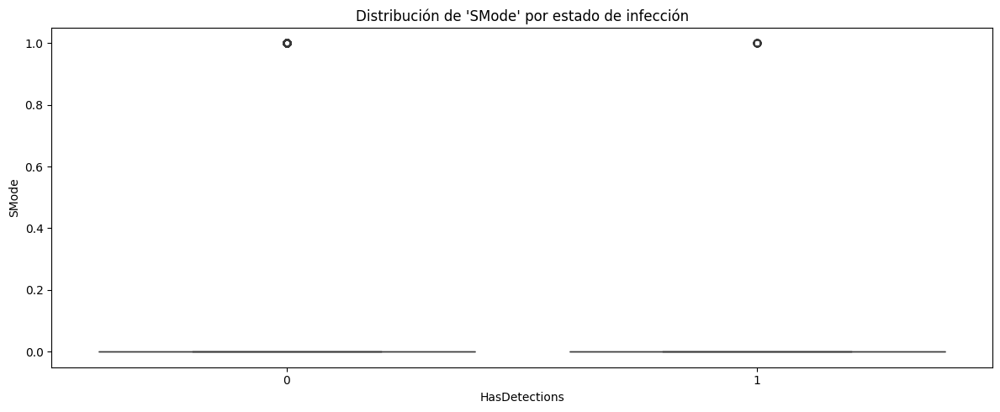

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


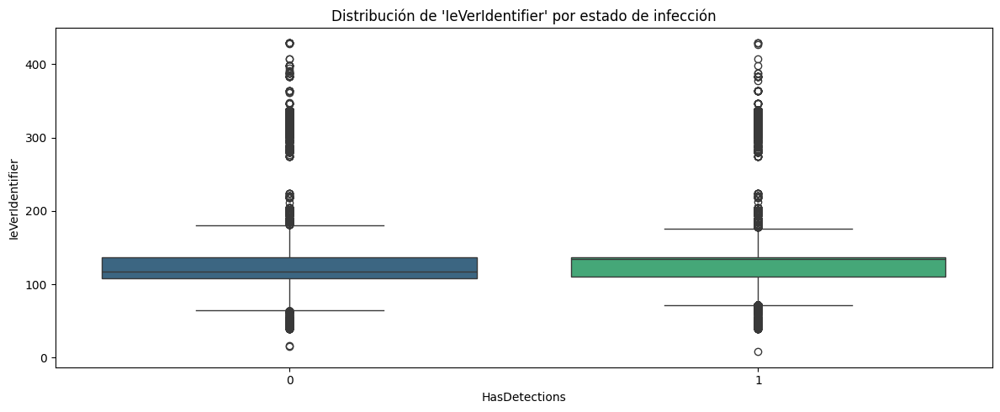

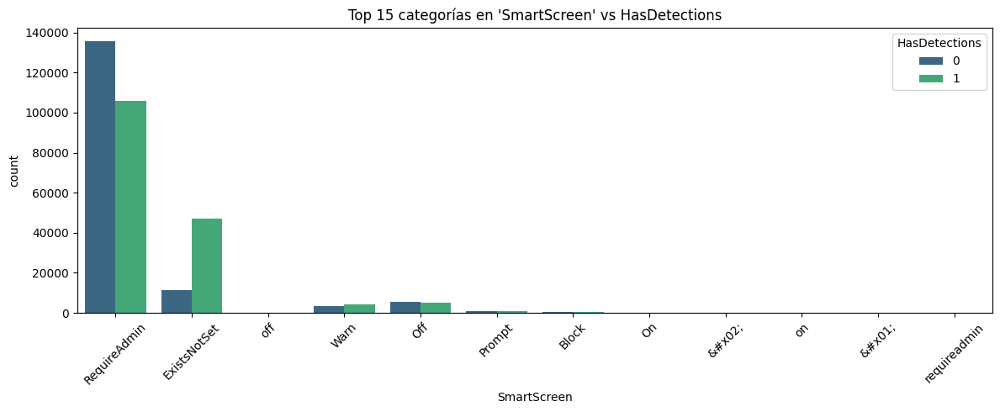

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


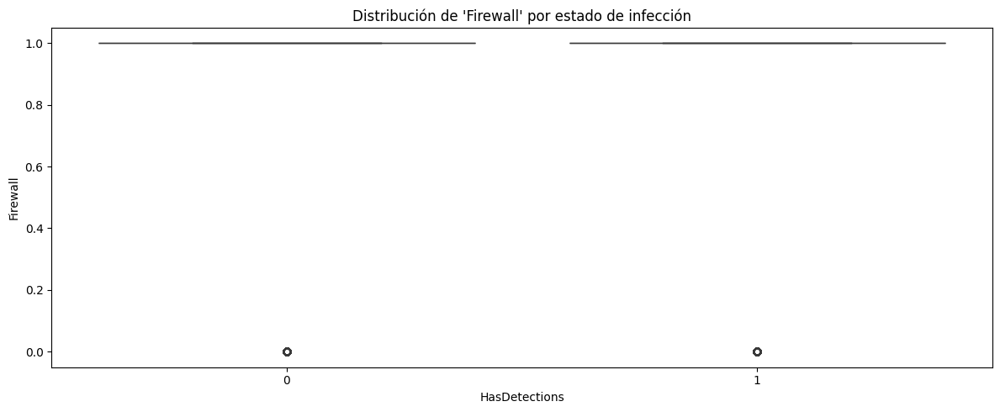

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


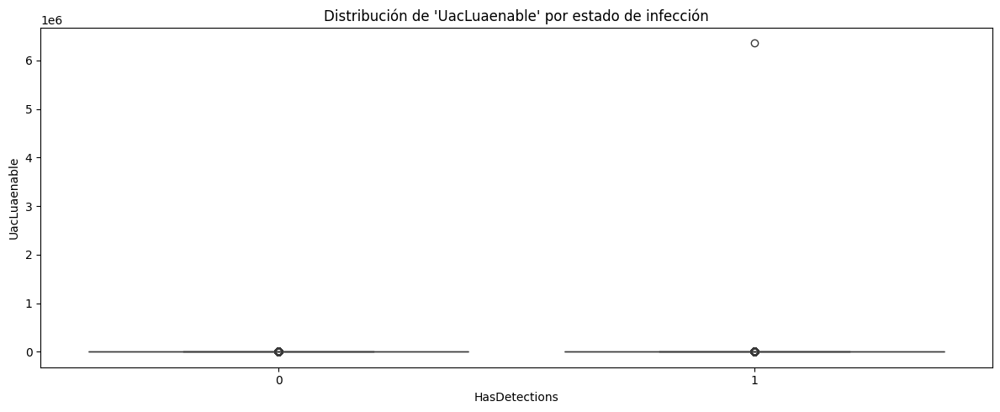

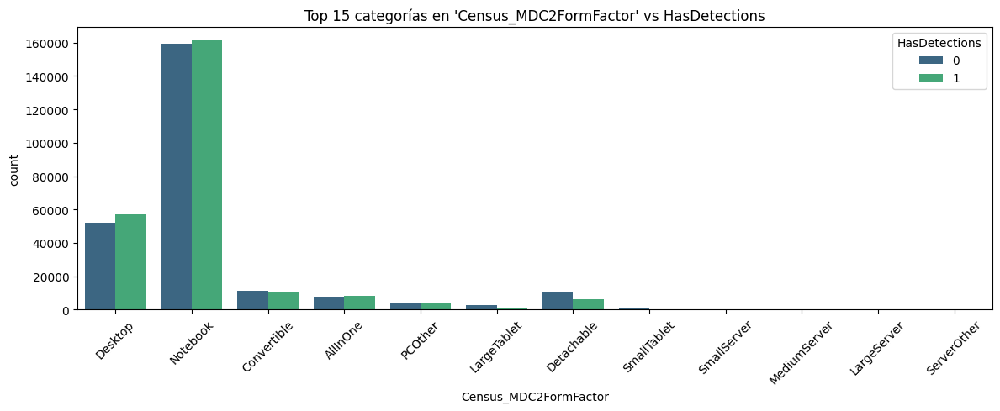

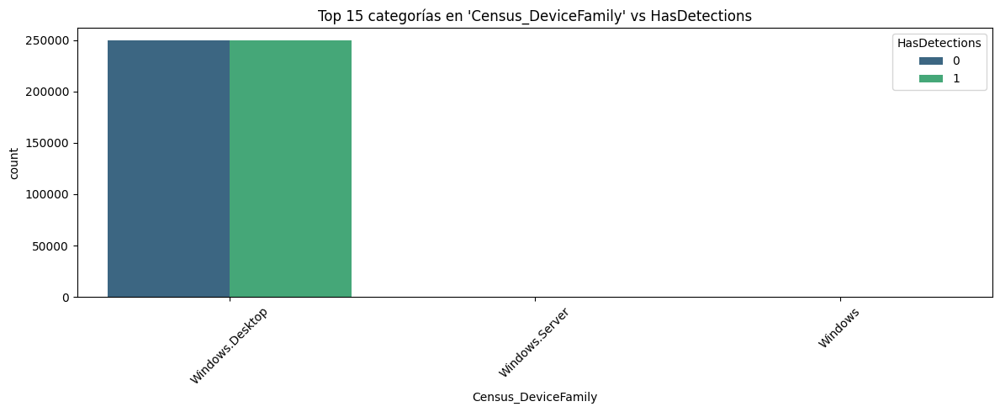

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


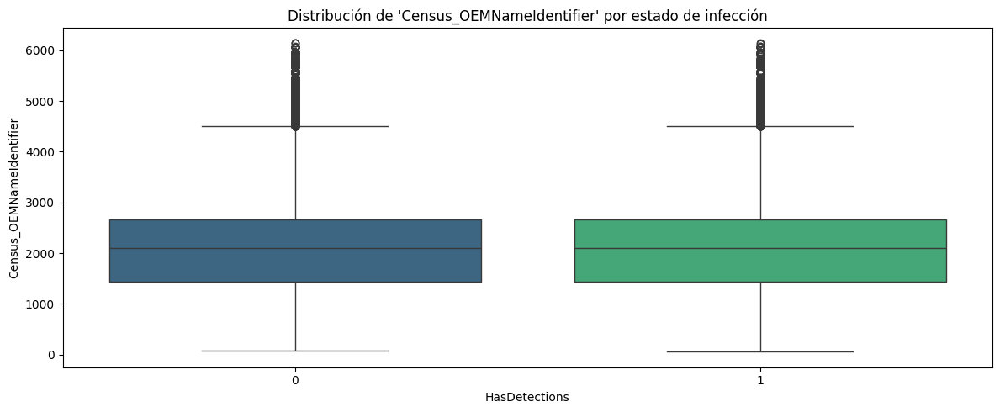

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


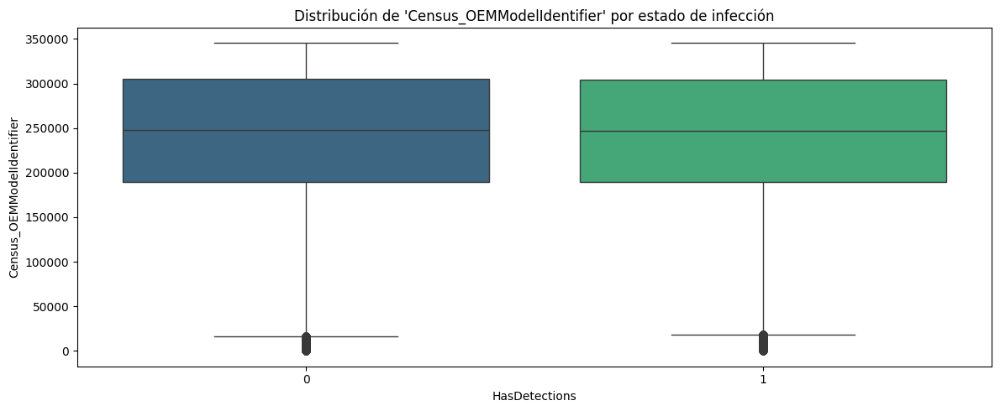

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


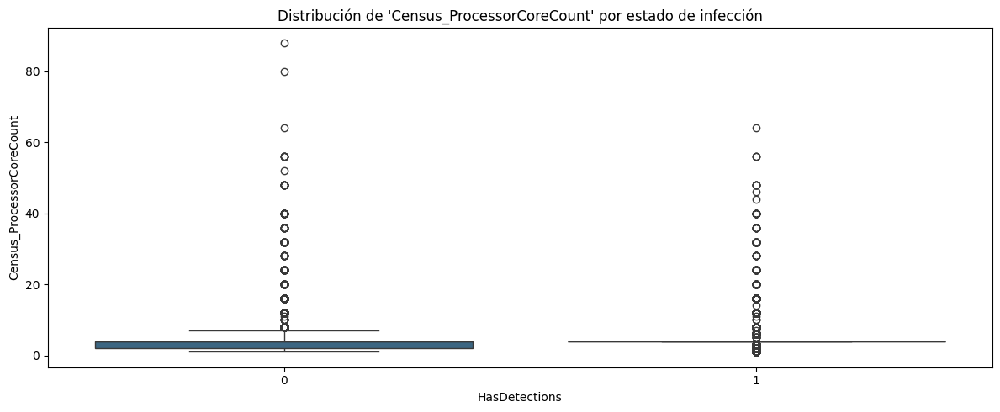

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


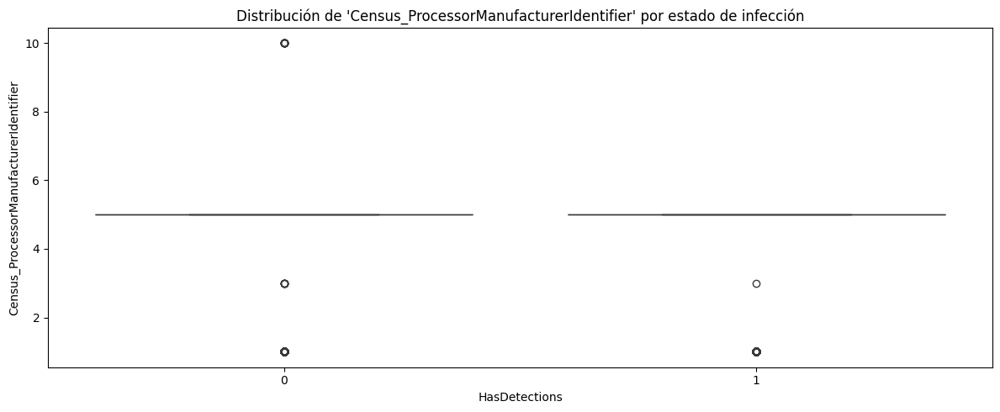

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


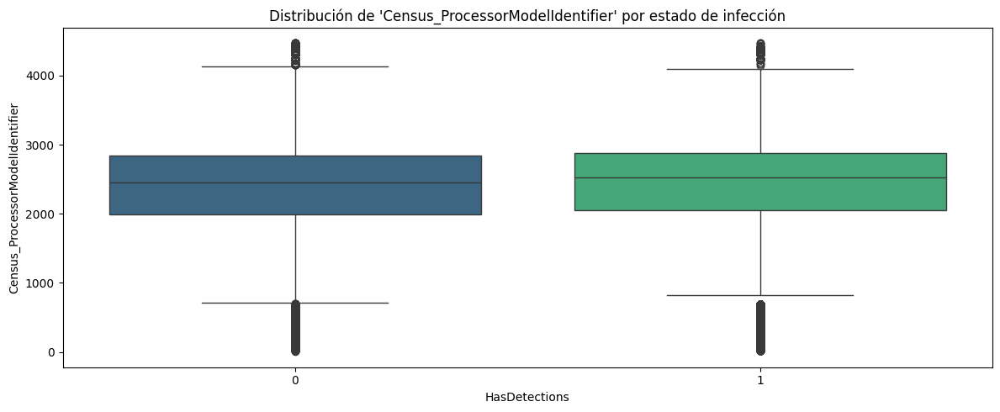

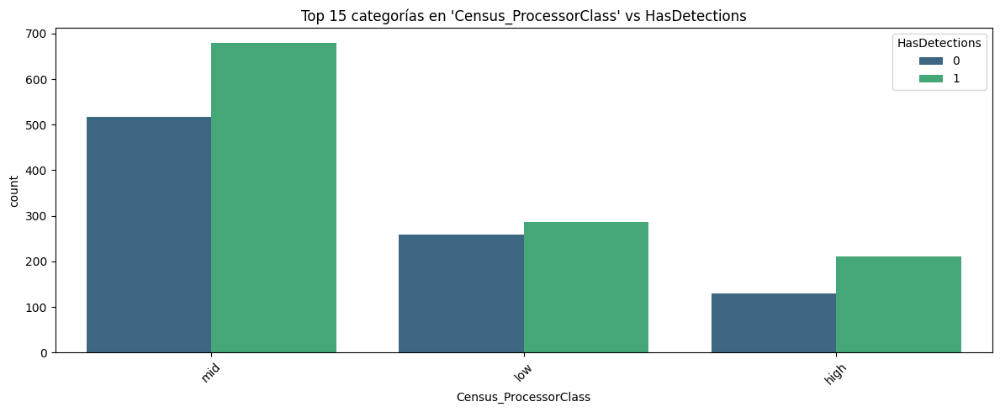

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


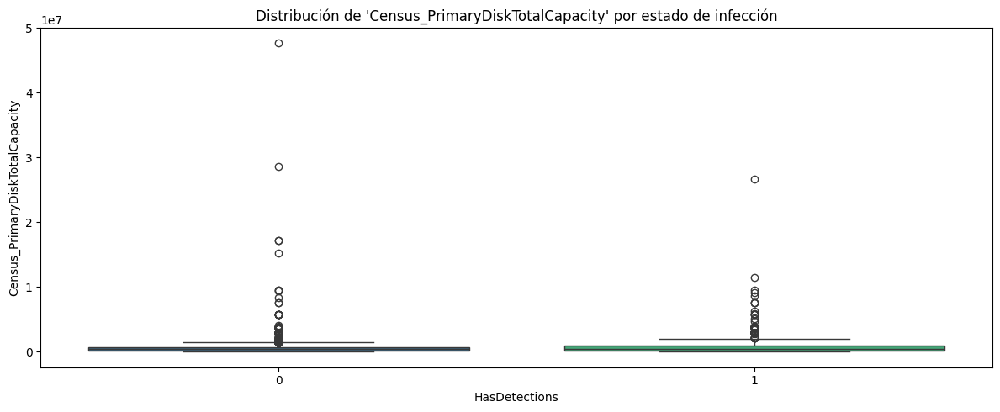

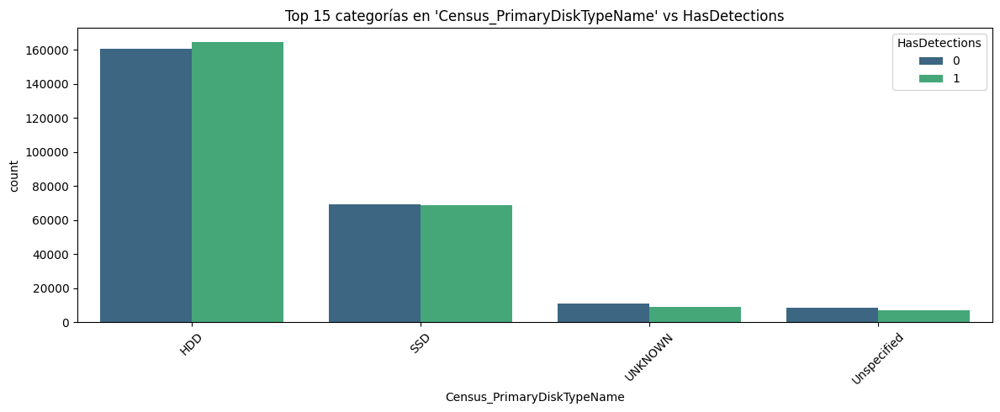

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


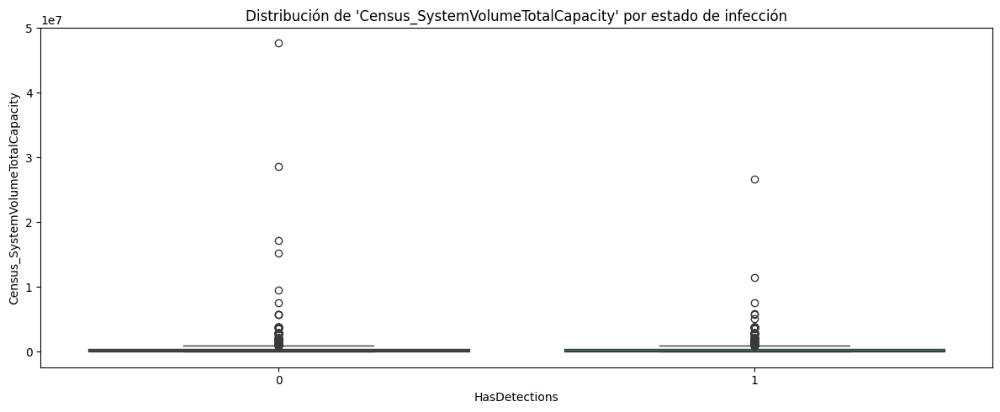

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


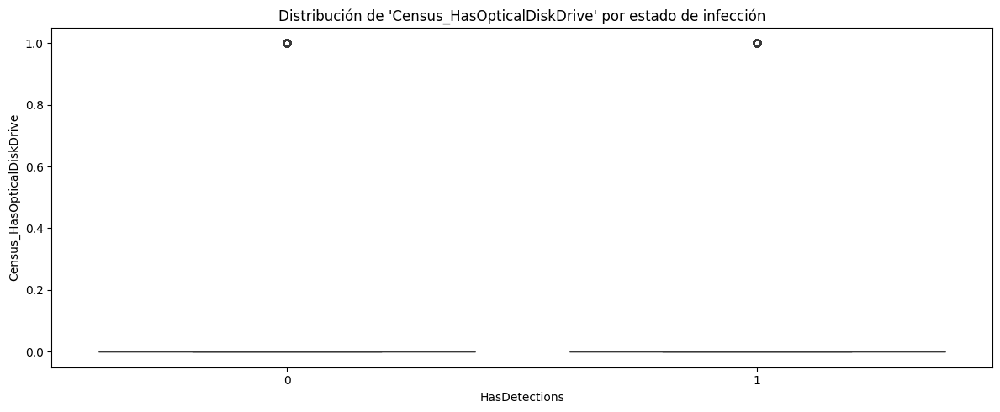

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


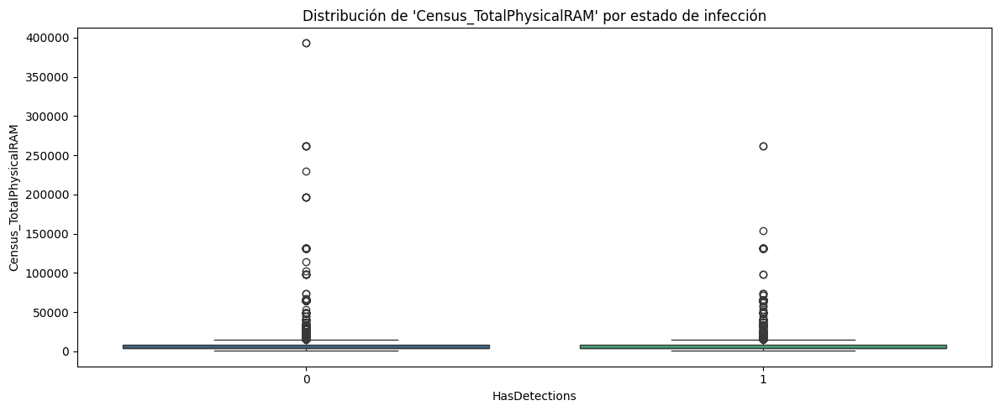

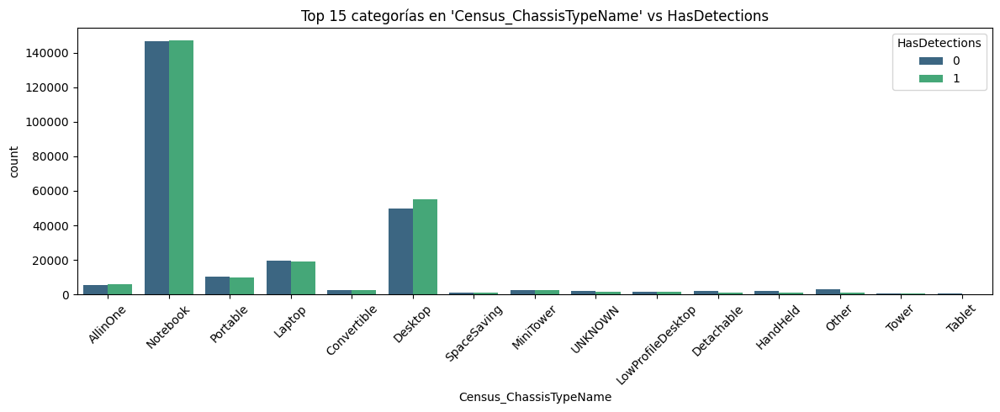

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


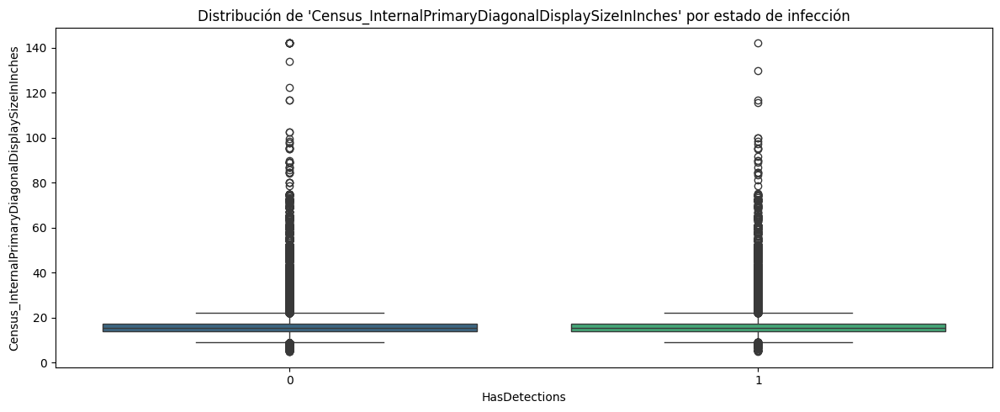

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


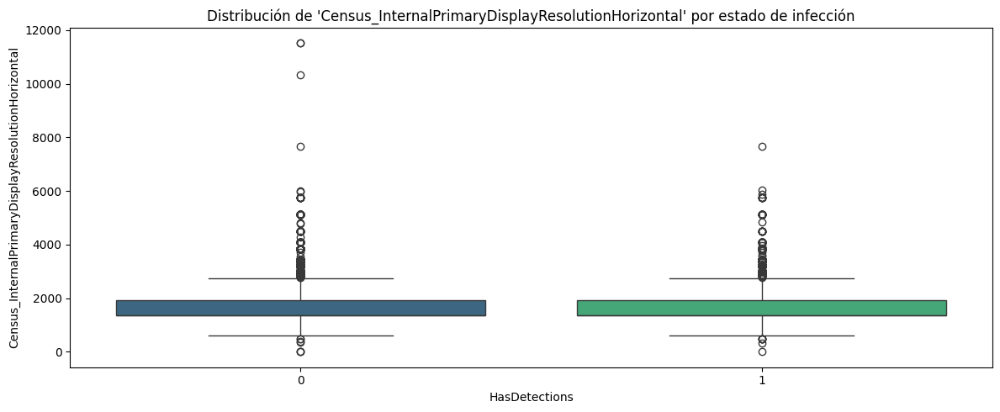

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


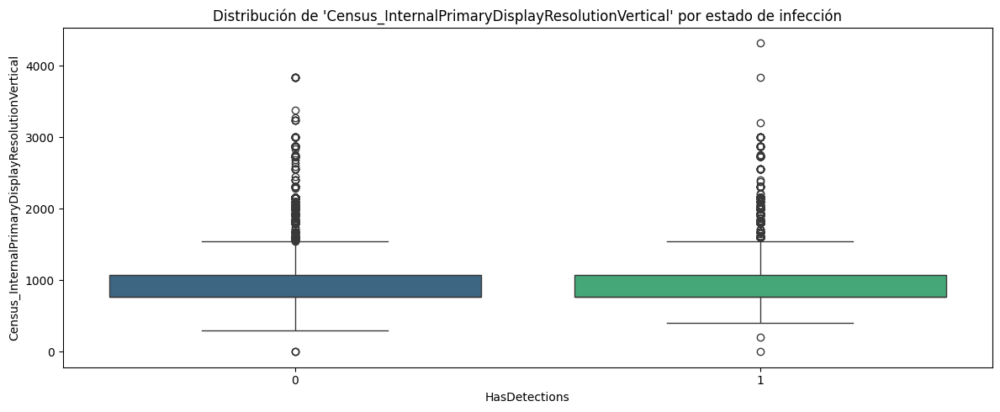

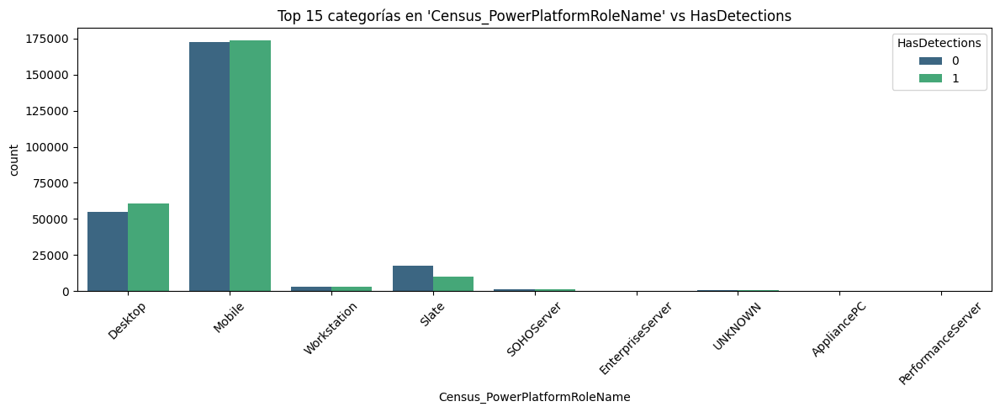

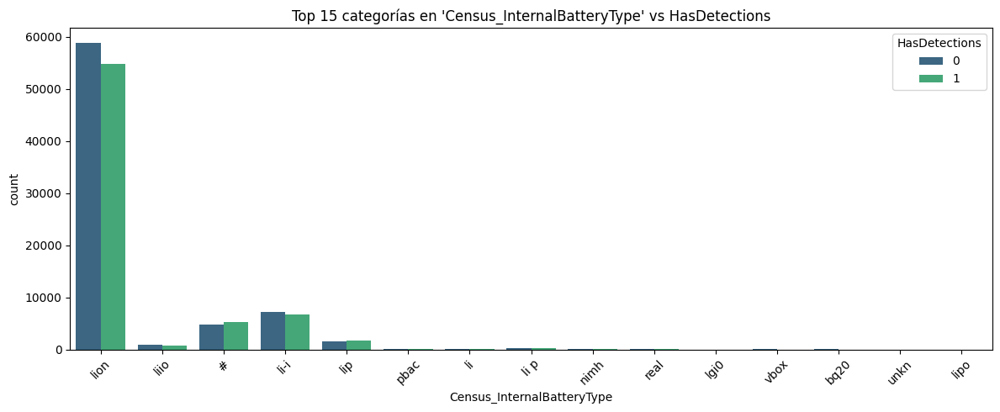

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


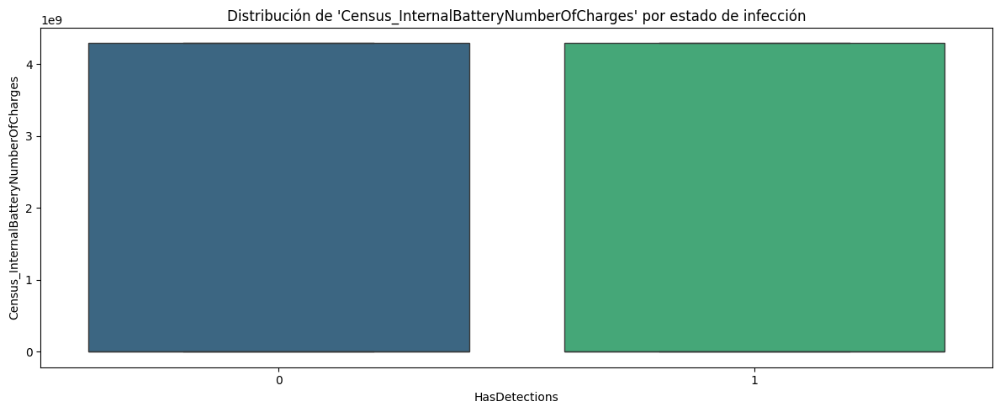

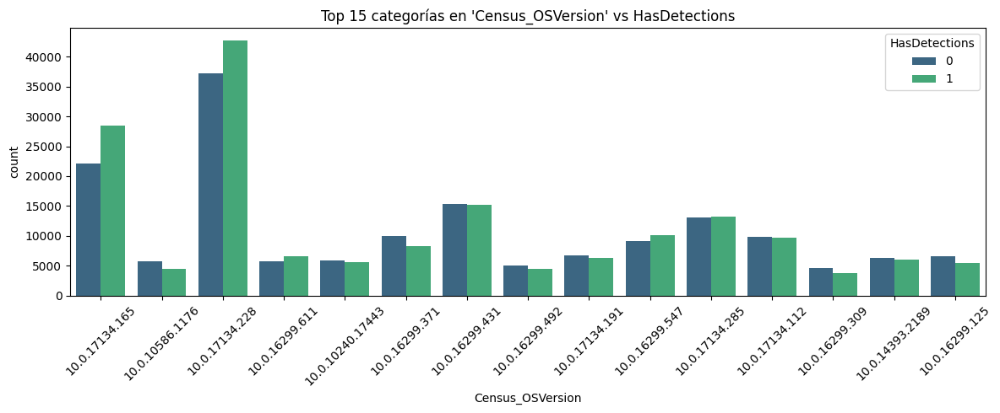

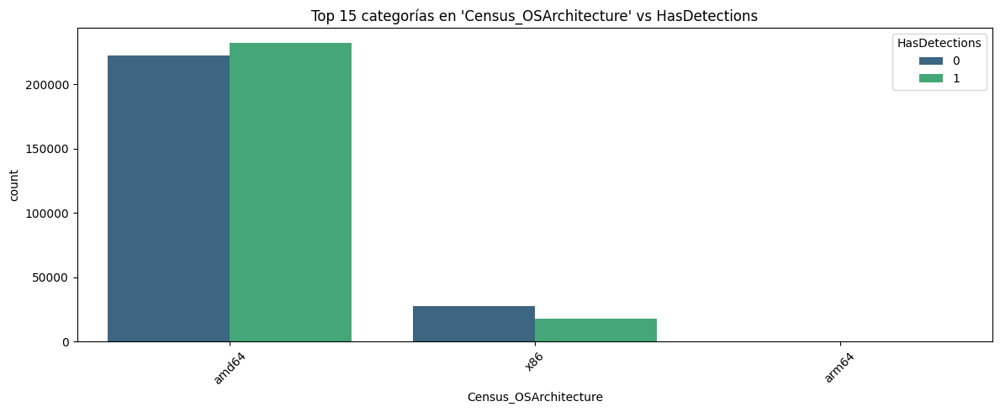

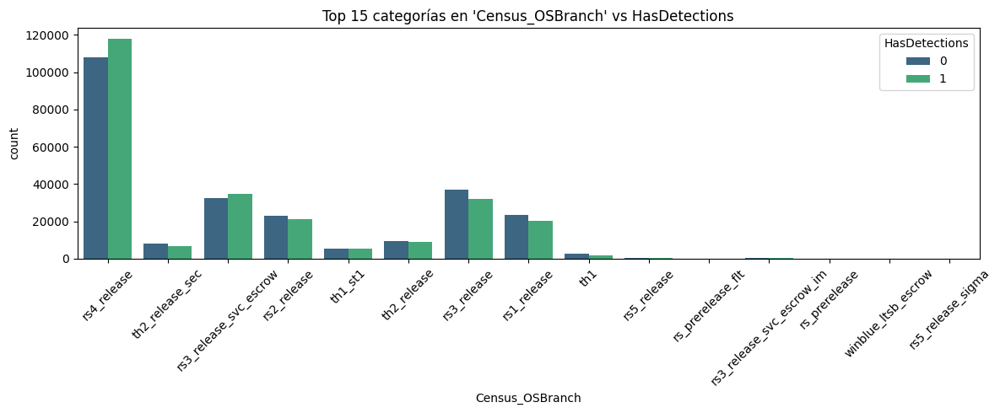

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


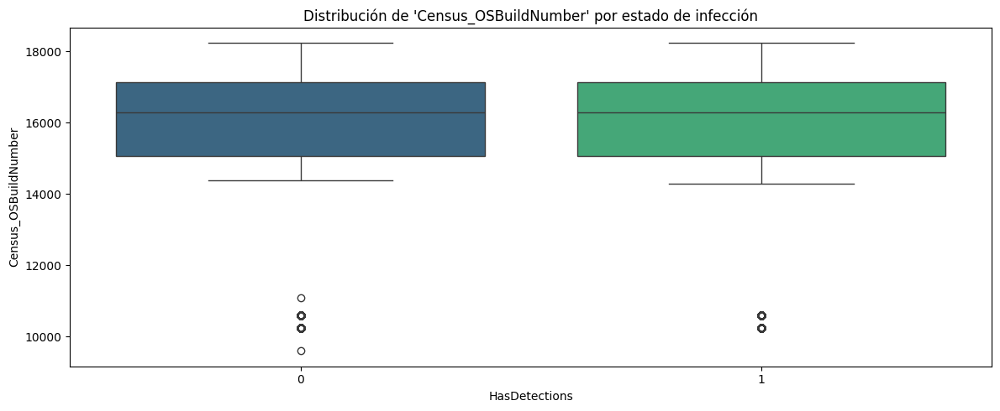

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


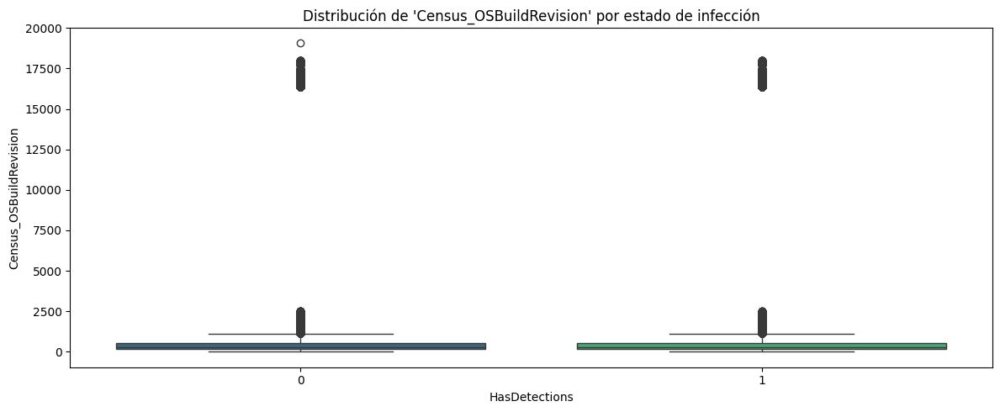

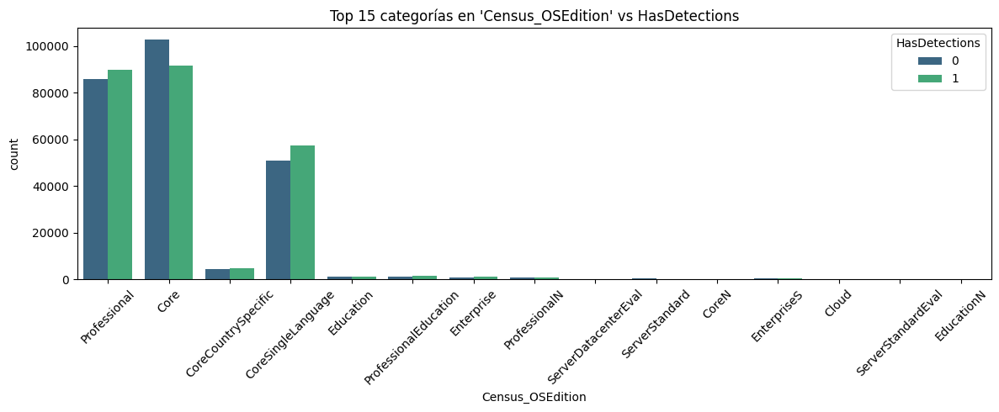

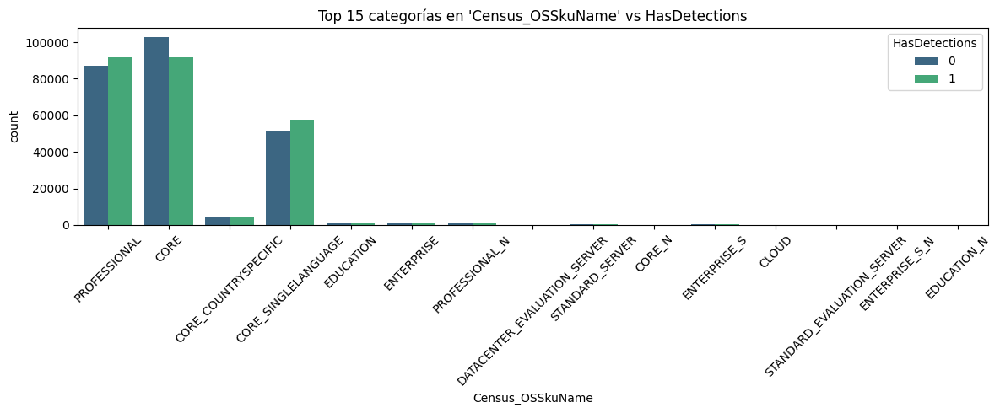

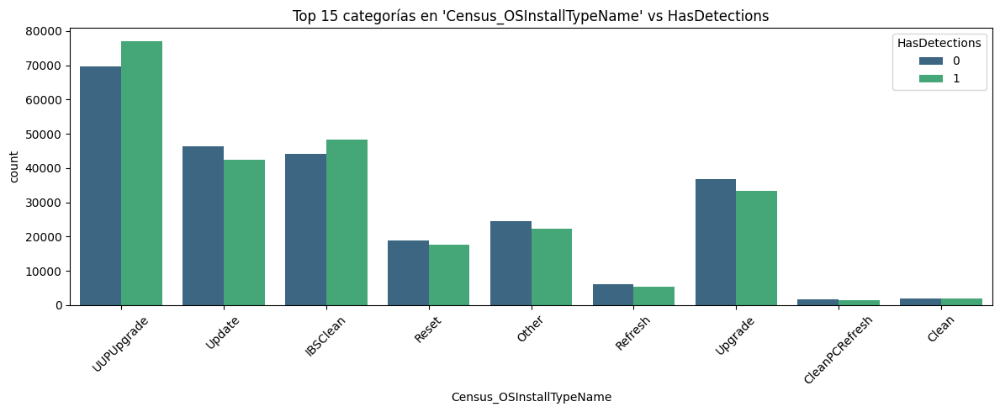

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


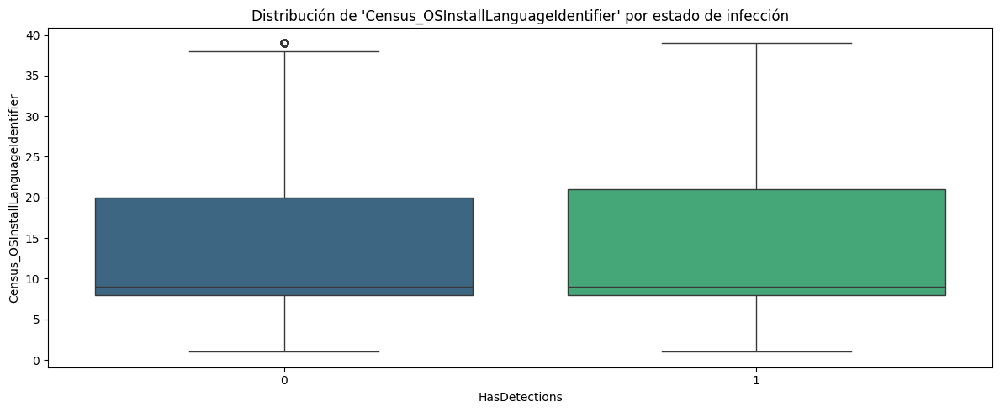

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


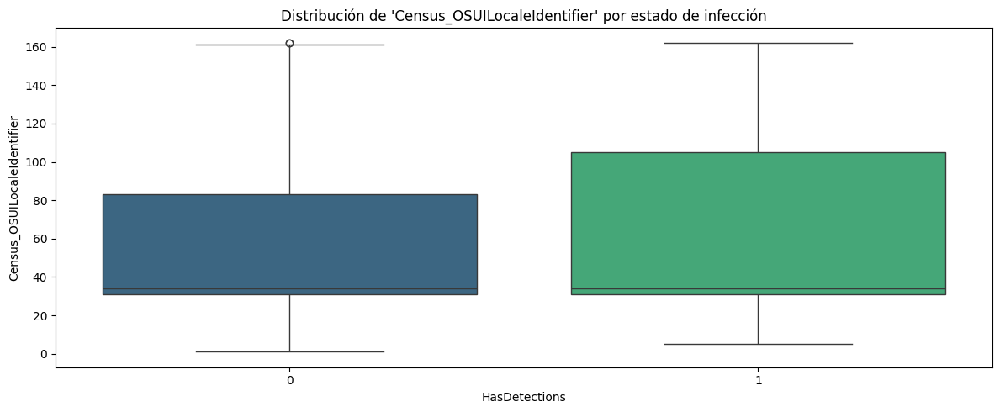

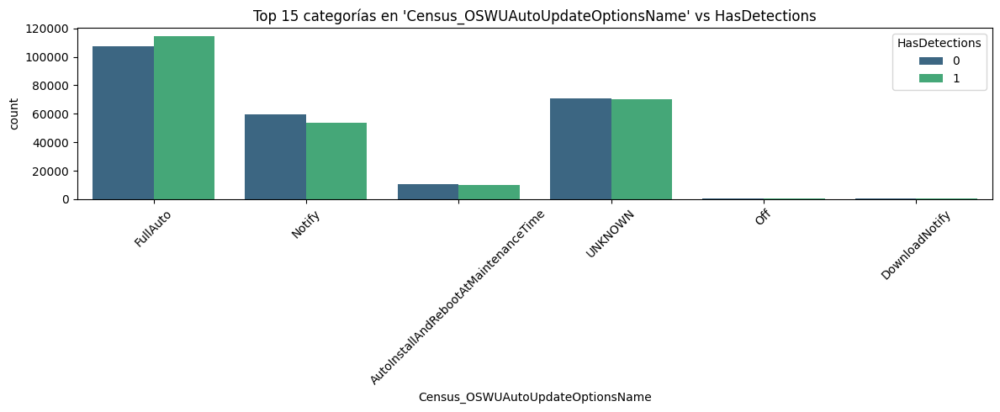

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


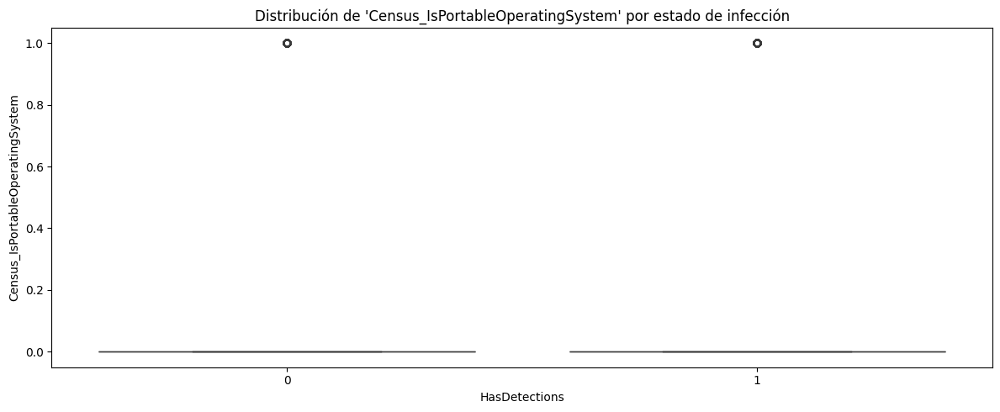

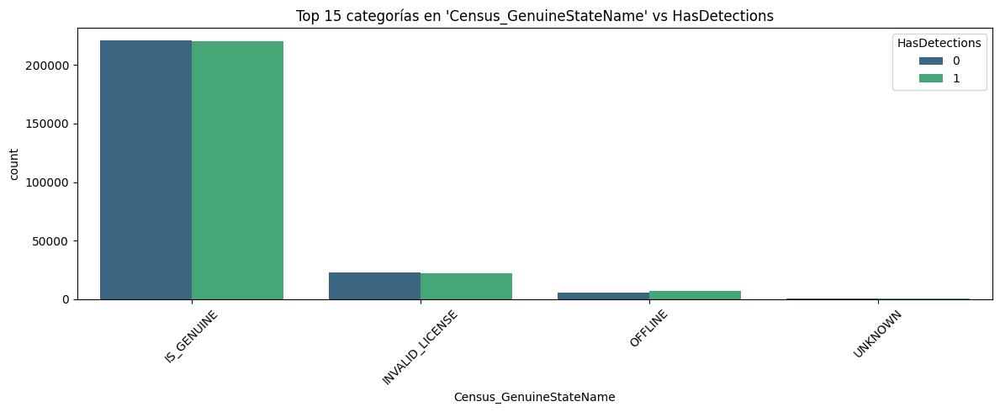

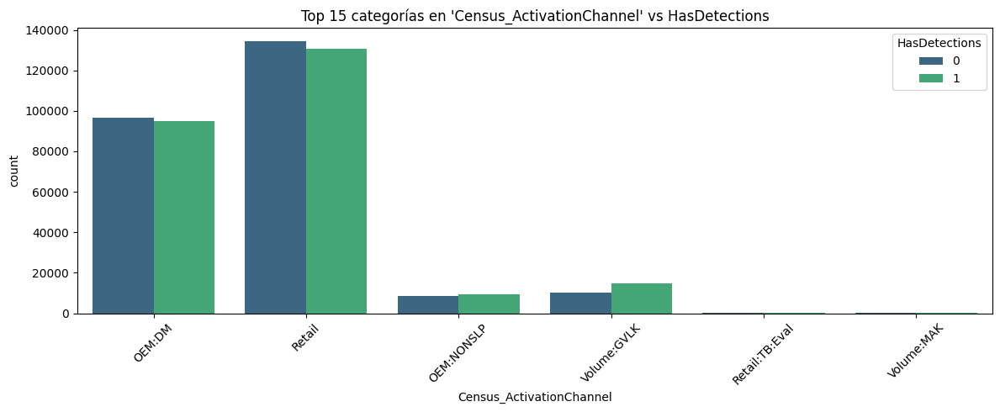

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


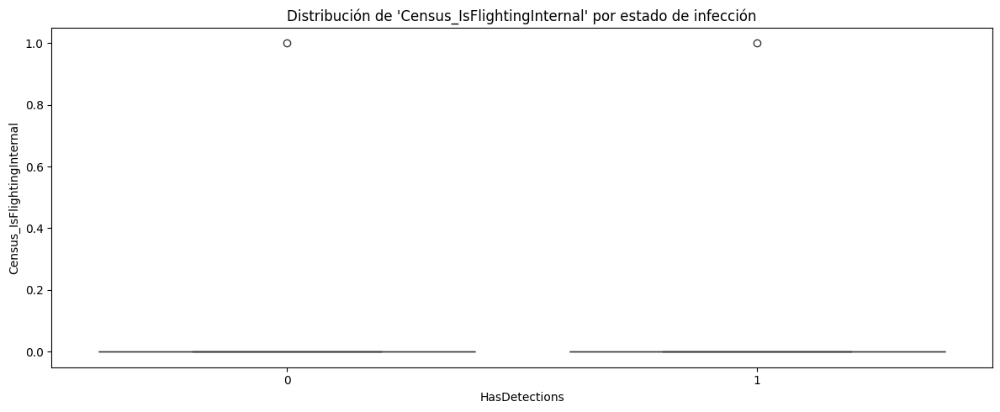

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


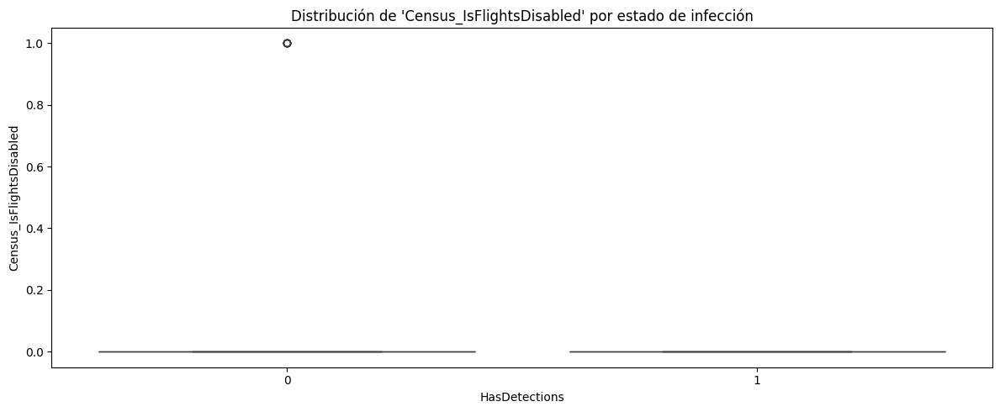

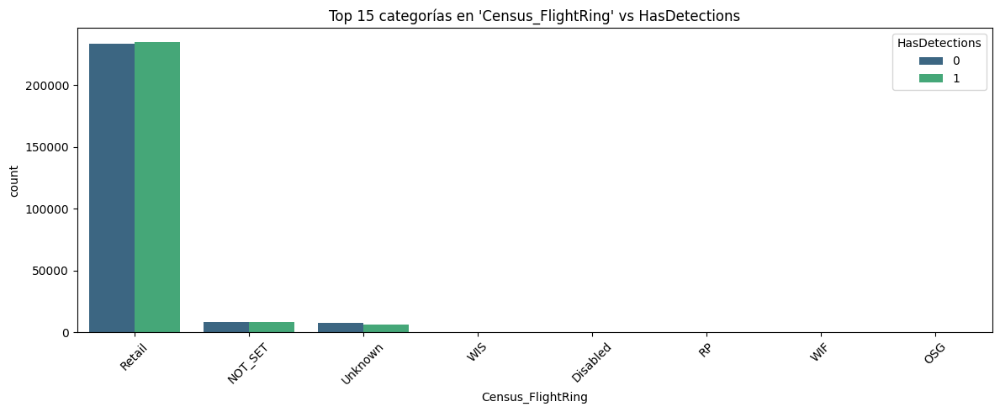

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


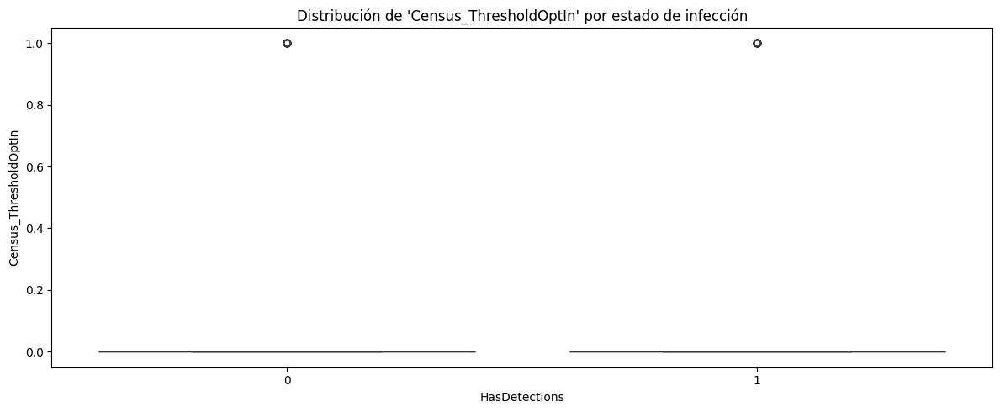

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


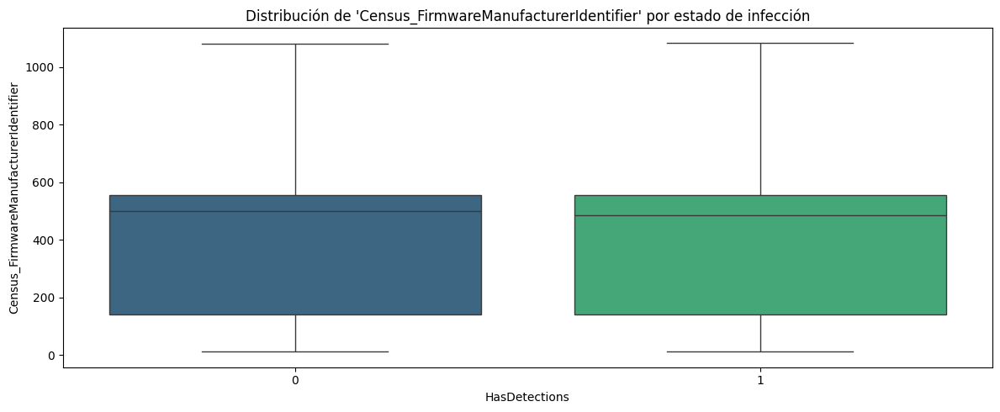

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


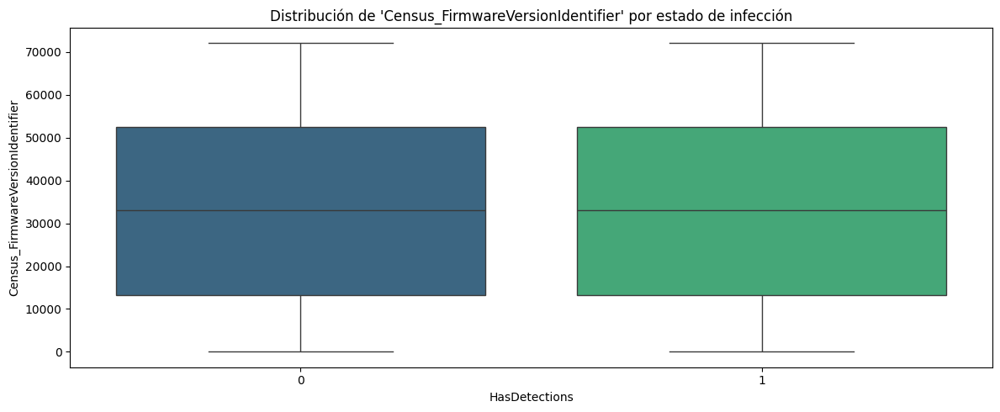

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


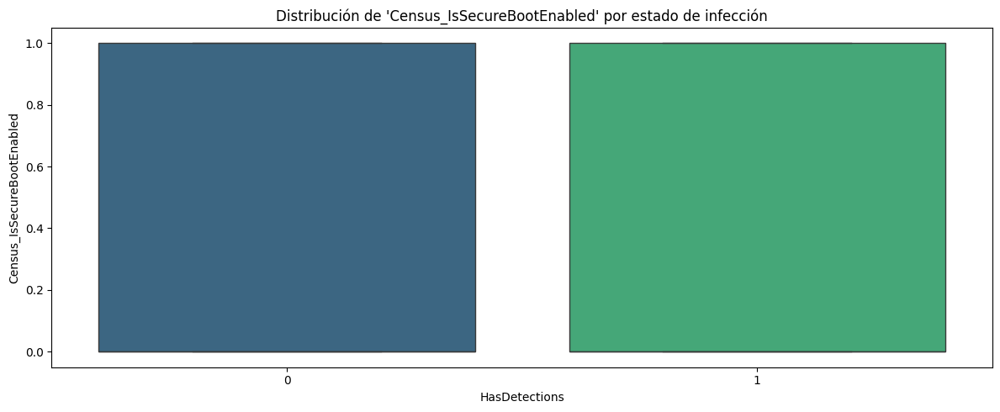

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


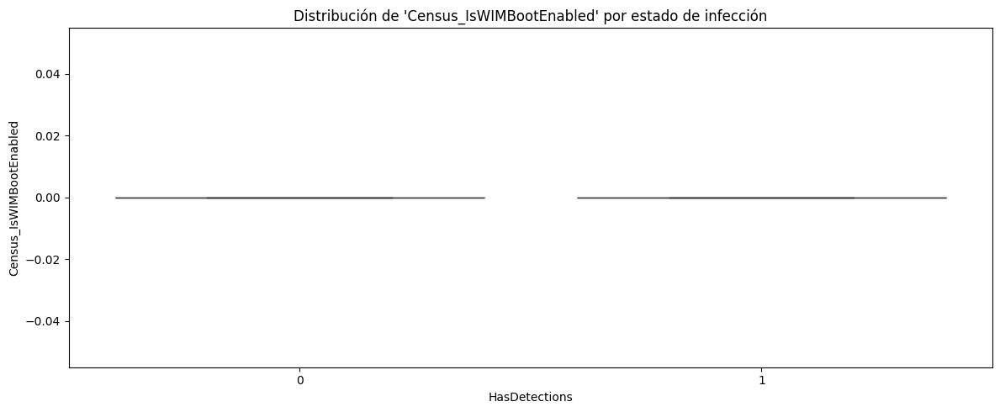

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


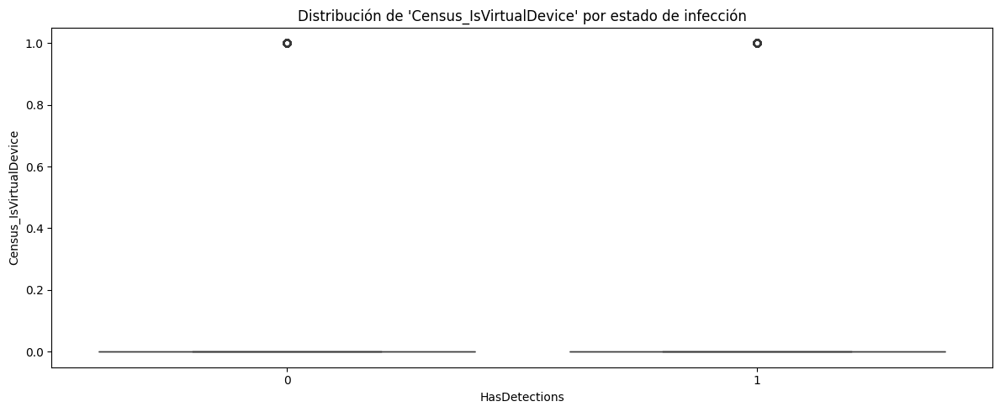

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


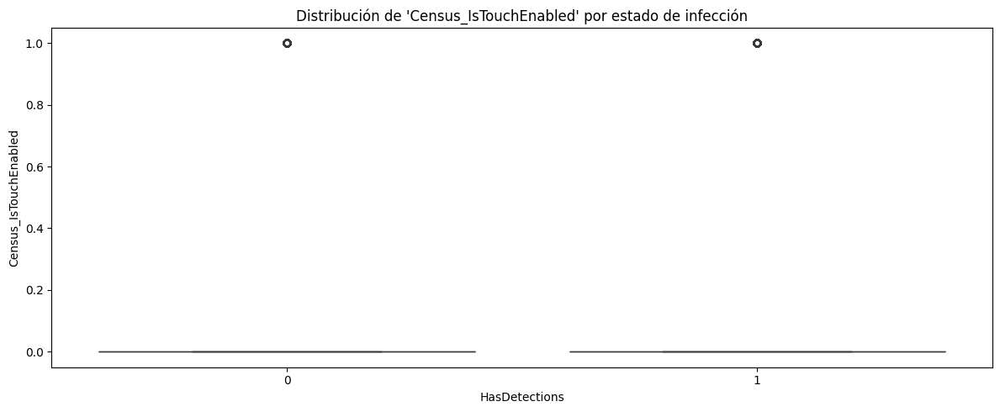

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


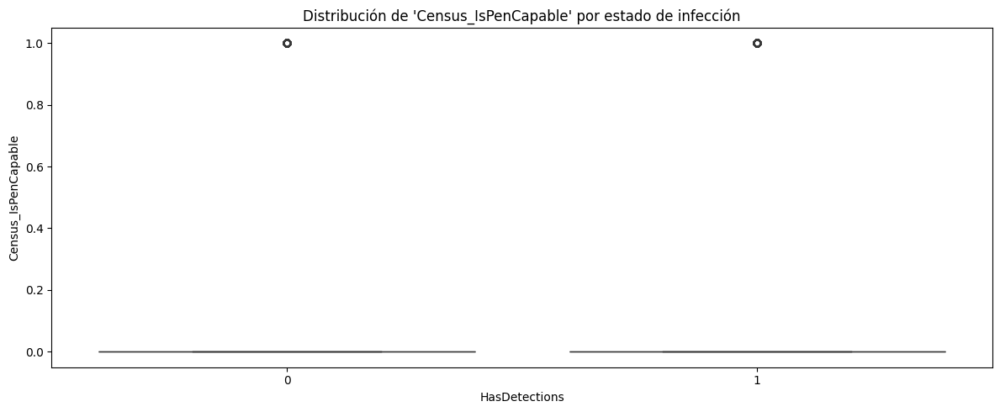

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


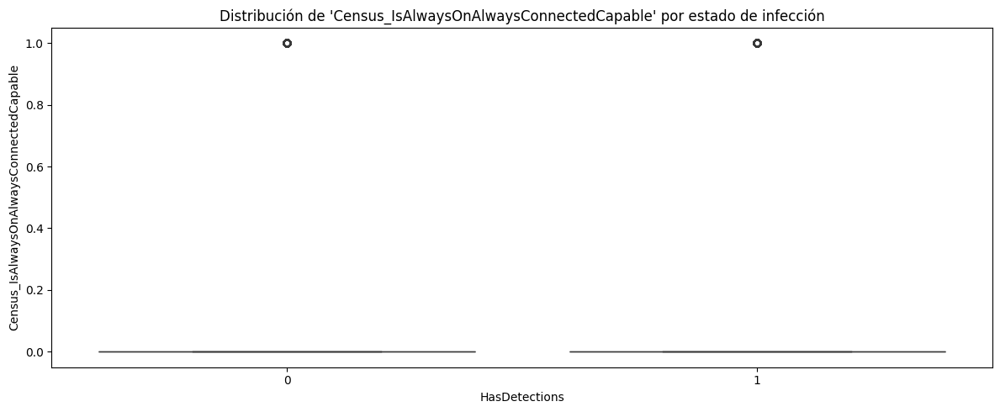

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


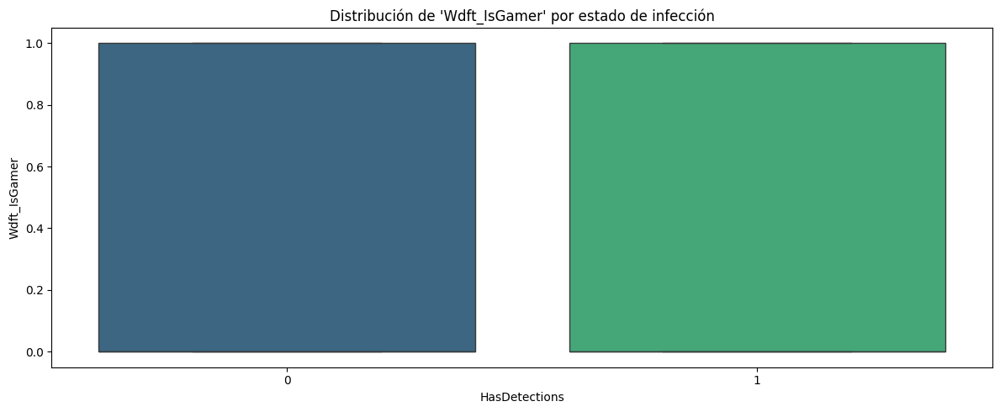

C:\Users\j\AppData\Local\Temp\ipykernel_21444\3686446072.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')


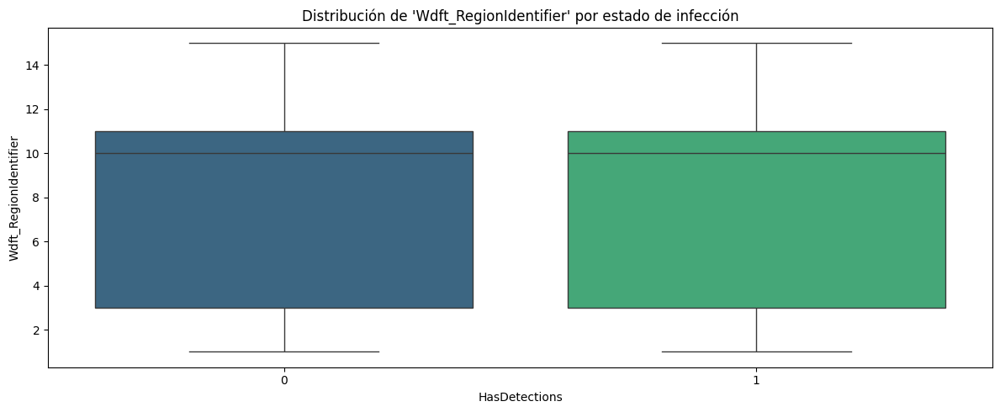

In [ ]:
for col in df_inicial_2.columns:
    # Saltamos identificadores y el target
    if col in ['MachineIdentifier', 'HasDetections', 'Unnamed: 0', 'n_nulos']:
        continue
        
    plt.figure(figsize=(12, 5))
    
    if col in cols_categoricas:
        # Para categóricas: Top 15 valores más frecuentes para no saturar el eje X
        top_values = df_inicial_2[col].value_counts().nlargest(15).index
        df_plot = df_inicial_2[df_inicial_2[col].isin(top_values)]
        
        sns.countplot(data=df_plot, x=col, hue='HasDetections', palette='viridis')
        plt.title(f"Top 15 categorías en '{col}' vs HasDetections")
        plt.xticks(rotation=45)
        
    elif col in cols_numericas:
        sns.boxplot(data=df_inicial_2, x='HasDetections', y=col, palette='viridis')
        plt.title(f"Distribución de '{col}' por estado de infección")

    plt.tight_layout()
    plt.show()

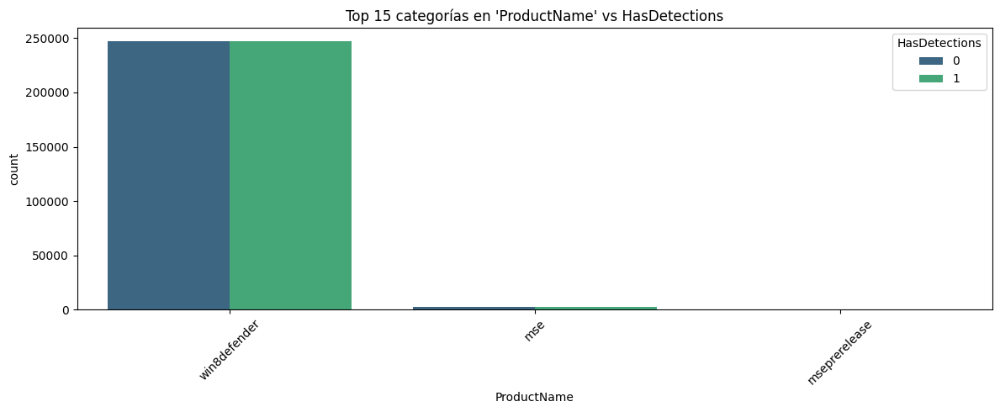

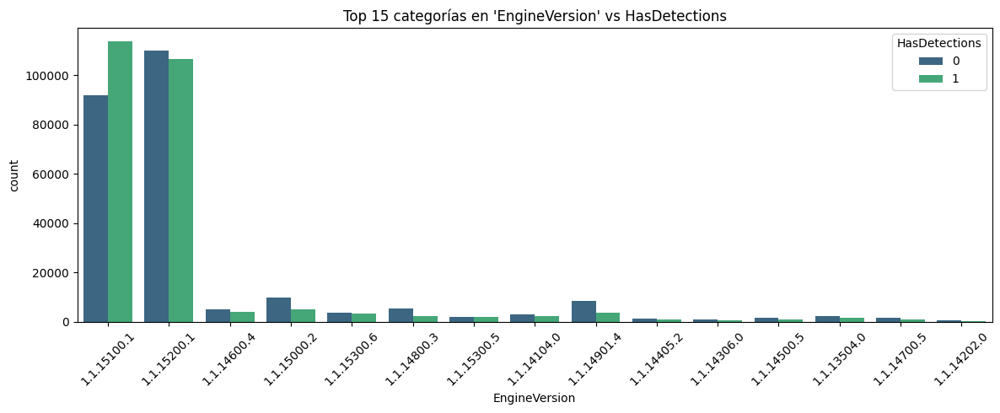

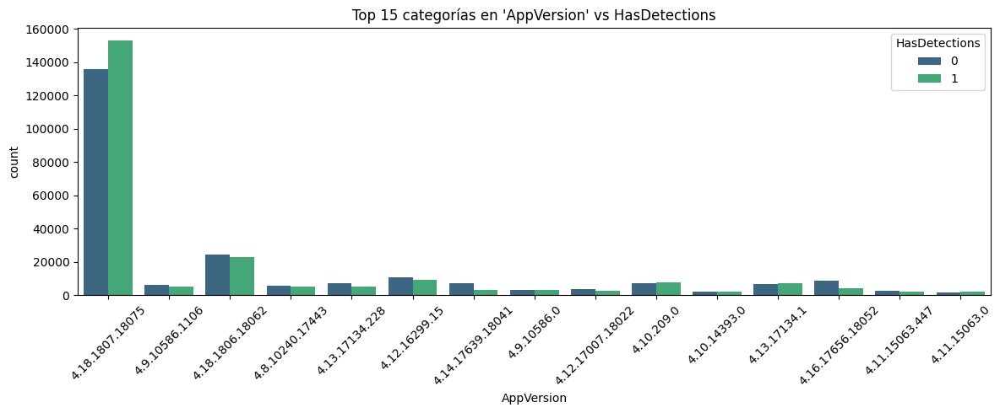

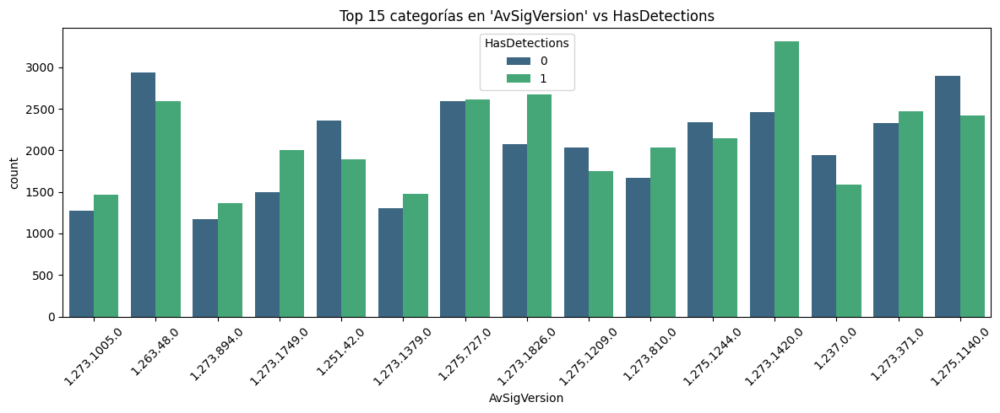

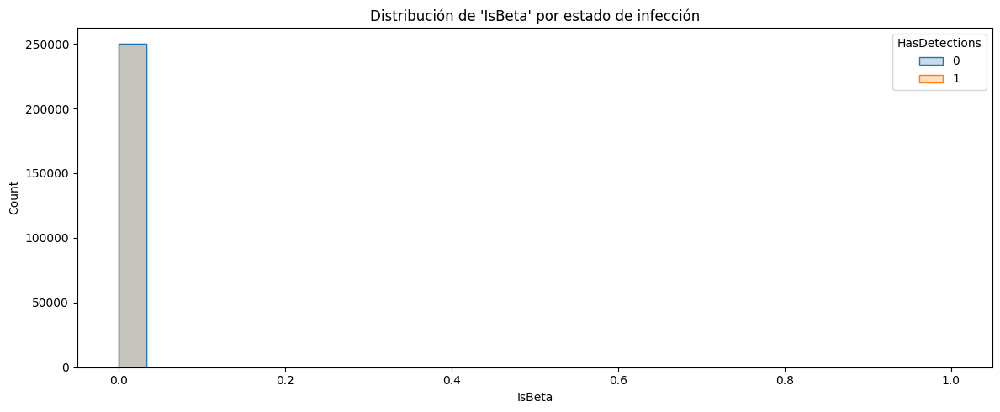

...

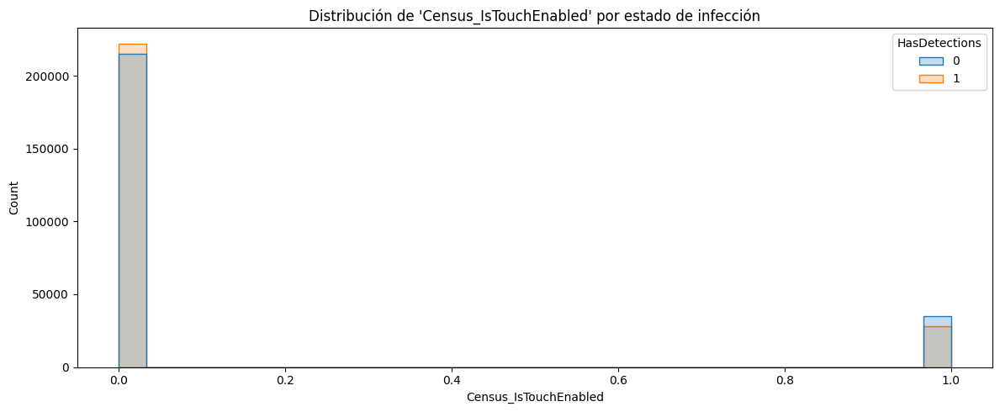

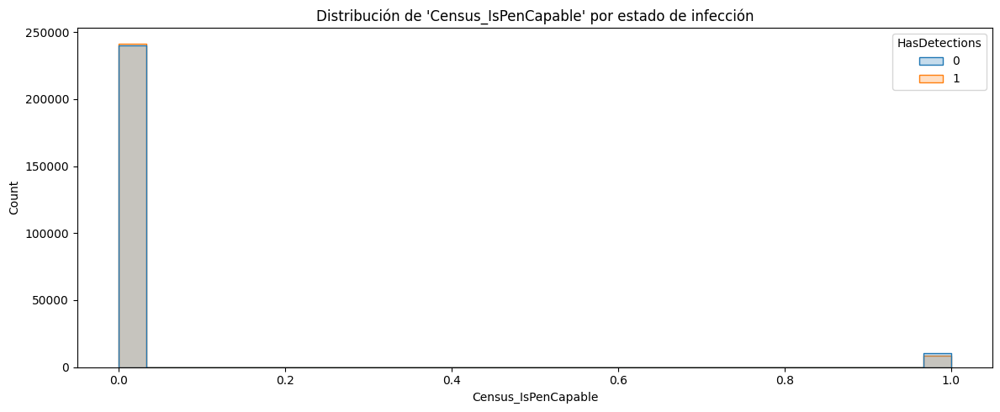

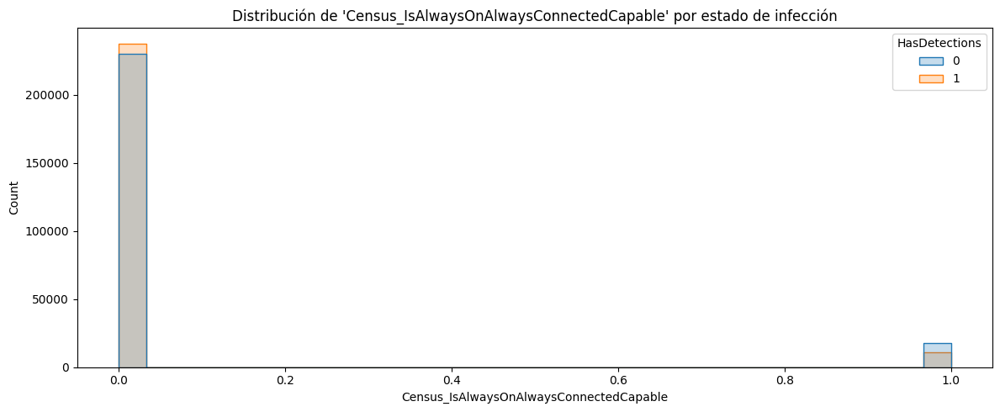

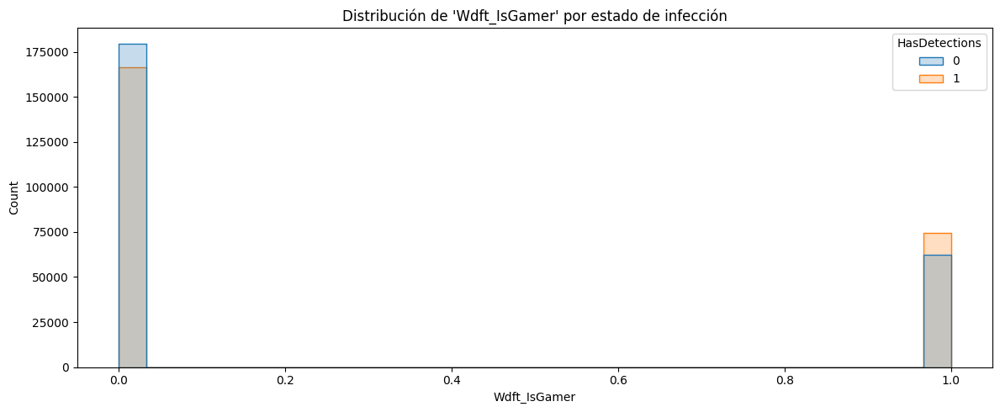

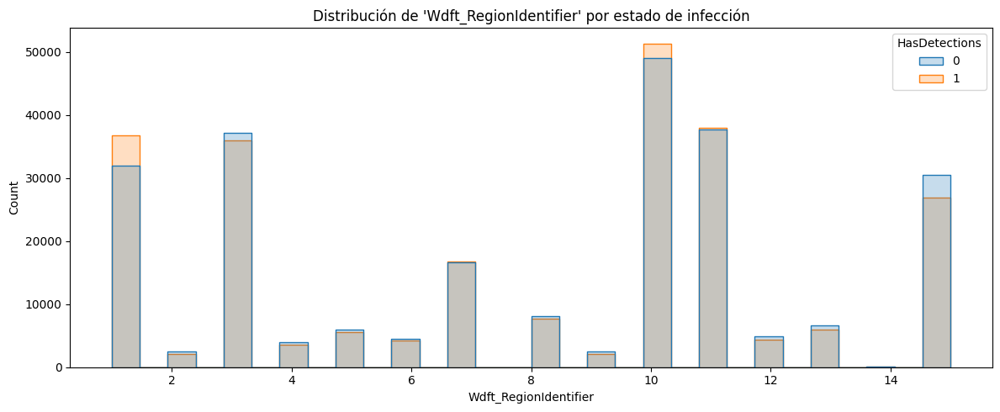

In [ ]:
for col in df_inicial_2.columns:
    # Saltamos identificadores y el target
    if col in ['MachineIdentifier', 'HasDetections', 'Unnamed: 0', 'n_nulos']:
        continue
        
    plt.figure(figsize=(12, 5))
    
    if col in cols_categoricas:
        # Para categóricas: Top 15 valores más frecuentes para no saturar el eje X
        top_values = df_inicial_2[col].value_counts().nlargest(15).index
        df_plot = df_inicial_2[df_inicial_2[col].isin(top_values)]
        
        sns.countplot(data=df_plot, x=col, hue='HasDetections', palette='viridis')
        plt.title(f"Top 15 categorías en '{col}' vs HasDetections")
        plt.xticks(rotation=45)
        
    elif col in cols_numericas:
        # Para numéricas: Un histograma con KDE es más útil que un scatter contra un target binario
        sns.histplot(data=df_inicial_2, x=col, hue='HasDetections', kde=False, bins=30, element="step")
        plt.title(f"Distribución de '{col}' por estado de infección")

    plt.tight_layout()
    plt.show()

(!) Columna 'AVProductStatesIdentifier' añadida a cols_with_outliers por posible sesgo/outliers.
(!) Columna 'AVProductsInstalled' añadida a cols_with_outliers por posible sesgo/outliers.
(!) Columna 'OrganizationIdentifier' añadida a cols_with_outliers por posible sesgo/outliers.
(!) Columna 'LocaleEnglishNameIdentifier' añadida a cols_with_outliers por posible sesgo/outliers.
(!) Columna 'OsSuite' añadida a cols_with_outliers por posible sesgo/outliers.
(!) Columna 'Census_ProcessorManufacturerIdentifier' añadida a cols_with_outliers por posible sesgo/outliers.
(!) Columna 'Census_SystemVolumeTotalCapacity' añadida a cols_with_outliers por posible sesgo/outliers.
(!) Columna 'Census_TotalPhysicalRAM' añadida a cols_with_outliers por posible sesgo/outliers.
(!) Columna 'Census_InternalPrimaryDisplayResolutionHorizontal' añadida a cols_with_outliers por posible sesgo/outliers.
(!) Columna 'Census_InternalPrimaryDisplayResolutionVertical' añadida a cols_with_outliers por posible sesgo/o

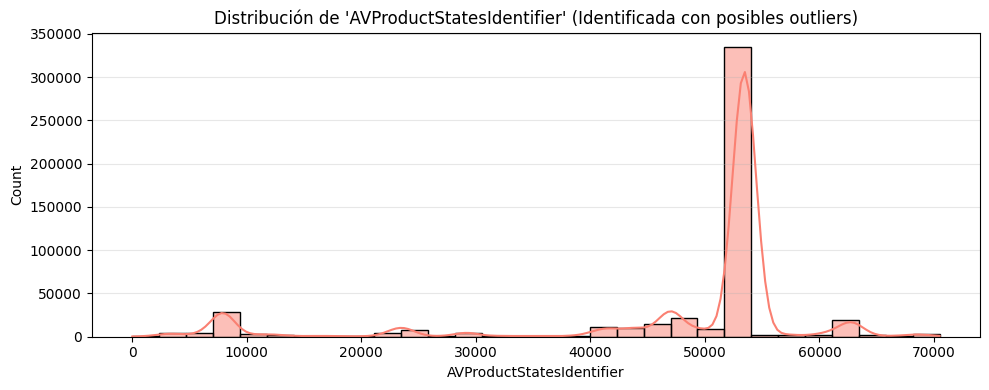

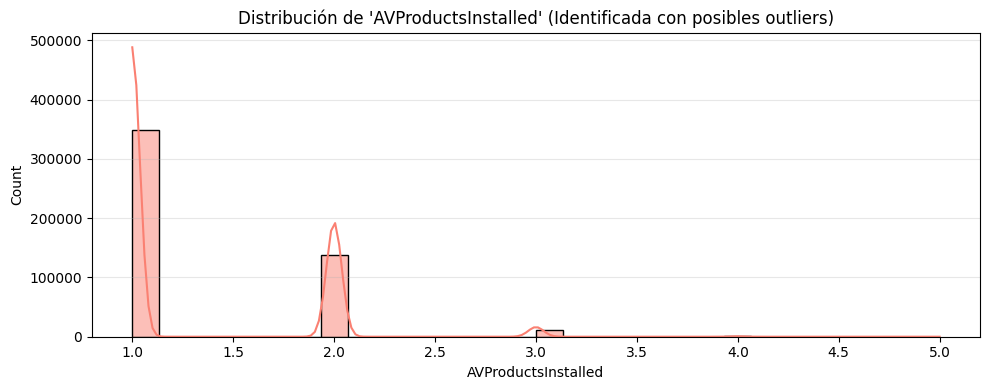

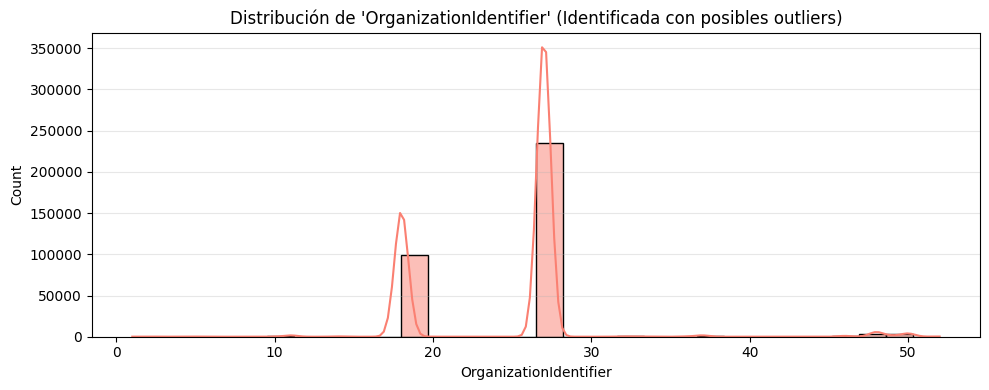

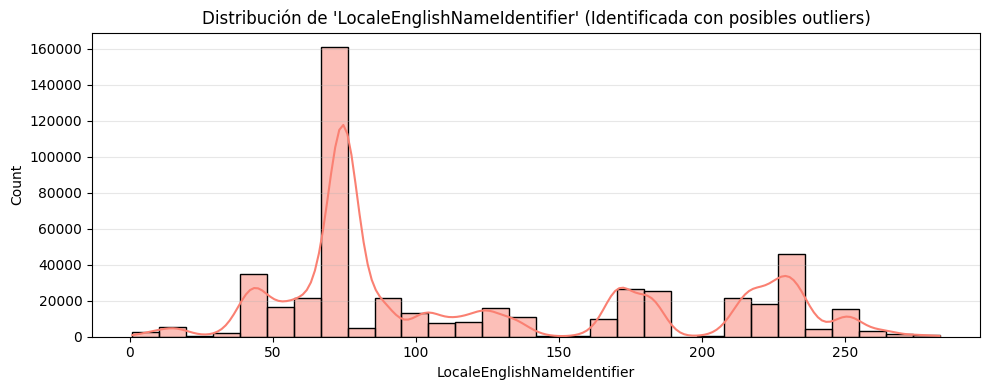

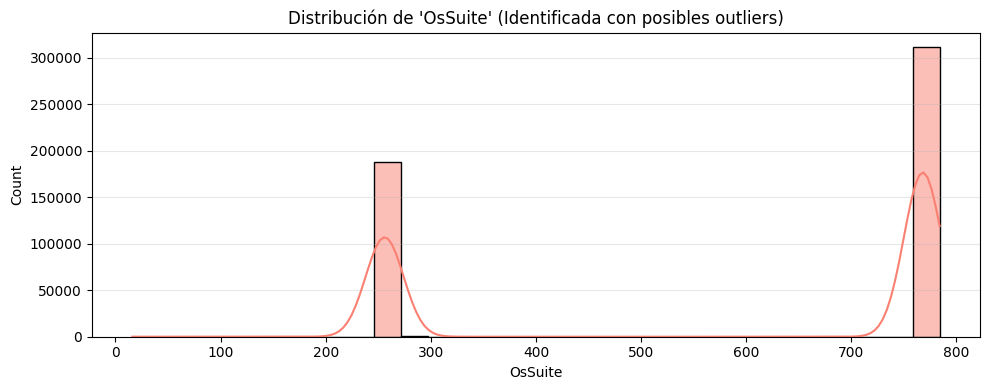

...

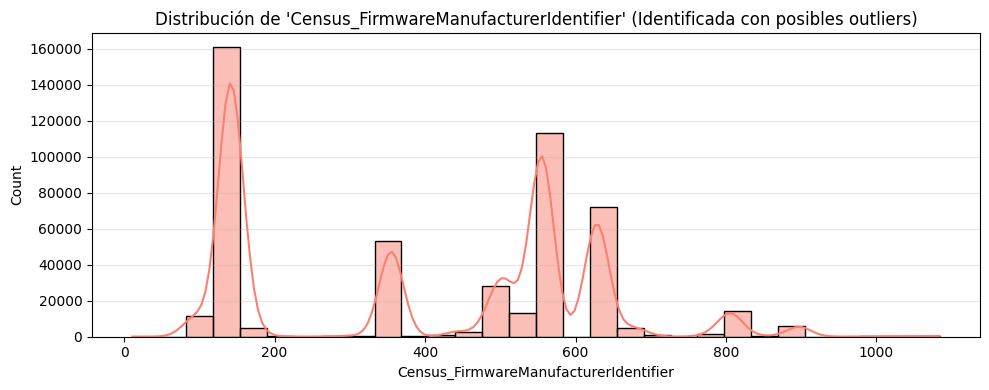

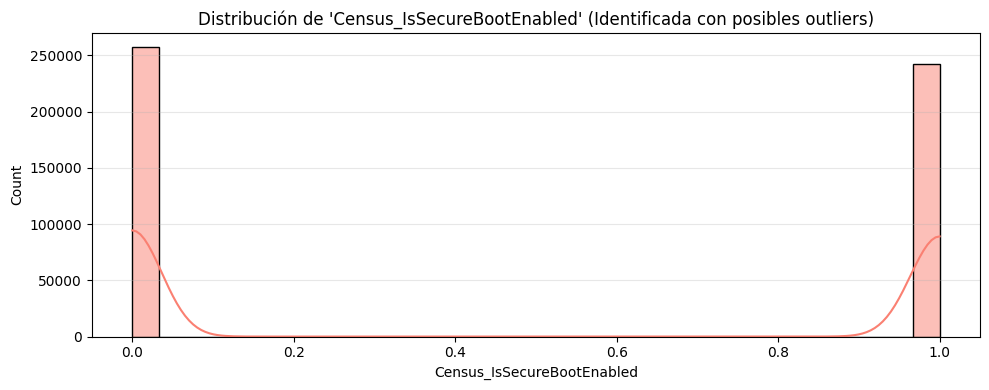

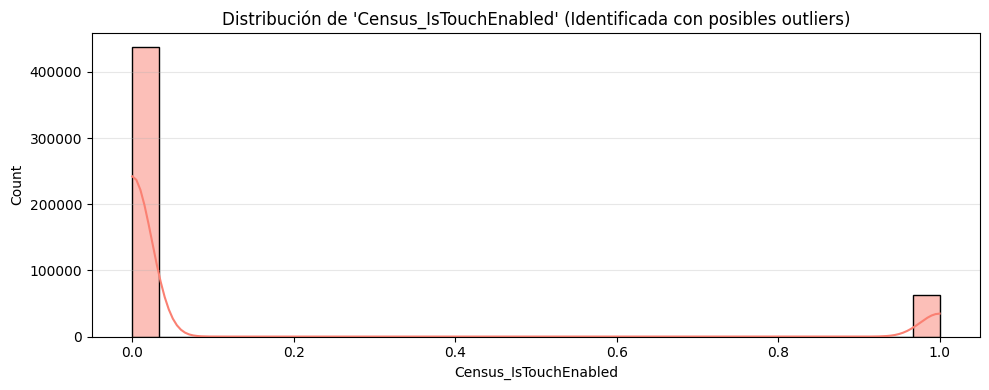

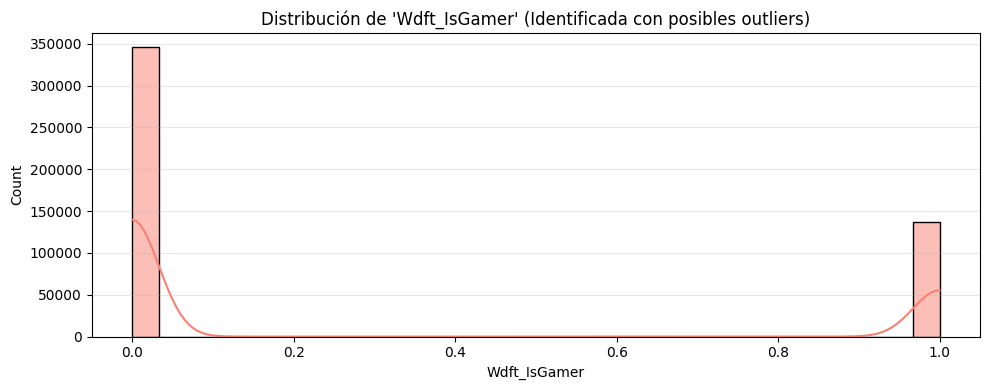

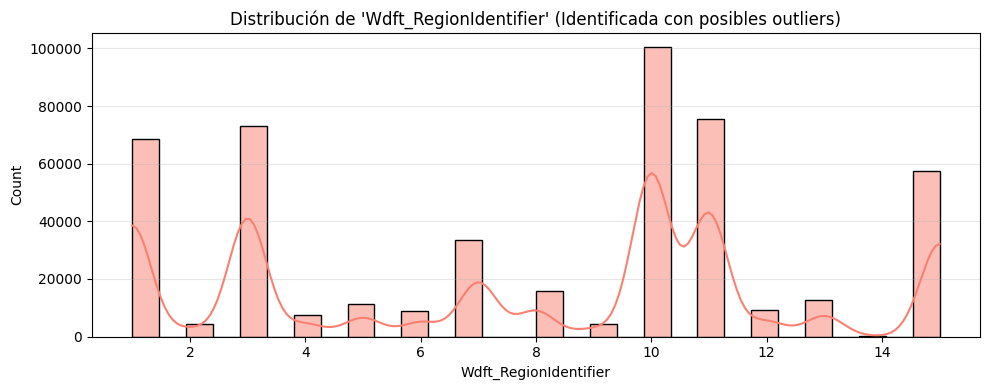

In [ ]:
# Inicializamos la lista para guardar columnas con posibles outliers
cols_with_outliers = []

for col in df_inicial_2.columns:
    # Saltamos identificadores y el target
    if col in ['MachineIdentifier', 'HasDetections', 'Unnamed: 0', 'n_nulos']:
        continue
    
    if col in cols_categoricas:
        # print(f'Distintos valores en {col}')
        # display(df_inicial_2[col].value_counts())
        Null = df_inicial_2[col].value_counts()
        
    elif col in cols_numericas:
        # print(f'Rango de valores en {col}')
        stats = df_inicial_2[col].describe()
        # display(stats)
        
        # Lógica de detección: diferencia entre media y mediana > 0.35 * std
        mean = stats['mean']
        median = stats['50%'] # El percentil 50 es la mediana
        std = stats['std']
        
        if abs(mean - median) > 0.35 * std:
            print(f"(!) Columna '{col}' añadida a cols_with_outliers por posible sesgo/outliers.")
            cols_with_outliers.append(col)

# Finalmente, creamos los histogramas para las columnas detectadas
print(f"\n--- Visualización de columnas con outliers ({len(cols_with_outliers)} detectadas) ---")

for col in cols_with_outliers:
    plt.figure(figsize=(10, 4))
    sns.histplot(data=df_inicial_2, x=col, kde=True, bins=30, color='salmon')
    plt.title(f"Distribución de '{col}' (Identificada con posibles outliers)")
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

| Grupo | Columna | Significado | Tipo Real|
| --- | --- | --- | --- | 
| Protección | EngineVersion / AppVersion | Versión del motor y la app de Windows Defender. Crucial para ver si el malware ataca versiones viejas. | Categórica (Jerárquica)|
|Protección | IsProtected | Si hay un antivirus activo y actualizado. | Binaria|
|Protección | SmartScreen | Estado del filtro SmartScreen (bloquea webs/archivos sospechosos). Es un gran predictor. | Categórica|
|Hardware | Census_MDC2FormFactor | "Tipo de dispositivo (Notebook, Desktop, Detachable)." | Categórica|
|Hardware | Census_TotalPhysicalRAM | Memoria RAM total. Los outliers aquí suelen ser servidores o PCs gaming. | Numérica|
|Hardware | Census_PrimaryDiskTotalCapacity | Capacidad del disco duro. | Numérica |
| Software | OsBuild / OsVer | Versión específica de la compilación de Windows. | Categórica / Ordinal |
| Software | Census_OSInstallTypeName | "Cómo se instaló Windows (Update, Clean, OEM)." | Categórica |
| Localización | CountryIdentifier / Wdft_RegionIdentifier | ID numérico del país o región. No operar matemáticamente con ellos. | Categórica (ID) |

In [13]:
import pandas as pd

def get_high_corr_cols(df, target_col, umbral_corr):
    df_proc = df.copy()
    for col in df_proc.select_dtypes(include=['object', 'category']).columns:
        df_proc[col] = df_proc[col].astype('category').cat.codes
    
    matrix = df_proc.corr()
    target_corrs = matrix[target_col].abs()
    
    return target_corrs[target_corrs > umbral_corr].drop(labels=[target_col]).index.tolist()

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder

# 1. Preparación rápida (solo para ver importancia)
df_temp = df_inicial_2.copy().fillna(-1) # Relleno rápido

df_temp.drop(columns=get_high_corr_cols(df_temp, 'HasDetections', 0.95), inplace=True)

for col in df_temp.select_dtypes(include=['object']).columns:
    df_temp[col] = LabelEncoder().fit_transform(df_temp[col].astype(str))

# 2. Entrenamos un modelo rápido
X_quick = df_temp.drop(columns=['HasDetections', 'MachineIdentifier', 'Unnamed: 0'])
y_quick = df_temp['HasDetections']

model = RandomForestClassifier(
    n_estimators=100,
    min_samples_leaf=20,  # Evita overfitting a ruido
    max_depth=None,       # Deja crecer el árbol (controlado por min_samples_leaf)
    oob_score=True,       # Validación interna gratuita
    n_jobs=-1,
    random_state=42
)
model.fit(X_quick, y_quick)

# 3. Extraemos importancia
importancias = pd.Series(model.feature_importances_, index=X_quick.columns).sort_values(ascending=False)
print("Top 15 variables sugeridas por el modelo:")
print(importancias.head(15))

Top 15 variables sugeridas por el modelo:
SmartScreen                                          0.191331
AVProductStatesIdentifier                            0.126569
AVProductsInstalled                                  0.114509
AvSigVersion                                         0.063124
EngineVersion                                        0.053082
Census_TotalPhysicalRAM                              0.031243
AppVersion                                           0.025599
Census_InternalPrimaryDiagonalDisplaySizeInInches    0.023923
Census_OSInstallTypeName                             0.016724
Wdft_IsGamer                                         0.014623
Census_IsAlwaysOnAlwaysConnectedCapable              0.014466
Census_PrimaryDiskTotalCapacity                      0.013864
Processor                                            0.013731
Census_SystemVolumeTotalCapacity                     0.013147
Census_IsWIMBootEnabled                              0.012653
dtype: float64


Eliminando 2 columnas correlacionadas: ['Census_OSUILocaleIdentifier', 'Census_IsWIMBootEnabled']


C:\Users\j\AppData\Local\Temp\ipykernel_34972\2769288136.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance_Mean', y='Feature', data=top_20, palette='viridis')


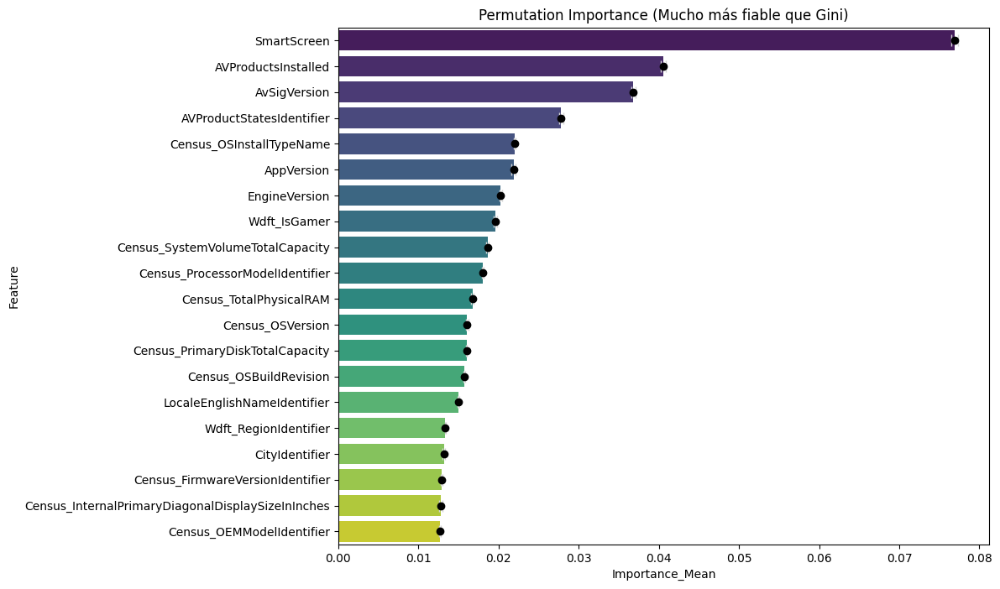

In [ ]:
from sklearn.inspection import permutation_importance

df_temp = df_inicial.copy().fillna(-1)

# 1. ELIMINACIÓN DE CORRELACIONES ALTAS (Tu idea)
# -------------------------------------------------------
# Calculamos matriz de correlación (solo numéricas para ir rápido)
corr_matrix = df_temp.select_dtypes(include=[np.number]).corr().abs()

# Seleccionamos el triángulo superior de la matriz
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Buscamos columnas con correlación > 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
print(f"Eliminando {len(to_drop)} columnas correlacionadas: {to_drop}")

X_filtered = X_quick.drop(columns=to_drop)

# 2. MODELO MÁS ROBUSTO
# -------------------------------------------------------
# Aumentamos estimadores y profundidad para que 'aprenda' de verdad antes de evaluar
rf_robust = RandomForestClassifier(
    n_estimators=100,
    min_samples_leaf=20,  # Evita overfitting a ruido
    max_depth=None,       # Deja crecer el árbol (controlado por min_samples_leaf)
    oob_score=True,       # Validación interna gratuita
    n_jobs=-1,
    random_state=42
)

rf_robust.fit(X_filtered, y_quick)

# 3. PERMUTATION IMPORTANCE (La clave de la fiabilidad)
# -------------------------------------------------------
# Esto tarda más, pero es la verdad. Mide la caída de precisión al romper la variable.
result = permutation_importance(
    rf_robust, X_filtered, y_quick,
    n_repeats=5,          # Repite 5 veces para tener media y desviación
    random_state=42,
    n_jobs=-1
)

# Creamos un DF con los resultados
perm_importance = pd.DataFrame({
    'Feature': X_filtered.columns,
    'Importance_Mean': result.importances_mean,
    'Importance_Std': result.importances_std
}).sort_values(by='Importance_Mean', ascending=False)

# Visualización con barras de error (para ver estabilidad)
plt.figure(figsize=(10, 8))
# Mostramos solo las top 20
top_20 = perm_importance.head(20)
plt.errorbar(
    x=top_20['Importance_Mean'], 
    y=top_20['Feature'], 
    xerr=top_20['Importance_Std'], 
    fmt='o', color='black', ecolor='lightgray', capsize=5
)
sns.barplot(x='Importance_Mean', y='Feature', data=top_20, palette='viridis');
plt.title("Permutation Importance (Mucho más fiable que Gini)");
plt.show();

top_features = perm_importance.Feature.head(20).tolist()
print("Top 20 features seleccionadas por Permutation Importance:")
print(top_features)

In [230]:
top_features = perm_importance.Feature.head(20).tolist()

In [236]:
df_tests = df_inicial[top_features + ['HasDetections']].copy()
print(get_high_corr_cols(df_tests, 'HasDetections', 0.10))

['AVProductsInstalled', 'AVProductStatesIdentifier']


In [6]:
def get_high_corr_cols_exclusion(df, target_col, umbral_corr):
    df_temp = df.drop(columns=[target_col])
    
    for col in df_temp.select_dtypes(include=['object', 'category']).columns:
        df_temp[col] = df_temp[col].astype('category').cat.codes
        
    corr_matrix = df_temp.corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    
    return [column for column in upper.columns if any(upper[column] > umbral_corr)]

In [10]:
def get_high_corr_cols_exclusion_pairs(df, target_col, umbral_corr):
    df_temp = df.drop(columns=[target_col])
    
    for col in df_temp.select_dtypes(include=['object', 'category']).columns:
        df_temp[col] = df_temp[col].astype('category').cat.codes
        
    corr_matrix = df_temp.corr().abs()
    cols = corr_matrix.columns
    pairs = []
    
    for i in range(len(cols)):
        for j in range(i + 1, len(cols)):
            if corr_matrix.iloc[i, j] > umbral_corr:
                pairs.append((cols[i], cols[j]))
                
    return pairs

In [265]:
print(get_high_corr_cols_exclusion(df_tests, 'HasDetections', 0.95))
print(get_high_corr_cols_exclusion_pairs(df_tests, 'HasDetections', 0.95))

['EngineVersion']
[('AvSigVersion', 'EngineVersion')]


In [266]:
print(get_high_corr_cols_exclusion(df_inicial, 'HasDetections', 0.95))
print(get_high_corr_cols_exclusion_pairs(df_inicial, 'HasDetections', 0.95))

['MachineIdentifier', 'AvSigVersion', 'OsVer', 'Census_OSArchitecture', 'Census_OSBuildNumber', 'Census_OSSkuName', 'Census_OSUILocaleIdentifier']
[('Unnamed: 0', 'MachineIdentifier'), ('EngineVersion', 'AvSigVersion'), ('Platform', 'OsVer'), ('Processor', 'Census_OSArchitecture'), ('OsSuite', 'Census_OSSkuName'), ('Census_OSVersion', 'Census_OSBuildNumber'), ('Census_OSEdition', 'Census_OSSkuName'), ('Census_OSInstallLanguageIdentifier', 'Census_OSUILocaleIdentifier')]


In [ ]:
for col_prueba in df_tests.select_dtypes(include=['object', 'category']).columns:
    # Calculamos el % de infecciones por categoría
    analisis = df_tests.groupby(col_prueba)['HasDetections'].agg(['mean', 'count'])

    # Filtramos categorías con pocos datos para ver la tendencia real
    analisis = analisis[analisis['count'] > 1000].sort_values(by='mean', ascending=False)

    print(f"Probabilidad de infección según {col_prueba}:")
    print(analisis)
    print("\n")

Probabilidad de infección según SmartScreen:
                  mean   count
SmartScreen                   
ExistsNotSet  0.805426   58497
Warn          0.571846    7530
Block         0.502355    1274
Off           0.486619   10388
Prompt        0.475897    1950
RequireAdmin  0.438297  241594


Probabilidad de infección según AvSigVersion:
                  mean  count
AvSigVersion                 
1.273.1527.0  0.702885   2218
1.273.1574.0  0.600258   1551
1.273.1735.0  0.589372   1035
1.273.1795.0  0.581503   1730
1.273.1420.0  0.574077   5771
...                ...    ...
1.237.0.0     0.449915   3534
1.275.1120.0  0.448927   1165
1.251.42.0    0.444810   4258
1.277.25.0    0.443450   1229
1.273.212.0   0.433892   1074

[91 rows x 2 columns]


Probabilidad de infección según Census_OSInstallTypeName:
                              mean   count
Census_OSInstallTypeName                  
UUPUpgrade                0.525473  146780
Clean                     0.523037    3885
IBSClean      

In [257]:
print(get_high_corr_cols_exclusion(df_inicial, 'HasDetections', 0.95))

['MachineIdentifier', 'AvSigVersion', 'OsVer', 'Census_OSArchitecture', 'Census_OSBuildNumber', 'Census_OSSkuName', 'Census_OSUILocaleIdentifier']


Muestreando 100000 filas para selección rápida de variables...
Eliminando 6 columnas correlacionadas: ['OsVer', 'Census_OSArchitecture', 'Census_OSBuildNumber', 'Census_OSSkuName', 'Census_OSUILocaleIdentifier', 'Census_IsWIMBootEnabled']


C:\Users\j\AppData\Local\Temp\ipykernel_32728\829577739.py:108: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance_Mean', y='Feature', data=top_20, palette='viridis');


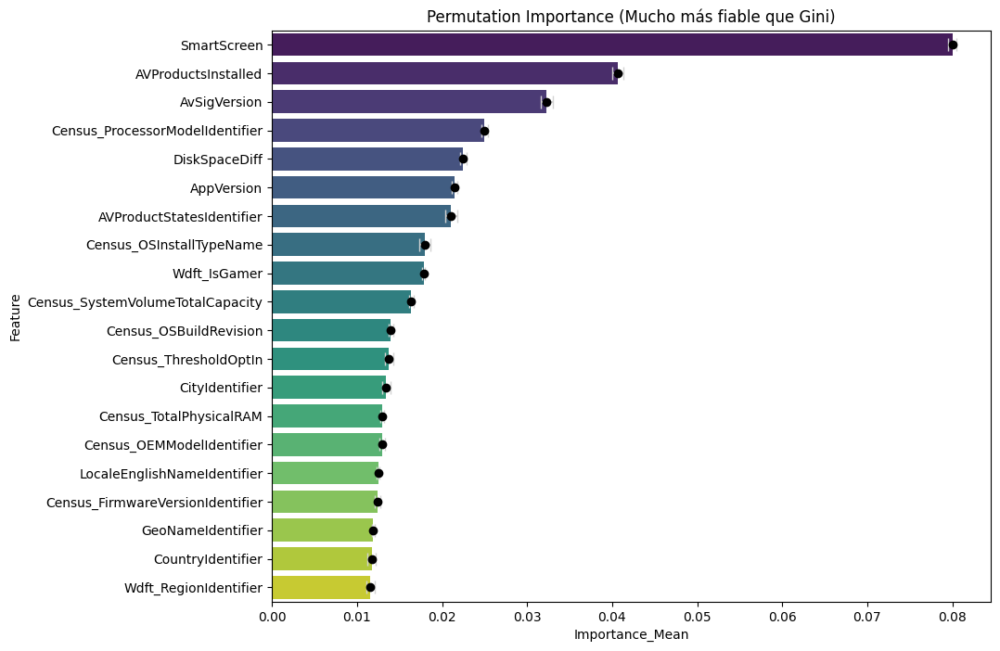

Top 20 features seleccionadas por Permutation Importance:
['SmartScreen', 'AVProductsInstalled', 'AvSigVersion', 'Census_ProcessorModelIdentifier', 'DiskSpaceDiff', 'AppVersion', 'AVProductStatesIdentifier', 'Census_OSInstallTypeName', 'Wdft_IsGamer', 'Census_SystemVolumeTotalCapacity', 'Census_OSBuildRevision', 'Census_ThresholdOptIn', 'CityIdentifier', 'Census_TotalPhysicalRAM', 'Census_OEMModelIdentifier', 'LocaleEnglishNameIdentifier', 'Census_FirmwareVersionIdentifier', 'GeoNameIdentifier', 'CountryIdentifier', 'Wdft_RegionIdentifier']


In [37]:
SAMPLE_SIZE = 100000 # Máximas filas para la prueba

if len(df_inicial) > SAMPLE_SIZE:
    print(f"Muestreando {SAMPLE_SIZE} filas para selección rápida de variables...")
    df_temp = df_inicial.sample(n=SAMPLE_SIZE, random_state=42).copy()
else:
    df_temp = df_inicial.copy()

# Limpieza básica inicial
df_temp = df_temp.drop(columns=['MachineIdentifier', 'Unnamed: 0', 'EngineVersion'], errors='ignore').fillna(-1)


# --- INGENIERÍA DE VARIABLES PRE-MUESTREO ---

# 1. Crear el segmento combinado (Fabricante + Núcleos)
df_temp['CPU_Architecture_Segment'] = (
    df_temp['Census_ProcessorManufacturerIdentifier'].astype(str) + 
    "_" + 
    df_temp['Census_ProcessorCoreCount'].astype(str)
).astype('category') # Forzamos a category para ahorrar memoria

# 2. Limpiar el ModelIdentifier (Agrupando raros en -1)
counts = df_temp['Census_ProcessorModelIdentifier'].value_counts()
rare_models = counts[counts < 100].index
df_temp['Census_ProcessorModelIdentifier'] = df_temp['Census_ProcessorModelIdentifier'].replace(rare_models, -1)

# 3. DiskSpaceDiff
df_temp['DiskSpaceDiff'] = df_temp['Census_PrimaryDiskTotalCapacity'] - df_temp['Census_SystemVolumeTotalCapacity']

# 4. Encoding Versions
unique_versions = df_temp['Census_OSVersion'].unique()
mapping = {v: int(v.split('.')[2][:3]) for v in unique_versions if pd.notnull(v)}
df_temp['Census_OSVersion'] = df_temp['Census_OSVersion'].map(mapping)

unique_versions = df_temp['AppVersion'].unique()
mapping = {}
for v in unique_versions:
    if pd.notnull(v):
        parts = v.split('.')
        code_str = parts[1] + parts[2][:3]
        mapping[v] = int(code_str)
df_temp['AppVersion'] = df_temp['AppVersion'].map(mapping)

unique_versions = df_temp['AvSigVersion'].unique()
mapping = {v: int(v.split('.')[1][:3]) for v in unique_versions if pd.notnull(v)}
df_temp['AvSigVersion'] = df_temp['AvSigVersion'].map(mapping)

# 5. Pixels Per Inch (PPI)
df_temp['Census_PPI'] = (df_temp['Census_InternalPrimaryDisplayResolutionHorizontal'] * df_temp['Census_InternalPrimaryDisplayResolutionVertical']) / (df_temp['Census_InternalPrimaryDiagonalDisplaySizeInInches'])

# 6. RAM per Core
df_temp['RAM_per_Core'] = df_temp['Census_TotalPhysicalRAM'] / df_temp['Census_ProcessorCoreCount']

# 1. ELIMINACIÓN DE CORRELACIONES ALTAS
# -------------------------------------------------------
# Buscamos columnas con correlación > 0.95
to_drop = get_high_corr_cols_exclusion(df_temp, 'HasDetections', 0.95)
print(f"Eliminando {len(to_drop)} columnas correlacionadas: {to_drop}")

X_filtered = df_temp.drop(columns=['HasDetections'] + to_drop)
y_quick = df_temp['HasDetections']

# Preparación categóricas
for col in X_filtered.select_dtypes(include=['object', 'category']).columns:
        X_filtered[col] = X_filtered[col].astype('category').cat.codes

# 2. MODELO MÁS ROBUSTO
# -------------------------------------------------------
# Aumentamos estimadores y profundidad para que 'aprenda' de verdad antes de evaluar
rf_robust = RandomForestClassifier(
    n_estimators=100,
    min_samples_leaf=20,  # Evita overfitting a ruido
    max_depth=None,       # Deja crecer el árbol (controlado por min_samples_leaf)
    oob_score=True,       # Validación interna gratuita
    n_jobs=-1,
    random_state=42
)

rf_robust.fit(X_filtered, y_quick)

# 3. PERMUTATION IMPORTANCE (La clave de la fiabilidad)
# -------------------------------------------------------
# Esto tarda más, pero es la verdad. Mide la caída de precisión al romper la variable.
result = permutation_importance(
    rf_robust, X_filtered, y_quick,
    n_repeats=5,          # Repite 5 veces para tener media y desviación
    random_state=42,
    n_jobs=-1
)

# Creamos un DF con los resultados
perm_importance = pd.DataFrame({
    'Feature': X_filtered.columns,
    'Importance_Mean': result.importances_mean,
    'Importance_Std': result.importances_std
}).sort_values(by='Importance_Mean', ascending=False)

# Visualización con barras de error (para ver estabilidad)
plt.figure(figsize=(10, 8))
# Mostramos solo las top 20
top_20 = perm_importance.head(20)
plt.errorbar(
    x=top_20['Importance_Mean'], 
    y=top_20['Feature'], 
    xerr=top_20['Importance_Std'], 
    fmt='o', color='black', ecolor='lightgray', capsize=5
)
sns.barplot(x='Importance_Mean', y='Feature', data=top_20, palette='viridis');
plt.title("Permutation Importance (Mucho más fiable que Gini)");
plt.show();

top_features = perm_importance.Feature.head(20).tolist()
print("Top 20 features seleccionadas por Permutation Importance:")
print(top_features)

In [38]:
X_filtered.columns

Index(['ProductName', 'AppVersion', 'AvSigVersion', 'IsBeta',
       'RtpStateBitfield', 'IsSxsPassiveMode', 'DefaultBrowsersIdentifier',
       'AVProductStatesIdentifier', 'AVProductsInstalled', 'AVProductsEnabled',
       'HasTpm', 'CountryIdentifier', 'CityIdentifier',
       'OrganizationIdentifier', 'GeoNameIdentifier',
       'LocaleEnglishNameIdentifier', 'Platform', 'Processor', 'OsBuild',
       'OsSuite', 'OsPlatformSubRelease', 'OsBuildLab', 'SkuEdition',
       'IsProtected', 'AutoSampleOptIn', 'PuaMode', 'SMode', 'IeVerIdentifier',
       'SmartScreen', 'Firewall', 'UacLuaenable', 'Census_MDC2FormFactor',
       'Census_DeviceFamily', 'Census_OEMNameIdentifier',
       'Census_OEMModelIdentifier', 'Census_ProcessorCoreCount',
       'Census_ProcessorManufacturerIdentifier',
       'Census_ProcessorModelIdentifier', 'Census_ProcessorClass',
       'Census_PrimaryDiskTotalCapacity', 'Census_PrimaryDiskTypeName',
       'Census_SystemVolumeTotalCapacity', 'Census_HasOpticalD

In [ ]:
df_temp['Census_PPI'] = (df_temp['Census_InternalPrimaryDisplayResolutionHorizontal'] * df_temp['Census_InternalPrimaryDisplayResolutionVertical']) / (df_temp['Census_InternalPrimaryDiagonalDisplaySizeInInches'])

In [34]:
df_inicial[['Census_InternalPrimaryDisplayResolutionVertical', 'Census_InternalPrimaryDisplayResolutionHorizontal', 'Census_InternalPrimaryDiagonalDisplaySizeInInches']].isnull().sum()

Census_InternalPrimaryDisplayResolutionVertical      2650
Census_InternalPrimaryDisplayResolutionHorizontal    2650
Census_InternalPrimaryDiagonalDisplaySizeInInches    2654
dtype: int64

In [32]:
df_temp[['Census_PPI', 'Census_InternalPrimaryDisplayResolutionVertical', 'Census_InternalPrimaryDisplayResolutionHorizontal', 'Census_InternalPrimaryDiagonalDisplaySizeInInches']].isnull().sum()

Census_PPI                                           0
Census_InternalPrimaryDisplayResolutionVertical      0
Census_InternalPrimaryDisplayResolutionHorizontal    0
Census_InternalPrimaryDiagonalDisplaySizeInInches    0
dtype: int64

In [29]:
df_temp['RAM_per_Core'] = df_temp['Census_TotalPhysicalRAM'] / df_temp['Census_ProcessorCoreCount']

In [33]:
df_temp[['RAM_per_Core', 'Census_TotalPhysicalRAM', 'Census_ProcessorCoreCount']].isnull().sum()

RAM_per_Core                 0
Census_TotalPhysicalRAM      0
Census_ProcessorCoreCount    0
dtype: int64

In [27]:
top_20

,Feature,Importance_Mean,Importance_Std
29,SmartScreen,0.081202,0.000493
9,AVProductsInstalled,0.044564,0.000473
3,AvSigVersion,0.031034,0.000467
76,CPU_Model_Clean,0.023226,0.000248
77,DiskSpaceDiff,0.022562,0.000253
73,Wdft_IsGamer,0.019034,0.000289
8,AVProductStatesIdentifier,0.018840,0.000296
56,Census_OSInstallTypeName,0.017758,0.000431
38,Census_ProcessorModelIdentifier,0.016530,0.000348
2,AppVersion,0.015950,0.000168


In [14]:
df_tests = df_inicial[top_features + ['HasDetections']].copy()
print(get_high_corr_cols(df_tests, 'HasDetections', 0.10))
to_drop_again = get_high_corr_cols_exclusion(df_tests, 'HasDetections', 0.95)
print(to_drop_again)
print(get_high_corr_cols_exclusion_pairs(df_tests, 'HasDetections', 0.95))
df_pruned = df_tests.drop(columns=to_drop_again)
print(get_high_corr_cols_exclusion_pairs(df_pruned, 'HasDetections', 0.8))

['AVProductsInstalled', 'AVProductStatesIdentifier']
['EngineVersion']
[('AvSigVersion', 'EngineVersion')]
[]


In [291]:
print(df_pruned['AvSigVersion'].value_counts().sort_index(ascending=True))
print(df_pruned.groupby('AppVersion')['HasDetections'].agg(['mean', 'count']).sort_index(ascending=False))

AvSigVersion
0.0.0.0           4
1.169.55.0        1
1.199.1615.0      3
1.207.1891.0      1
1.207.2950.0      6
               ... 
1.277.51.0      411
1.277.58.0       76
1.277.62.0       80
1.277.64.0       60
1.277.67.0        7
Name: count, Length: 6455, dtype: int64
                     mean  count
AppVersion                      
4.9.218.0        0.446108    334
4.9.10586.965    0.372180    266
4.9.10586.962    0.412214    262
4.9.10586.916    0.411576    311
4.9.10586.873    0.421053    228
...                   ...    ...
4.10.14393.1593  0.518657    536
4.10.14393.1532  0.571429      7
4.10.14393.1198  0.513769   1271
4.10.14393.1066  0.475248    404
4.10.14393.0     0.530120   4399

[95 rows x 2 columns]


In [294]:
df_pruned['AvSigVersion'].str.split('.').str[1].str[0:2].value_counts().sort_index(ascending=True)

AvSigVersion
0          4
16         1
19         3
20         7
21         5
22       896
23      5539
24      2372
25      9678
26     34152
27    447343
Name: count, dtype: int64

In [ ]:
print(df_pruned['AppVersion'].str.split('.').str[1].value_counts().sort_index(ascending=True))
print(df_pruned['AppVersion'].str.split('.').str[2].str[:3].value_counts().sort_index(ascending=True))

AppVersion
10     25633
11     11458
12     30836
13     29076
14     13727
15         8
16     13189
17        22
18    337243
4         27
5        126
6         44
7         46
8      15309
9      23256
Name: count, dtype: int64
AppVersion
102     15009
105     22922
143     10292
150     11458
162     20197
170     10639
171     29073
176     26949
180    337243
204        96
205        95
207       204
209     15292
216        10
218       450
304        27
305        44
Name: count, dtype: int64


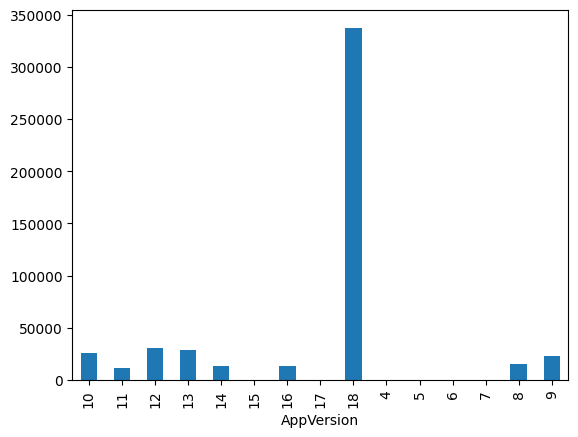

In [324]:
df_pruned['AppVersion'].str.split('.').str[1].value_counts().sort_index(ascending=True).plot(kind='bar');

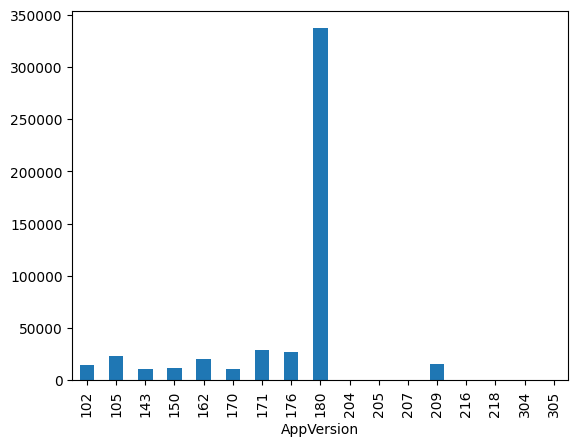

In [325]:
df_pruned['AppVersion'].str.split('.').str[2].str[:3].value_counts().sort_index(ascending=True).plot(kind='bar');

In [301]:
print(df_pruned['AppVersion'].value_counts().sort_index(ascending=True))
print(df_pruned.groupby('AppVersion')['HasDetections'].agg(['mean', 'count']).sort_index(ascending=False))

AppVersion
4.10.14393.0       4399
4.10.14393.1066     404
4.10.14393.1198    1271
4.10.14393.1532       7
4.10.14393.1593     536
                   ... 
4.9.10586.873       228
4.9.10586.916       311
4.9.10586.962       262
4.9.10586.965       266
4.9.218.0           334
Name: count, Length: 95, dtype: int64
                     mean  count
AppVersion                      
4.9.218.0        0.446108    334
4.9.10586.965    0.372180    266
4.9.10586.962    0.412214    262
4.9.10586.916    0.411576    311
4.9.10586.873    0.421053    228
...                   ...    ...
4.10.14393.1593  0.518657    536
4.10.14393.1532  0.571429      7
4.10.14393.1198  0.513769   1271
4.10.14393.1066  0.475248    404
4.10.14393.0     0.530120   4399

[95 rows x 2 columns]


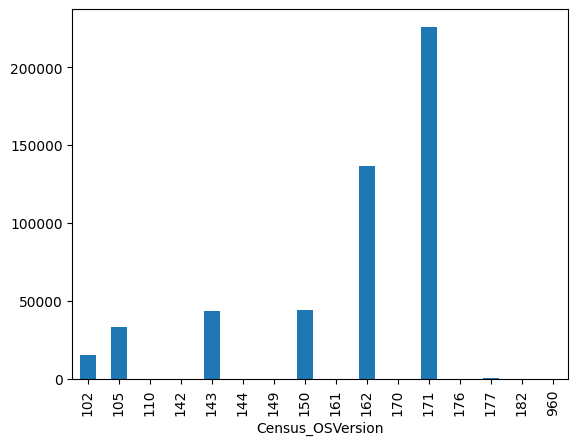

In [323]:
df_pruned['Census_OSVersion'].str.split('.').str[2].str[:3].value_counts().sort_index(ascending=True).plot(kind='bar');

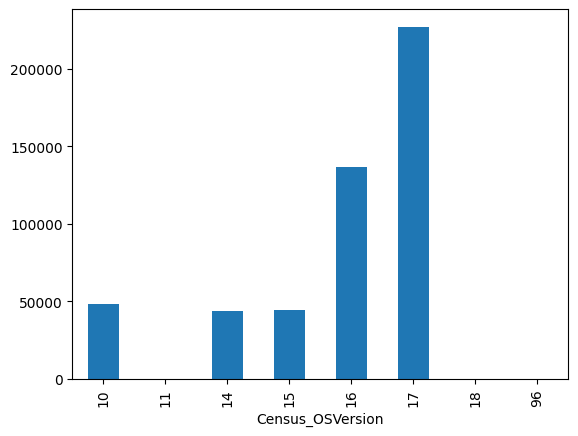

In [321]:
df_pruned['Census_OSVersion'].str.split('.').str[2].str[:2].value_counts().sort_index(ascending=True).plot(kind='bar');

In [302]:
print(df_pruned['Census_OSVersion'].value_counts().sort_index(ascending=True))
print(df_pruned.groupby('Census_OSVersion')['HasDetections'].agg(['mean', 'count']).sort_index(ascending=False))

Census_OSVersion
10.0.10240.16384    1499
10.0.10240.16387       2
10.0.10240.16389       2
10.0.10240.16393       2
10.0.10240.16394       3
                    ... 
10.0.18219.1000        1
10.0.18234.1000       14
10.0.18237.1000       14
10.0.18242.1000       13
6.3.9600.19069         1
Name: count, Length: 305, dtype: int64
                      mean  count
Census_OSVersion                 
6.3.9600.19069    0.000000      1
10.0.18242.1000   0.615385     13
10.0.18237.1000   0.428571     14
10.0.18234.1000   0.357143     14
10.0.18219.1000   1.000000      1
...                    ...    ...
10.0.10240.16394  0.000000      3
10.0.10240.16393  1.000000      2
10.0.10240.16389  0.500000      2
10.0.10240.16387  0.000000      2
10.0.10240.16384  0.476318   1499

[305 rows x 2 columns]


In [15]:
# 1. Extraer valores únicos
unique_versions = df_pruned['Census_OSVersion'].unique()
# 2. Crear un diccionario de mapeo solo para los únicos
mapping = {v: int(v.split('.')[2][:3]) for v in unique_versions if pd.notnull(v)}
# 3. Aplicar el mapeo al dataframe original (operación vectorizada)
df_pruned['Census_OSVersionEncoded'] = df_pruned['Census_OSVersion'].map(mapping)
# 4. Agrupar
print(df_pruned.groupby('Census_OSVersionEncoded')['HasDetections'].agg(['mean', 'count']).sort_index(ascending=False))

                             mean   count
Census_OSVersionEncoded                  
960                      0.000000       1
182                      0.465116      43
177                      0.433492     842
176                      0.450382     262
171                      0.522159  226000
170                      0.333333       3
162                      0.489701  136573
161                      0.000000       1
150                      0.479634   44265
149                      1.000000       5
144                      0.000000       1
143                      0.464980   43703
142                      1.000000       1
110                      0.000000       1
105                      0.471786   33193
102                      0.486098   15106


In [16]:
# 1. Extraer valores únicos
unique_versions = df_pruned['AppVersion'].unique()
# 2. Crear un diccionario de mapeo solo para los únicos
mapping = {}
for v in unique_versions:
    if pd.notnull(v):
        parts = v.split('.')
        # Concatenamos el segundo bloque con los dos primeros dígitos del tercero
        code_str = parts[1] + parts[2][:3]
        mapping[v] = int(code_str)
# 3. Aplicar el mapeo al dataframe original (operación vectorizada)
df_pruned['AppVersionEncoded'] = df_pruned['AppVersion'].map(mapping)
# 4. Agrupar
print(df_pruned.groupby('AppVersionEncoded')['HasDetections'].agg(['mean', 'count']).sort_index(ascending=False))

                       mean   count
AppVersionEncoded                  
18180              0.523270  337243
17176              0.227273      22
16176              0.326863   13189
15176              0.250000       8
14176              0.313907   13727
13176              0.666667       3
13171              0.480515   29073
12170              0.443181   10639
12162              0.455860   20197
11150              0.492320   11458
10209              0.508174   15292
10205              0.489796      49
10143              0.506899   10292
9218               0.446108     334
9105               0.462438   22922
8207               0.450980     204
8204               0.416667      96
8102               0.486775   15009
7205               0.500000      46
6305               0.500000      44
5218               0.491379     116
5216               0.400000      10
4304               0.629630      27


In [17]:
# 1. Extraer valores únicos
unique_versions = df_pruned['AvSigVersion'].unique()
# 2. Crear un diccionario de mapeo solo para los únicos
mapping = {v: int(v.split('.')[1][:3]) for v in unique_versions if pd.notnull(v)}
# 3. Aplicar el mapeo al dataframe original (operación vectorizada)
df_pruned['AvSigVersionEncoded'] = df_pruned['AvSigVersion'].map(mapping)
# 4. Agrupar
print(df_pruned.groupby('AvSigVersionEncoded')['HasDetections'].agg(['mean', 'count']).sort_index(ascending=False))

                         mean   count
AvSigVersionEncoded                  
277                  0.451987    4478
275                  0.492047  219654
273                  0.552914  208206
271                  0.341486   15005
269                  0.305905   12092
267                  0.305056    7674
265                  0.323922    2621
263                  0.442581    9004
261                  0.398406    2761
259                  0.391304    1978
257                  0.384155    1338
255                  0.421053     266
253                  0.427219     845
251                  0.438583    5251
249                  0.422655     821
247                  0.400000     520
245                  0.377907     516
243                  0.389313     262
241                  0.332016     253
239                  0.334917     421
237                  0.440485    3873
235                  0.363071     482
233                  0.328185     518
231                  0.346939     245
229         

In [18]:
df_pruned_temp = df_pruned.drop(columns=['AppVersion', 'Census_OSVersion', 'AvSigVersion'])

In [ ]:
target = 'HasDetections'
for col in df_pruned_temp.columns:
    if col not in ['Unnamed: 0', target, 'MachineIdentifier'] and df_pruned_temp[col].nunique() < 10:
        res = df_pruned_temp.groupby(col)[target].mean().sort_values(ascending=False).to_frame()
        plt.figure(figsize=(8, len(res) * 0.3))
        sns.heatmap(res, annot=True, cmap='coolwarm', center=0.5)
        plt.show();

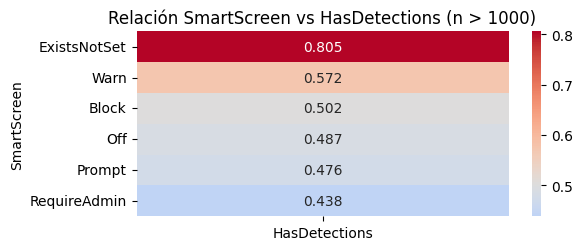

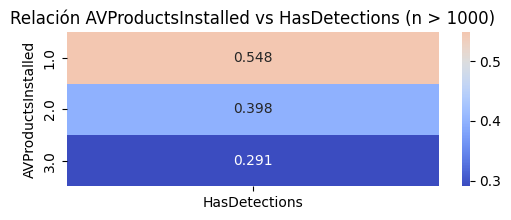

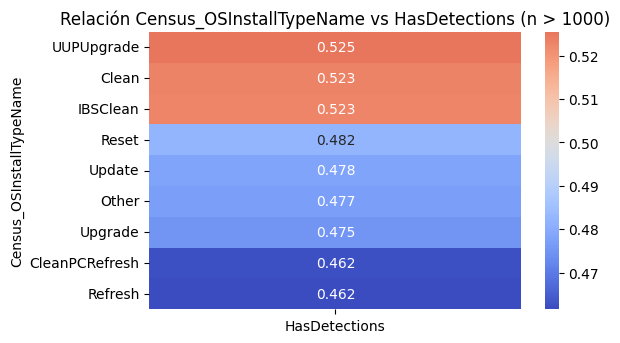

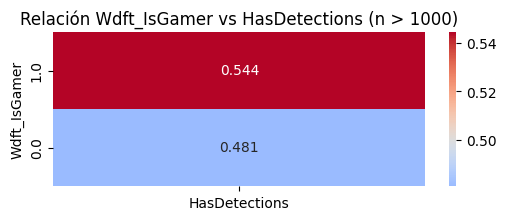

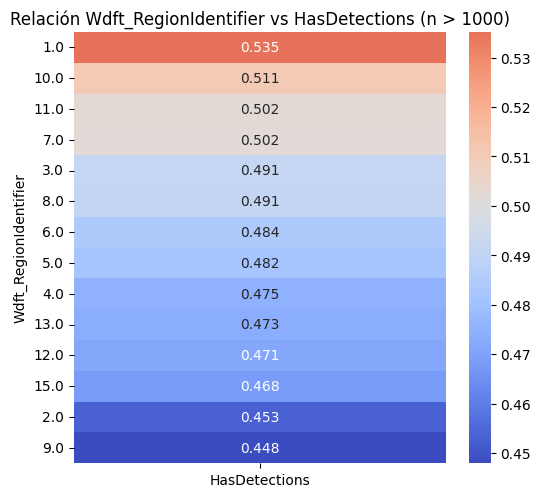

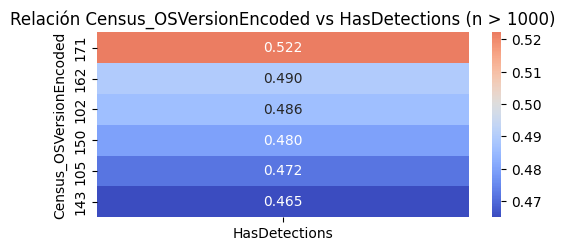

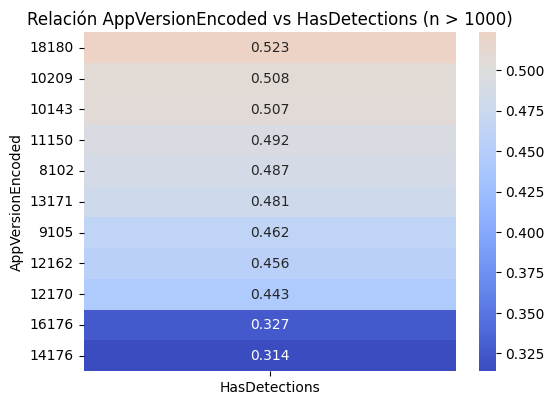

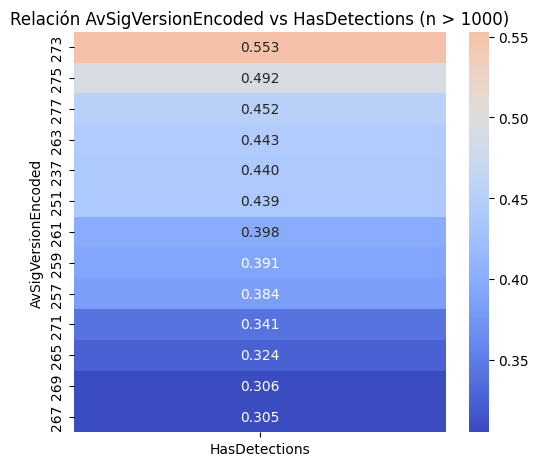

In [25]:
target = 'HasDetections'
min_casos = 1000  # Ajustable a 100 o 1000

for col in df_pruned_temp.columns:
    if col not in ['Unnamed: 0', target, 'MachineIdentifier'] and df_pruned_temp[col].nunique() < 100:
        # Filtramos categorías que tengan menos de 'min_casos'
        counts = df_pruned_temp[col].value_counts()
        mask = df_pruned_temp[col].isin(counts[counts >= min_casos].index)
        
        # Calculamos la probabilidad (media) solo para esos grupos
        res = df_pruned_temp[mask].groupby(col)[target].mean().sort_values(ascending=False).to_frame()
        
        if not res.empty:
            plt.figure(figsize=(6, max(2, len(res) * 0.4)))
            sns.heatmap(res, annot=True, cmap='coolwarm', center=0.5, fmt=".3f")
            plt.title(f"Relación {col} vs {target} (n > {min_casos})")
            plt.show()

C:\Users\j\AppData\Local\Temp\ipykernel_34972\55199950.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=col_orig, y=target, data=df[df[col_orig].isin(top_orig)],
C:\Users\j\AppData\Local\Temp\ipykernel_34972\55199950.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=col_encoded, y=target, data=df,


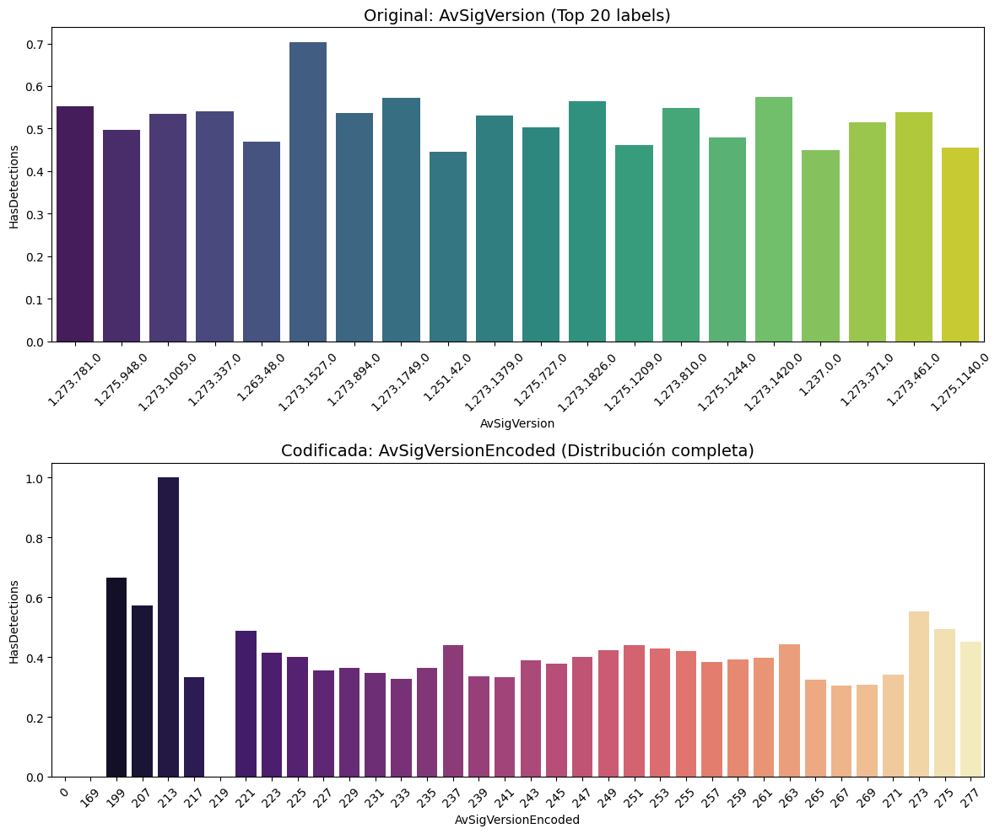

C:\Users\j\AppData\Local\Temp\ipykernel_34972\55199950.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=col_orig, y=target, data=df[df[col_orig].isin(top_orig)],
C:\Users\j\AppData\Local\Temp\ipykernel_34972\55199950.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=col_encoded, y=target, data=df,


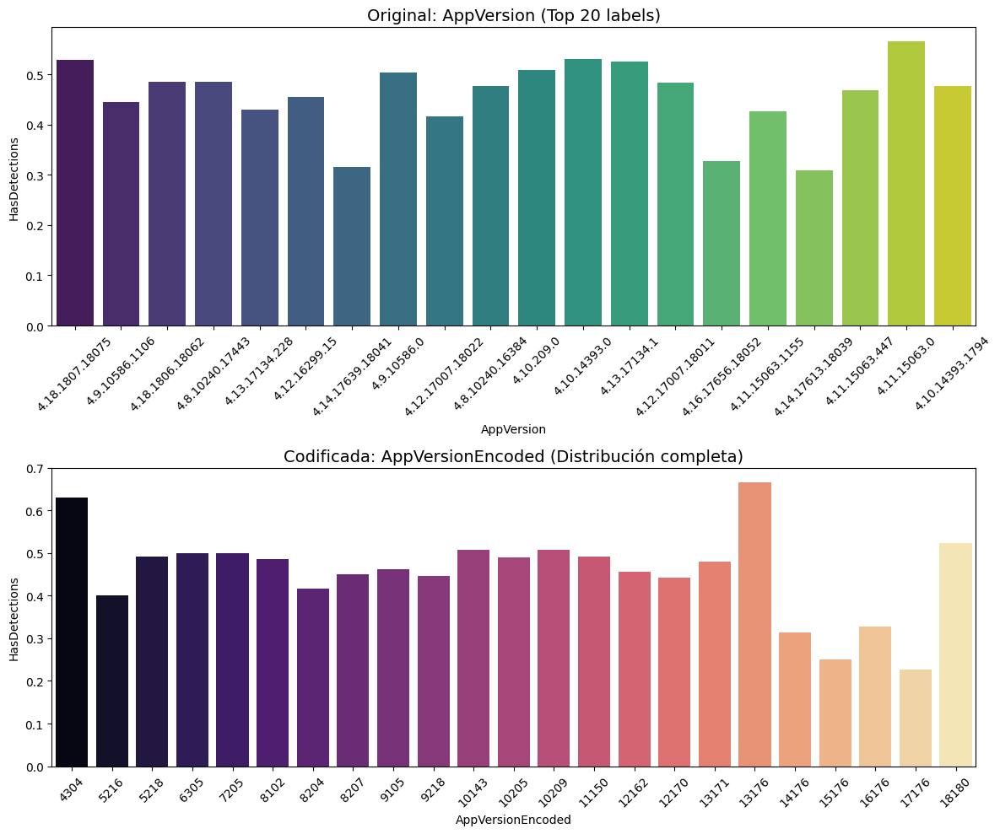

C:\Users\j\AppData\Local\Temp\ipykernel_34972\55199950.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=col_orig, y=target, data=df[df[col_orig].isin(top_orig)],
C:\Users\j\AppData\Local\Temp\ipykernel_34972\55199950.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=col_encoded, y=target, data=df,


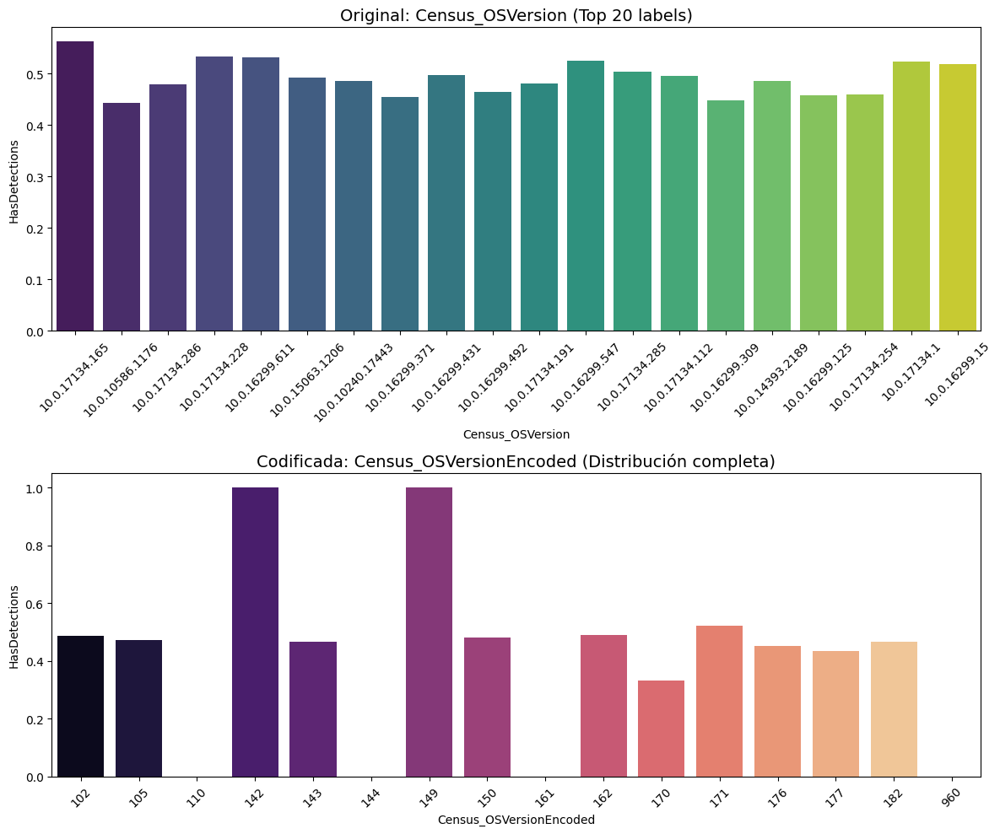

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_encoding_comparison(df, col_orig, col_encoded, target='HasDetections'):
    fig, axes = plt.subplots(2, 1, figsize=(12, 10))
    
    # Gráfico 1: Top 20 Categorías Originales (Dificultad de lectura)
    top_orig = df[col_orig].value_counts().head(20).index
    sns.barplot(x=col_orig, y=target, data=df[df[col_orig].isin(top_orig)], 
                ax=axes[0], palette='viridis', errorbar=None);
    axes[0].set_title(f'Original: {col_orig} (Top 20 labels)', fontsize=14);
    axes[0].tick_params(axis='x', rotation=45);
    
    # Gráfico 2: Todas las Categorías Codificadas (Señal clara)
    sns.barplot(x=col_encoded, y=target, data=df, 
                ax=axes[1], palette='magma', errorbar=None);
    axes[1].set_title(f'Codificada: {col_encoded} (Distribución completa)', fontsize=14);
    axes[1].tick_params(axis='x', rotation=45);
    
    plt.tight_layout();
    plt.show();

# Ejecución para tus tres columnas
cols_to_compare = [
    ('AvSigVersion', 'AvSigVersionEncoded'),
    ('AppVersion', 'AppVersionEncoded'),
    ('Census_OSVersion', 'Census_OSVersionEncoded')
]

for orig, enc in cols_to_compare:
    plot_encoding_comparison(df_pruned, orig, enc)

In [283]:
for col_prueba in df_pruned.select_dtypes(include=['object', 'category']).columns:
    # Calculamos el % de infecciones por categoría
    analisis = df_pruned.groupby(col_prueba)['HasDetections'].agg(['mean', 'count'])

    # Filtramos categorías con pocos datos para ver la tendencia real
    #analisis = analisis[analisis['count'] > 1000].sort_values(by='mean', ascending=False)

    print(f"Probabilidad de infección según {col_prueba}:")
    print(analisis)
    print("\n")

Probabilidad de infección según SmartScreen:
                  mean   count
SmartScreen                   
&#x01;        0.428571      14
&#x02;        0.550000      20
Block         0.502355    1274
ExistsNotSet  0.805426   58497
Off           0.486619   10388
On            0.679245      53
Prompt        0.475897    1950
RequireAdmin  0.438297  241594
Warn          0.571846    7530
off           0.573333      75
on            0.500000       8
requireadmin  0.000000       1


Probabilidad de infección según AvSigVersion:
                  mean  count
AvSigVersion                 
0.0.0.0       0.000000      4
1.169.55.0    0.000000      1
1.199.1615.0  0.666667      3
1.207.1891.0  1.000000      1
1.207.2950.0  0.500000      6
...                ...    ...
1.277.51.0    0.413625    411
1.277.58.0    0.328947     76
1.277.62.0    0.437500     80
1.277.64.0    0.450000     60
1.277.67.0    0.142857      7

[6455 rows x 2 columns]


Probabilidad de infección según AppVersion:
            

In [ ]:
df_inicial_2['EngineVersion'].str.split('.').str[2].str[2:4]

0         10
1         10
2         10
3         20
4         20
          ..
499995    20
499996    10
499997    30
499998    10
499999    10
Name: EngineVersion, Length: 500000, dtype: object

In [ ]:
df_inicial_3 = df_inicial_2.copy()

# Dividimos la cadena por el punto y extraemos las posiciones 2 y 3
# df_inicial_3['EngineMajorVersion'] = df_inicial_3['EngineVersion'].str.split('.').str[2].str[:2]
# df_inicial_3['EngineMinorVersion'] = df_inicial_3['EngineVersion'].str.split('.').str[2].str[2:4]
df_inicial_3['EngineMajorVersion'] = df_inicial_3['EngineVersion'].str.split('.').str[2].str[:4].astype(int)
df_inicial_3['EngineMinorVersion'] = df_inicial_3['EngineVersion'].str.split('.').str[3].astype(int)
df_inicial_3['EngineVersionIsStable'] = (df_inicial_3['EngineMinorVersion'] % 2 == 0).astype(int)

# Opcional: Convertirlas a tipo numérico para que el modelo entienda el orden
df_inicial_3['EngineMajorVersion'] = df_inicial_3['EngineMajorVersion'].astype(int)
df_inicial_3['EngineMinorVersion'] = df_inicial_3['EngineMinorVersion'].astype(int)

# Comprobamos los resultados
print(f"Categorías originales en EngineVersion: {df_inicial_2['EngineVersion'].nunique()}")
print(f"Nuevas categorías en EngineMajorVersion: {df_inicial_3['EngineMajorVersion'].nunique()}")
print(f"Nuevas categorías en EngineMinorVersion: {df_inicial_3['EngineMinorVersion'].nunique()}")
print(f"Distribución de versiones Estables (1) vs Inestables (0):")
print(df_inicial_3['EngineVersionIsStable'].value_counts())

# Ahora podrías incluso eliminar la original si no la necesitas
df_inicial_3.drop('EngineVersion', axis=1, inplace=True)

Categorías originales en EngineVersion: 53
Nuevas categorías en EngineMajorVersion: 32
Nuevas categorías en EngineMinorVersion: 7
Distribución de versiones Estables (1) vs Inestables (0):
EngineVersionIsStable
0    438921
1     61079
Name: count, dtype: int64


In [ ]:
df_inicial_3['EngineMajorVersion'].value_counts().sort_index(ascending=True)

EngineMajorVersion
1040         1
1170         3
1210         7
1240         1
1260         3
1270         1
1280       119
1290       321
1300       220
1310       236
1320       245
1330       516
1340       480
1350      3876
1360       420
1370       510
1380       520
1390       519
1400       808
1410      5247
1420       851
1430      1609
1440      1972
1450      2610
1460      9005
1470      2719
1480      7599
1490     12055
1500     14890
1510    205494
1520    216491
1530     10652
Name: count, dtype: int64

In [ ]:
df_inicial_3['EngineMinorVersion'].value_counts().sort_index(ascending=True)

EngineMinorVersion
0     16513
1    422174
2     16743
3      7680
4     21054
5      9067
6      6769
Name: count, dtype: int64

In [ ]:
# 1. Preparación rápida (solo para ver importancia)
df_temp = df_inicial_3.copy().fillna(-1) # Relleno rápido

for col in df_temp.select_dtypes(include=['object']).columns:
    df_temp[col] = LabelEncoder().fit_transform(df_temp[col].astype(str))

# 2. Entrenamos un modelo rápido
X_quick = df_temp.drop(columns=['HasDetections', 'MachineIdentifier'])
y_quick = df_temp['HasDetections']

model = RandomForestClassifier(n_estimators=50, max_depth=5, random_state=42)
model.fit(X_quick, y_quick)

# 3. Extraemos importancia
importancias = pd.Series(model.feature_importances_, index=X_quick.columns).sort_values(ascending=False)
print("Top 15 variables sugeridas por el modelo:")
print(importancias.head(15))

Top 15 variables sugeridas por el modelo:
AVProductsInstalled                                  0.180162
AVProductStatesIdentifier                            0.141569
SmartScreen                                          0.129742
EngineMajorVersion                                   0.056005
EngineMinorVersion                                   0.054037
AvSigVersion                                         0.049825
Census_TotalPhysicalRAM                              0.047128
Census_InternalPrimaryDiagonalDisplaySizeInInches    0.036797
EngineVersionIsStable                                0.027595
Census_PrimaryDiskTotalCapacity                      0.025011
Census_ThresholdOptIn                                0.019984
Census_OSArchitecture                                0.017229
Census_IsVirtualDevice                               0.013565
Census_SystemVolumeTotalCapacity                     0.013299
AppVersion                                           0.012746
dtype: float64
